In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv('txr_1.csv')

In [3]:
examsttns = df['EXAMSTTN'].value_counts()
for i,j in examsttns.items():
    print(f'{i} : {j}')

DDU : 9553
BLEY : 7087
NKJ : 6594
GD : 5472
BSL : 4854
GIMY : 4095
STA : 3772
RYD : 3711
ICDD : 3680
TICD : 3574
SMP : 3100
KRCA : 3041
BNDM : 2804
FL : 2593
NJPT : 2492
KJGY : 2446
HAPA : 2372
BKEY : 2343
ADTP : 2312
KTTY : 2287
NGCT : 2150
RDM : 2021
BKDC : 1971
BZA : 1875
GY : 1834
BPA : 1815
BRWD : 1813
PTRU : 1811
PRDP : 1677
BJE : 1651
PEH : 1573
DBEC : 1536
OBR : 1480
PKR : 1399
TNPM : 1376
EMTY : 1330
COA : 1272
MLDT : 1271
OEC : 1242
BIA : 1196
SSB : 1180
JSWT : 1169
NHYD : 1148
GMC : 1145
UDLU : 1138
DICD : 1136
NBQY : 1135
HPT : 1075
JTJ : 1070
SGWF : 1063
SMYD : 1062
GHZ : 1062
JUC : 1052
FPY : 1044
PLPC : 1036
UMB : 994
BTI : 991
MRJ : 959
JSWD : 952
BAD : 944
NPRY : 941
DPS : 911
NLPD : 876
NATD : 868
DKJ : 803
ED : 793
WDD : 782
DD : 727
MXA : 721
SNF : 702
ETYD : 654
KLMG : 640
CTKR : 612
TKD : 607
AJNI : 586
LDH : 577
MKPP : 566
REJN : 554
BTTR : 544
CCJS : 530
PGFS : 530
GDGH : 521
CT : 518
MVN : 515
ET : 499
ADRA : 494
IPN : 493
MLPM : 493
CP : 488
JMP : 483
UTCM : 4

## ICDD Exam Station - EDA

In [4]:
icdd = df[df['EXAMSTTN'] == 'ICDD'].copy()
icdd.count()

RDATE            3680
RAKETYPE         3680
EXAMSTTN         3680
ZONE             3680
ARVLTIME         3680
PLCTTIME         3680
RELSTIME         3680
DPRTTIME         3680
AR_TO_PL         3680
PL_TO_RL         3680
RL_TO_DP         3680
TOTAL_TIME       3680
R_DATEOFMONTH    3680
R_MONTH          3680
R_DAYOFWEEK      3680
R_WEEK           3680
ARVL_H           3680
PLCT_H           3680
RELS_H           3680
DPRT_H           3680
dtype: int64

In [5]:
icdd.nunique()

RDATE             365
RAKETYPE            4
EXAMSTTN            1
ZONE                1
ARVLTIME         3516
PLCTTIME         3547
RELSTIME         3515
DPRTTIME         3530
AR_TO_PL          554
PL_TO_RL          387
RL_TO_DP          400
TOTAL_TIME       1023
R_DATEOFMONTH     365
R_MONTH            12
R_DAYOFWEEK         7
R_WEEK             53
ARVL_H             24
PLCT_H             24
RELS_H             24
DPRT_H             24
dtype: int64

In [6]:
icdd.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
193,2024-04-01,BLC,ICDD,NC,2024-04-01 00:01:00,2024-04-01 05:20:00,2024-04-01 07:35:00,2024-04-01 07:35:00,319,135,0,454,2024-04-01,2024-04,0,W-14-2024,0,5,7,7
194,2024-04-01,BLC,ICDD,NC,2024-03-30 23:49:00,2024-03-31 10:50:00,2024-04-01 09:35:00,2024-04-01 09:35:00,661,1365,0,2026,2024-04-01,2024-04,0,W-14-2024,23,10,9,9
195,2024-04-01,BLC,ICDD,NC,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-04-01 02:45:00,0,0,225,225,2024-04-01,2024-04,0,W-14-2024,23,23,23,2
196,2024-04-01,BLC,ICDD,NC,2024-04-01 01:00:00,2024-04-01 01:00:00,2024-04-01 01:00:00,2024-04-01 02:20:00,0,0,80,80,2024-04-01,2024-04,0,W-14-2024,1,1,1,2
197,2024-04-01,BLL,ICDD,NC,2024-04-01 16:09:00,2024-04-01 16:09:00,2024-04-01 16:09:00,2024-04-01 16:49:00,0,0,40,40,2024-04-01,2024-04,0,W-14-2024,16,16,16,16


In [7]:
print(icdd['RAKETYPE'].nunique())
icdd['RAKETYPE'].value_counts()

4


RAKETYPE
BLC     3611
BLL       31
BKI       30
BLSS       8
Name: count, dtype: int64

In [8]:
print(icdd['ZONE'].nunique())
icdd['ZONE'].value_counts()

1


ZONE
NC    3680
Name: count, dtype: int64

#### New Features

In [9]:
df1 = icdd.copy()

In [10]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [11]:
df1['ARVLTIME'] = pd.to_datetime(df1['ARVLTIME'], format='%Y-%m-%d %H:%M:%S')
df1['PLCTTIME'] = pd.to_datetime(df1['PLCTTIME'], format='%Y-%m-%d %H:%M:%S')
df1['RELSTIME'] = pd.to_datetime(df1['RELSTIME'], format='%Y-%m-%d %H:%M:%S')
df1['DPRTTIME'] = pd.to_datetime(df1['DPRTTIME'], format='%Y-%m-%d %H:%M:%S')

In [12]:
df1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,R_DAYOFWEEK,R_WEEK,ARVL_H,PLCT_H,RELS_H,DPRT_H
0,2024-04-01,BLC,ICDD,NC,2024-03-30 23:49:00,2024-03-31 10:50:00,2024-04-01 09:35:00,2024-04-01 09:35:00,661,1365,0,2026,2024-04-01,2024-04,0,W-14-2024,23,10,9,9
1,2024-04-03,BLC,ICDD,NC,2024-03-30 23:53:00,2024-04-03 15:50:00,2024-04-03 17:30:00,2024-04-03 17:30:00,5277,100,0,5377,2024-04-03,2024-04,2,W-14-2024,23,15,17,17
2,2024-04-11,BLC,ICDD,NC,2024-03-31 15:10:00,2024-03-31 21:20:00,2024-04-03 13:05:00,2024-04-11 15:00:00,370,3825,11635,15830,2024-04-11,2024-04,3,W-15-2024,15,21,13,15
3,2024-04-01,BLC,ICDD,NC,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-04-01 00:55:00,0,0,295,295,2024-04-01,2024-04,0,W-14-2024,20,20,20,0
4,2024-04-01,BLC,ICDD,NC,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-04-01 02:45:00,0,0,225,225,2024-04-01,2024-04,0,W-14-2024,23,23,23,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3675,2025-03-31,BLC,ICDD,NC,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 09:05:00,0,0,125,125,2025-03-31,2025-03,0,W-14-2025,7,7,7,9
3676,2025-03-31,BLC,ICDD,NC,2025-03-31 07:37:00,2025-03-31 07:55:00,2025-03-31 08:05:00,2025-03-31 08:05:00,18,10,0,28,2025-03-31,2025-03,0,W-14-2025,7,7,8,8
3677,2025-03-31,BLC,ICDD,NC,2025-03-31 11:50:00,2025-03-31 14:00:00,2025-03-31 15:50:00,2025-03-31 15:50:00,130,110,0,240,2025-03-31,2025-03,0,W-14-2025,11,14,15,15
3678,2025-03-31,BLC,ICDD,NC,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:26:00,0,0,24,24,2025-03-31,2025-03,0,W-14-2025,18,18,18,18


In [13]:
# Count of rakes in shunting time (AR_TO_PL) when the current rake arrives
# Shunting time for a rake is from its ARVLTIME to its PLCTTIME

num_rakes_shunting = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have arrived BEFORE or AT current_arrival_time
    # AND whose placement time is AFTER current_arrival_time
    # (meaning they are still in shunting phase)
    # Exclude the current rake itself from the count if its ARVLTIME == current_arrival_time
        
    # Filter for rakes whose shunting period overlaps with the current_arrival_time
    # A rake is in shunting if current_arrival_time is between its ARVLTIME and PLCTTIME
        
    # Filter rakes that started shunting before or at the current rake's arrival time
    potential_rakes = df1[(df1['ARVLTIME'] <= current_arrival_time) & (df1.index != i)]
        
    # From those, count how many are still in shunting phase (their PLCTTIME is in the future relative to current_arrival_time)
    count = potential_rakes[potential_rakes['PLCTTIME'] > current_arrival_time].shape[0]
    num_rakes_shunting.append(count)
df1['Num_Rakes_Shunting_At_ARVL'] = num_rakes_shunting

In [14]:
df1[['ARVLTIME', 'PLCTTIME', 'Num_Rakes_Shunting_At_ARVL']]

,ARVLTIME,PLCTTIME,Num_Rakes_Shunting_At_ARVL
0,2024-03-30 23:49:00,2024-03-31 10:50:00,0
1,2024-03-30 23:53:00,2024-04-03 15:50:00,1
2,2024-03-31 15:10:00,2024-03-31 21:20:00,1
3,2024-03-31 20:00:00,2024-03-31 20:00:00,2
4,2024-03-31 23:00:00,2024-03-31 23:00:00,2
...,...,...,...
3675,2025-03-31 07:00:00,2025-03-31 07:00:00,0
3676,2025-03-31 07:37:00,2025-03-31 07:55:00,0
3677,2025-03-31 11:50:00,2025-03-31 14:00:00,0
3678,2025-03-31 18:02:00,2025-03-31 18:02:00,0


In [15]:
# Count of rakes in examination time (PL_TO_RL) when the current rake arrives
# Examination time for a rake is from its PLCTTIME to its RELSTIME

num_rakes_exam = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been placed BEFORE or AT current_arrival_time
    # AND whose release time is AFTER current_arrival_time
    # (meaning they are still in examination phase)
            
    potential_rakes = df1[(df1['PLCTTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_arrival_time].shape[0]
    num_rakes_exam.append(count)
df1['Num_Rakes_Exam_At_ARVL'] = num_rakes_exam

In [16]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'Num_Rakes_Exam_At_ARVL']]

,ARVLTIME,PLCTTIME,RELSTIME,Num_Rakes_Exam_At_ARVL
0,2024-03-30 23:49:00,2024-03-31 10:50:00,2024-04-01 09:35:00,0
1,2024-03-30 23:53:00,2024-04-03 15:50:00,2024-04-03 17:30:00,0
2,2024-03-31 15:10:00,2024-03-31 21:20:00,2024-04-03 13:05:00,1
3,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-03-31 20:00:00,1
4,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-03-31 23:00:00,2
...,...,...,...,...
3675,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 07:00:00,0
3676,2025-03-31 07:37:00,2025-03-31 07:55:00,2025-03-31 08:05:00,0
3677,2025-03-31 11:50:00,2025-03-31 14:00:00,2025-03-31 15:50:00,0
3678,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:02:00,0


In [17]:
# Count of rakes in departure time (RL_TO_DP) when the current rake arrives
# Departure time for a rake is from its RELSTIME to its DPRTTIME

num_rakes_departure = []
for i, current_rake in df1.iterrows():
    current_arrival_time = current_rake['ARVLTIME']
        
    # Count rakes that have been released BEFORE or AT current_arrival_time
    # AND whose departure time is AFTER current_arrival_time
    # (meaning they are still in departure phase)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_arrival_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_arrival_time].shape[0]
    num_rakes_departure.append(count)
df1['Num_Rakes_Departure_At_ARVL'] = num_rakes_departure

In [18]:
df1[['ARVLTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_ARVL']]

,ARVLTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_ARVL
0,2024-03-30 23:49:00,2024-04-01 09:35:00,2024-04-01 09:35:00,0
1,2024-03-30 23:53:00,2024-04-03 17:30:00,2024-04-03 17:30:00,0
2,2024-03-31 15:10:00,2024-04-03 13:05:00,2024-04-11 15:00:00,0
3,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-04-01 00:55:00,0
4,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-04-01 02:45:00,1
...,...,...,...,...
3675,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 09:05:00,0
3676,2025-03-31 07:37:00,2025-03-31 08:05:00,2025-03-31 08:05:00,1
3677,2025-03-31 11:50:00,2025-03-31 15:50:00,2025-03-31 15:50:00,0
3678,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:26:00,0


In [19]:
num_rakes_exam_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Identifying other rakes that are in their examination phase at this 'current_placement_time'.
    # A rake 'other_rake' is in examination if:
    # 1. Its placement time (start of exam) is less than or equal to 'current_placement_time'.
    # 2. Its release time (end of exam) is greater than 'current_placement_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['PLCTTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['RELSTIME'] > current_placement_time].shape[0]
    num_rakes_exam_at_placement.append(count)
        
df1['Num_Rakes_Exam_At_PLCT'] = num_rakes_exam_at_placement

In [20]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Exam_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Exam_At_PLCT
0,2024-03-30 23:49:00,2024-03-31 10:50:00,2024-04-01 09:35:00,2024-04-01 09:35:00,0
1,2024-03-30 23:53:00,2024-04-03 15:50:00,2024-04-03 17:30:00,2024-04-03 17:30:00,0
2,2024-03-31 15:10:00,2024-03-31 21:20:00,2024-04-03 13:05:00,2024-04-11 15:00:00,1
3,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-04-01 00:55:00,1
4,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-04-01 02:45:00,2
...,...,...,...,...,...
3675,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 09:05:00,0
3676,2025-03-31 07:37:00,2025-03-31 07:55:00,2025-03-31 08:05:00,2025-03-31 08:05:00,0
3677,2025-03-31 11:50:00,2025-03-31 14:00:00,2025-03-31 15:50:00,2025-03-31 15:50:00,0
3678,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:26:00,0


In [21]:
# Count of rakes in departure time (RL_TO_DP) when the current rake is in its examination time
# This means, for a current rake (i), count others that are in RL_TO_DP phase
# at the current rake's PLCTTIME (start of examination) or RELSTIME (end of examination, start of departure phase)
# The request states "at the point of time when the current rakes is in their examination time".
# Let's interpret this as the *start* of the current rake's examination, which is PLCTTIME, as it's a fixed point.

num_rakes_departure_at_placement = []
for i, current_rake in df1.iterrows():
    current_placement_time = current_rake['PLCTTIME']
        
    # Count rakes that have been released BEFORE or AT current_placement_time
    # AND whose departure time is AFTER current_placement_time
    # (meaning they are still in departure phase)
    # Exclude the current rake itself if its RELSTIME or DPRTTIME overlap (though unlikely here)
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_placement_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_placement_time].shape[0]
    num_rakes_departure_at_placement.append(count)
df1['Num_Rakes_Departure_At_PLCT'] = num_rakes_departure_at_placement

In [22]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_PLCT']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_PLCT
0,2024-03-30 23:49:00,2024-03-31 10:50:00,2024-04-01 09:35:00,2024-04-01 09:35:00,0
1,2024-03-30 23:53:00,2024-04-03 15:50:00,2024-04-03 17:30:00,2024-04-03 17:30:00,3
2,2024-03-31 15:10:00,2024-03-31 21:20:00,2024-04-03 13:05:00,2024-04-11 15:00:00,1
3,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-04-01 00:55:00,0
4,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-04-01 02:45:00,1
...,...,...,...,...,...
3675,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 09:05:00,0
3676,2025-03-31 07:37:00,2025-03-31 07:55:00,2025-03-31 08:05:00,2025-03-31 08:05:00,1
3677,2025-03-31 11:50:00,2025-03-31 14:00:00,2025-03-31 15:50:00,2025-03-31 15:50:00,0
3678,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:26:00,0


In [23]:
num_rakes_departure_at_release = []
for i, current_rake in df1.iterrows():
    current_release_time = current_rake['RELSTIME']
        
    # Identifying other rakes that are in their departure phase at this 'current_release_time'.
    # A rake 'other_rake' is in departure if:
    # 1. Its release time (start of departure) is less than or equal to 'current_release_time'.
    # 2. Its departure time (end of departure) is greater than 'current_release_time'.
    # 3. It is not the 'current_rake' itself (by index).
        
    potential_rakes = df1[(df1['RELSTIME'] <= current_release_time) & (df1.index != i)]
    count = potential_rakes[potential_rakes['DPRTTIME'] > current_release_time].shape[0]
    num_rakes_departure_at_release.append(count)
        
df1['Num_Rakes_Departure_At_RELS'] = num_rakes_departure_at_release

In [24]:
df1[['ARVLTIME', 'PLCTTIME', 'RELSTIME', 'DPRTTIME', 'Num_Rakes_Departure_At_RELS']]

,ARVLTIME,PLCTTIME,RELSTIME,DPRTTIME,Num_Rakes_Departure_At_RELS
0,2024-03-30 23:49:00,2024-03-31 10:50:00,2024-04-01 09:35:00,2024-04-01 09:35:00,1
1,2024-03-30 23:53:00,2024-04-03 15:50:00,2024-04-03 17:30:00,2024-04-03 17:30:00,3
2,2024-03-31 15:10:00,2024-03-31 21:20:00,2024-04-03 13:05:00,2024-04-11 15:00:00,2
3,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-03-31 20:00:00,2024-04-01 00:55:00,0
4,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-03-31 23:00:00,2024-04-01 02:45:00,1
...,...,...,...,...,...
3675,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 07:00:00,2025-03-31 09:05:00,0
3676,2025-03-31 07:37:00,2025-03-31 07:55:00,2025-03-31 08:05:00,2025-03-31 08:05:00,1
3677,2025-03-31 11:50:00,2025-03-31 14:00:00,2025-03-31 15:50:00,2025-03-31 15:50:00,0
3678,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:02:00,2025-03-31 18:26:00,0


In [25]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3680 entries, 0 to 3679
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        3680 non-null   object        
 1   RAKETYPE                     3680 non-null   object        
 2   EXAMSTTN                     3680 non-null   object        
 3   ZONE                         3680 non-null   object        
 4   ARVLTIME                     3680 non-null   datetime64[ns]
 5   PLCTTIME                     3680 non-null   datetime64[ns]
 6   RELSTIME                     3680 non-null   datetime64[ns]
 7   DPRTTIME                     3680 non-null   datetime64[ns]
 8   AR_TO_PL                     3680 non-null   int64         
 9   PL_TO_RL                     3680 non-null   int64         
 10  RL_TO_DP                     3680 non-null   int64         
 11  TOTAL_TIME                   3680 non-null 

In [26]:
# Time since last Arrival
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)
df1['Time_Since_Last_ARVL'] = df1.groupby('EXAMSTTN')['ARVLTIME'].diff().dt.total_seconds()//60

In [27]:
# Time since last Placement
df1 = df1.sort_values(by='PLCTTIME').reset_index(drop=True)
df1['Time_Since_Last_PLCT'] = df1.groupby('EXAMSTTN')['PLCTTIME'].diff().dt.total_seconds()//60

In [28]:
df1 = df1.sort_values(by='RELSTIME').reset_index(drop=True)
df1['Time_Since_Last_RELS'] = df1.groupby('EXAMSTTN')['RELSTIME'].diff().dt.total_seconds()//60

In [29]:
df1 = df1.sort_values(by='DPRTTIME').reset_index(drop=True)
df1['Time_Since_Last_DPRT'] = df1.groupby('EXAMSTTN')['DPRTTIME'].diff().dt.total_seconds()//60

In [30]:
df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']] = \
    df1[['Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']].fillna(0)

In [31]:
df1 = df1.sort_values(by='ARVLTIME').reset_index(drop=True)

In [32]:
df1[['ARVLTIME', 'Time_Since_Last_ARVL', 'Time_Since_Last_PLCT', 'Time_Since_Last_RELS', 'Time_Since_Last_DPRT']]

,ARVLTIME,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-03-30 23:49:00,0.0,0.0,120.0,120.0
1,2024-03-30 23:53:00,4.0,20.0,40.0,45.0
2,2024-03-31 15:10:00,917.0,80.0,5.0,605.0
3,2024-03-31 20:00:00,290.0,550.0,0.0,0.0
4,2024-03-31 23:00:00,180.0,100.0,180.0,25.0
...,...,...,...,...,...
3675,2025-03-31 07:00:00,700.0,595.0,460.0,60.0
3676,2025-03-31 07:37:00,37.0,55.0,65.0,525.0
3677,2025-03-31 11:50:00,253.0,365.0,465.0,405.0
3678,2025-03-31 18:02:00,372.0,242.0,132.0,156.0


In [33]:
df1.drop(columns=['ARVLTIME','PLCTTIME','RELSTIME','DPRTTIME'], axis=1, inplace=True)

In [34]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3680 entries, 0 to 3679
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   RDATE                        3680 non-null   object 
 1   RAKETYPE                     3680 non-null   object 
 2   EXAMSTTN                     3680 non-null   object 
 3   ZONE                         3680 non-null   object 
 4   AR_TO_PL                     3680 non-null   int64  
 5   PL_TO_RL                     3680 non-null   int64  
 6   RL_TO_DP                     3680 non-null   int64  
 7   TOTAL_TIME                   3680 non-null   int64  
 8   R_DATEOFMONTH                3680 non-null   object 
 9   R_MONTH                      3680 non-null   object 
 10  R_DAYOFWEEK                  3680 non-null   int64  
 11  R_WEEK                       3680 non-null   object 
 12  ARVL_H                       3680 non-null   int64  
 13  PLCT_H            

#### Monthly Analysis

In [35]:
icdd_monthly = df1['R_MONTH'].value_counts(sort=False).reset_index()
icdd_monthly.columns =['R_MONTH','RAKE_COUNT']
icdd_monthly = pd.DataFrame(icdd_monthly)

monthly_shunting_time_sum = df1.groupby('R_MONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby('R_MONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby('R_MONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby('R_MONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby('R_MONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

icdd_monthly['AVG_SHUNTING_TIME'] = monthly_shunting_time_sum['Shunting_Time'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_EXAMINATION_TIME'] = monthly_examination_time_sum['Examination_Time'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_DEPARTURE_TIME'] = monthly_departure_lag_time_sum['Departure_Lag'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_numrakes1['numrakes1'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_numrakes2['numrakes2'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_numrakes3['numrakes3'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_numrakes4['numrakes4'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_numrakes5['numrakes5'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Num_Rakes_Departure_At_RELS'] = monthly_numrakes6['numrakes6'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Time_Since_Last_ARVL'] = monthly_timesince1['timesince1'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Time_Since_Last_PLCT'] = monthly_timesince2['timesince2'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Time_Since_Last_RELS'] = monthly_timesince3['timesince3'] / icdd_monthly['RAKE_COUNT']
icdd_monthly['AVG_Time_Since_Last_DPRT'] = monthly_timesince4['timesince4'] / icdd_monthly['RAKE_COUNT']

icdd_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,286,267.405594,284.024476,204.080420,1.741259,1.811189,1.555944,1.608392,1.562937,1.552448,153.377622,152.447552,150.909091,150.646853
1,2024-05,274,210.467153,258.083942,197.594891,1.087591,1.686131,1.233577,1.554745,1.251825,1.368613,163.408759,161.989051,162.934307,163.007299
2,2024-06,306,129.058824,273.705882,152.120915,0.787582,1.869281,1.071895,1.692810,1.042484,1.003268,139.454248,139.901961,141.490196,140.705882
3,2024-07,347,157.677233,264.106628,171.239193,1.146974,2.011527,1.420749,1.844380,1.495677,1.492795,128.951009,130.201729,128.775216,128.991354
4,2024-08,351,207.096866,263.481481,107.467236,1.450142,1.934473,0.786325,1.689459,0.792023,0.740741,129.037037,127.051282,126.823362,126.866097
5,2024-09,346,198.609827,237.037572,241.956647,1.494220,1.690751,1.982659,1.566474,2.052023,1.982659,124.407514,125.430636,124.884393,124.624277
6,2024-10,307,189.381107,274.338762,270.179153,1.133550,1.814332,1.925081,1.684039,1.980456,2.032573,145.521173,145.149837,145.179153,145.179153
7,2024-11,265,183.607547,286.649057,205.743396,1.022642,1.800000,1.335849,1.683019,1.384906,1.381132,162.886792,162.716981,163.867925,164.188679
8,2024-12,310,159.432258,302.132258,138.067742,0.893548,1.806452,0.890323,1.645161,0.893548,0.854839,145.032258,144.790323,143.645161,143.661290
9,2025-01,292,157.328767,311.736301,231.482877,0.900685,1.993151,1.609589,1.924658,1.654110,1.609589,149.366438,150.821918,153.065068,153.202055


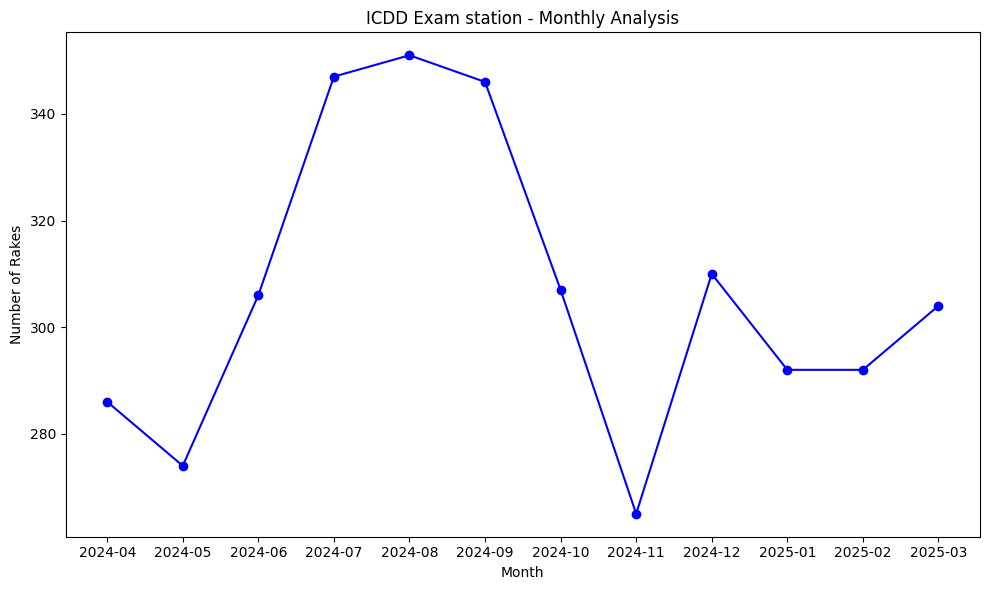

In [36]:
plt.figure(figsize=(10,6))
plt.plot(icdd_monthly['R_MONTH'], icdd_monthly['RAKE_COUNT'], marker='o', linestyle='-', color='blue')
plt.title('ICDD Exam station - Monthly Analysis')
plt.xlabel('Month')
plt.ylabel('Number of Rakes')
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3097665359.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3097665359.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3097665359.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd

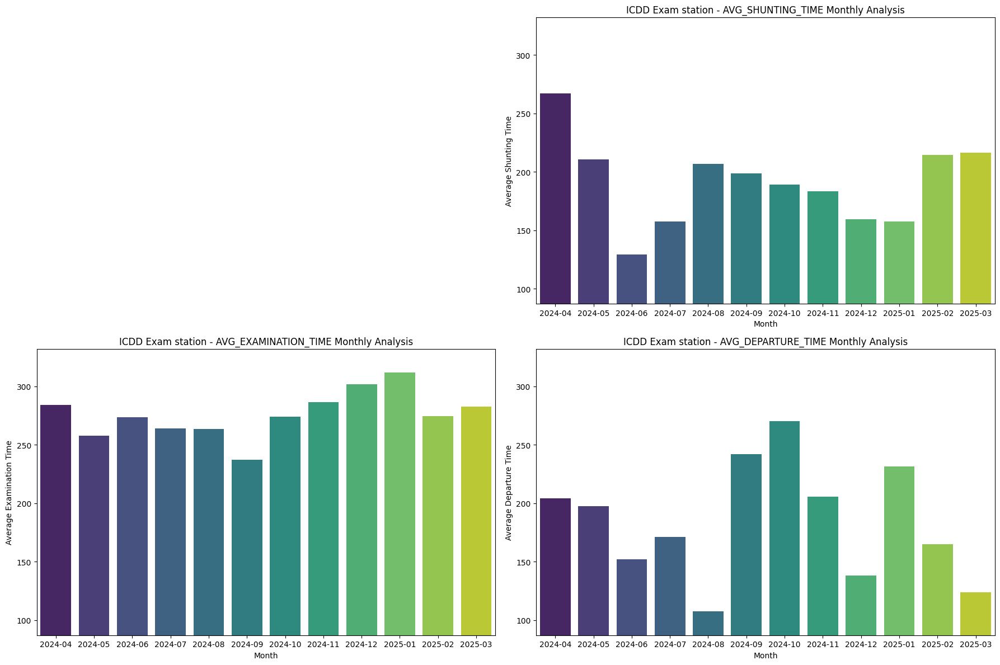

In [37]:
min_y = min(icdd_monthly['AVG_SHUNTING_TIME'].min(),
            icdd_monthly['AVG_EXAMINATION_TIME'].min(),
            icdd_monthly['AVG_DEPARTURE_TIME'].min())

max_y = max(icdd_monthly['AVG_SHUNTING_TIME'].max(),
            icdd_monthly['AVG_EXAMINATION_TIME'].max(),
            icdd_monthly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

axes[0, 0].axis('off')

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_SHUNTING_TIME Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_EXAMINATION_TIME Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('ICDD Exam station - AVG_DEPARTURE_TIME Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_20120\2125492258.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\2125492258.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\2125492258.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

 

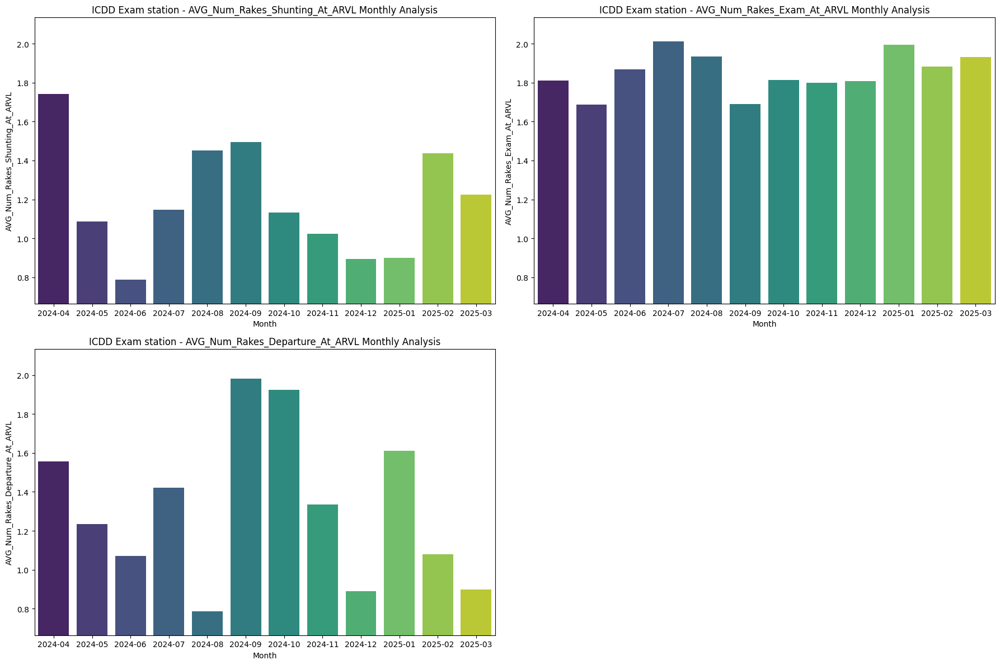

In [38]:
min_y = min(icdd_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            icdd_monthly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            icdd_monthly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(icdd_monthly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            icdd_monthly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            icdd_monthly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1248005361.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1248005361.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1248005361.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



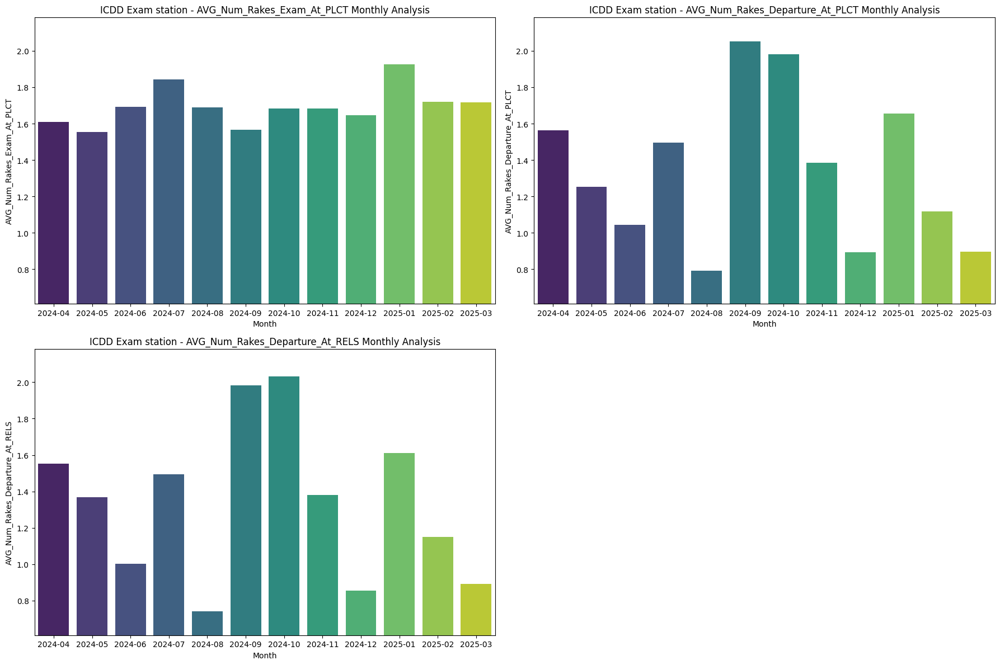

In [39]:
min_y = min(icdd_monthly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            icdd_monthly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            icdd_monthly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(icdd_monthly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            icdd_monthly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            icdd_monthly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [40]:
icdd_monthly

,R_MONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,286,267.405594,284.024476,204.080420,1.741259,1.811189,1.555944,1.608392,1.562937,1.552448,153.377622,152.447552,150.909091,150.646853
1,2024-05,274,210.467153,258.083942,197.594891,1.087591,1.686131,1.233577,1.554745,1.251825,1.368613,163.408759,161.989051,162.934307,163.007299
2,2024-06,306,129.058824,273.705882,152.120915,0.787582,1.869281,1.071895,1.692810,1.042484,1.003268,139.454248,139.901961,141.490196,140.705882
3,2024-07,347,157.677233,264.106628,171.239193,1.146974,2.011527,1.420749,1.844380,1.495677,1.492795,128.951009,130.201729,128.775216,128.991354
4,2024-08,351,207.096866,263.481481,107.467236,1.450142,1.934473,0.786325,1.689459,0.792023,0.740741,129.037037,127.051282,126.823362,126.866097
5,2024-09,346,198.609827,237.037572,241.956647,1.494220,1.690751,1.982659,1.566474,2.052023,1.982659,124.407514,125.430636,124.884393,124.624277
6,2024-10,307,189.381107,274.338762,270.179153,1.133550,1.814332,1.925081,1.684039,1.980456,2.032573,145.521173,145.149837,145.179153,145.179153
7,2024-11,265,183.607547,286.649057,205.743396,1.022642,1.800000,1.335849,1.683019,1.384906,1.381132,162.886792,162.716981,163.867925,164.188679
8,2024-12,310,159.432258,302.132258,138.067742,0.893548,1.806452,0.890323,1.645161,0.893548,0.854839,145.032258,144.790323,143.645161,143.661290
9,2025-01,292,157.328767,311.736301,231.482877,0.900685,1.993151,1.609589,1.924658,1.654110,1.609589,149.366438,150.821918,153.065068,153.202055


C:\Users\anant\AppData\Local\Temp\ipykernel_20120\905406729.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\905406729.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\905406729.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplo

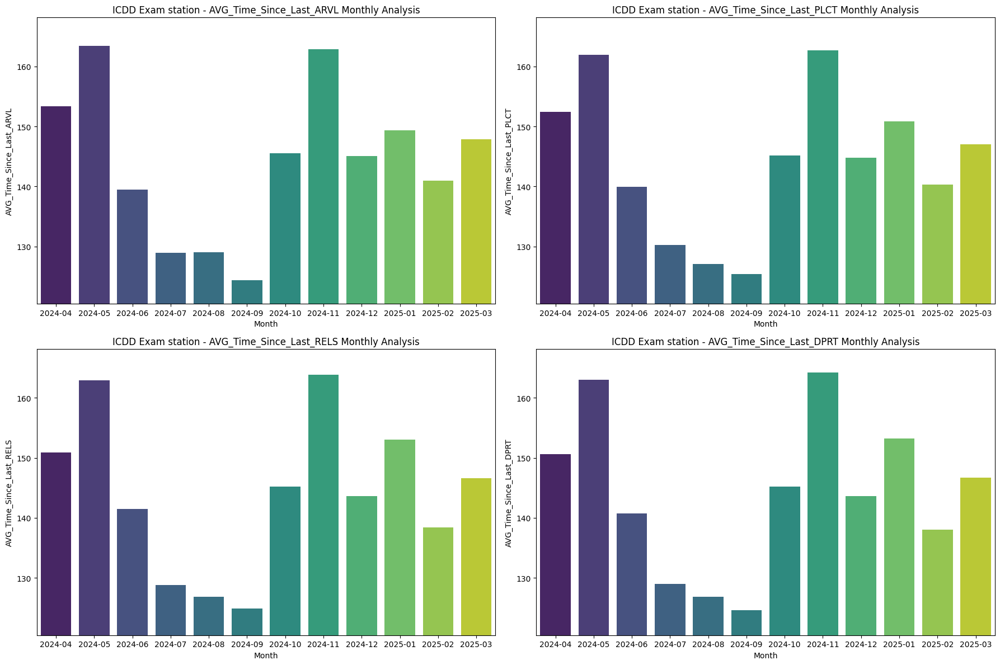

In [41]:
min_y = min(icdd_monthly['AVG_Time_Since_Last_ARVL'].min(),
            icdd_monthly['AVG_Time_Since_Last_PLCT'].min(),
            icdd_monthly['AVG_Time_Since_Last_RELS'].min(),
            icdd_monthly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(icdd_monthly['AVG_Time_Since_Last_ARVL'].max(),
            icdd_monthly['AVG_Time_Since_Last_PLCT'].max(),
            icdd_monthly['AVG_Time_Since_Last_RELS'].max(),
            icdd_monthly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam station - AVG_Time_Since_Last_ARVL Monthly Analysis')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_Time_Since_Last_PLCT Monthly Analysis')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_Time_Since_Last_RELS Monthly Analysis')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_monthly['R_MONTH'], y=icdd_monthly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('ICDD Exam station - AVG_Time_Since_Last_DPRT Monthly Analysis')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [42]:
monthly_rake_type_count = df1.groupby(['R_MONTH', 'RAKETYPE'])['RDATE'].count().reset_index(name='RAKE_COUNT')
monthly_rake_type_count = pd.DataFrame(monthly_rake_type_count)

monthly_shunting_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
monthly_examination_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
monthly_departure_lag_time_sum = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
monthly_numrakes1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
monthly_numrakes2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
monthly_numrakes3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
monthly_numrakes4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
monthly_numrakes5 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
monthly_numrakes6 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
monthly_timesince1 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
monthly_timesince2 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
monthly_timesince3 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
monthly_timesince4 = df1.groupby(['R_MONTH', 'RAKETYPE'], sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_shunting_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_SHUNTING_TIME'] = monthly_rake_type_count['Shunting_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_examination_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_EXAMINATION_TIME'] = monthly_rake_type_count['Examination_Time'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_departure_lag_time_sum, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_DEPARTURE_TIME'] = monthly_rake_type_count['Departure_Lag'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'] = monthly_rake_type_count['numrakes1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'] = monthly_rake_type_count['numrakes2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'] = monthly_rake_type_count['numrakes3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'] = monthly_rake_type_count['numrakes4'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes5, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'] = monthly_rake_type_count['numrakes5'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_numrakes6, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'] = monthly_rake_type_count['numrakes6'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince1, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_ARVL'] = monthly_rake_type_count['timesince1'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince2, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_PLCT'] = monthly_rake_type_count['timesince2'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince3, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_RELS'] = monthly_rake_type_count['timesince3'] / monthly_rake_type_count['RAKE_COUNT']
monthly_rake_type_count = pd.merge(monthly_rake_type_count, monthly_timesince4, on=['R_MONTH', 'RAKETYPE'], how='left')
monthly_rake_type_count['AVG_Time_Since_Last_DPRT'] = monthly_rake_type_count['timesince4'] / monthly_rake_type_count['RAKE_COUNT']

monthly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag','numrakes1','numrakes2','numrakes3','numrakes4','numrakes5','numrakes6','timesince1','timesince2','timesince3','timesince4'], axis=1, inplace=True)

monthly_rake_type_count

,R_MONTH,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04,BKI,2,287.500000,95.000000,40.000000,1.500000,1.000000,1.000000,0.000000,1.000000,1.500000,100.000000,315.000000,95.000000,242.500000
1,2024-04,BLC,277,268.465704,290.364621,209.660650,1.747292,1.815884,1.566787,1.617329,1.570397,1.555957,153.361011,149.805054,149.317690,149.523466
2,2024-04,BLL,7,219.714286,87.142857,30.142857,1.571429,1.857143,1.285714,1.714286,1.428571,1.428571,169.285714,210.571429,229.857143,168.857143
3,2024-05,BKI,2,1206.500000,55.000000,47.500000,3.500000,0.500000,1.000000,1.000000,1.000000,1.500000,75.500000,257.500000,72.500000,275.000000
4,2024-05,BLC,269,201.877323,257.044610,200.654275,1.074349,1.706320,1.237918,1.572491,1.260223,1.371747,164.126394,160.353160,161.855019,162.033457
5,2024-05,BLL,3,316.666667,486.666667,23.333333,0.666667,0.666667,1.000000,0.333333,0.666667,1.000000,157.666667,245.000000,320.000000,175.666667
6,2024-06,BKI,2,57.000000,60.000000,40.000000,1.000000,2.000000,1.000000,1.500000,1.000000,1.000000,108.000000,125.000000,145.000000,120.000000
7,2024-06,BLC,300,130.623333,272.563333,154.876667,0.793333,1.873333,1.073333,1.703333,1.043333,1.003333,138.910000,139.683333,142.003333,140.750000
8,2024-06,BLL,4,47.750000,466.250000,1.500000,0.250000,1.500000,1.000000,1.000000,1.000000,1.000000,196.000000,163.750000,101.250000,147.750000
9,2024-07,BKI,5,93.000000,53.000000,44.000000,1.400000,1.400000,1.600000,1.800000,1.800000,1.800000,71.200000,193.000000,143.800000,161.400000


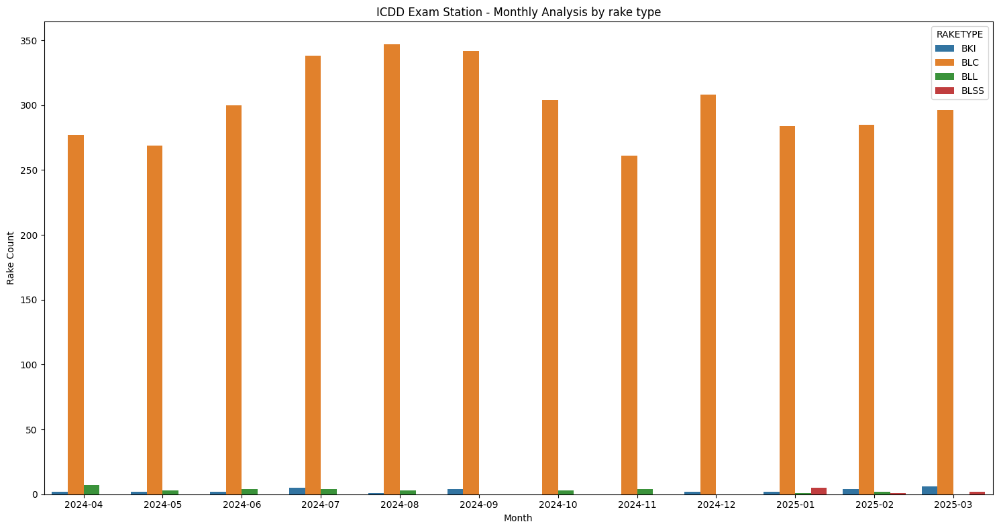

In [43]:
plt.figure(figsize=(15,8))
sns.barplot(monthly_rake_type_count, x='R_MONTH', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('ICDD Exam Station - Monthly Analysis by rake type')
plt.xlabel('Month')
plt.ylabel('Rake Count')
plt.tight_layout()
plt.show()

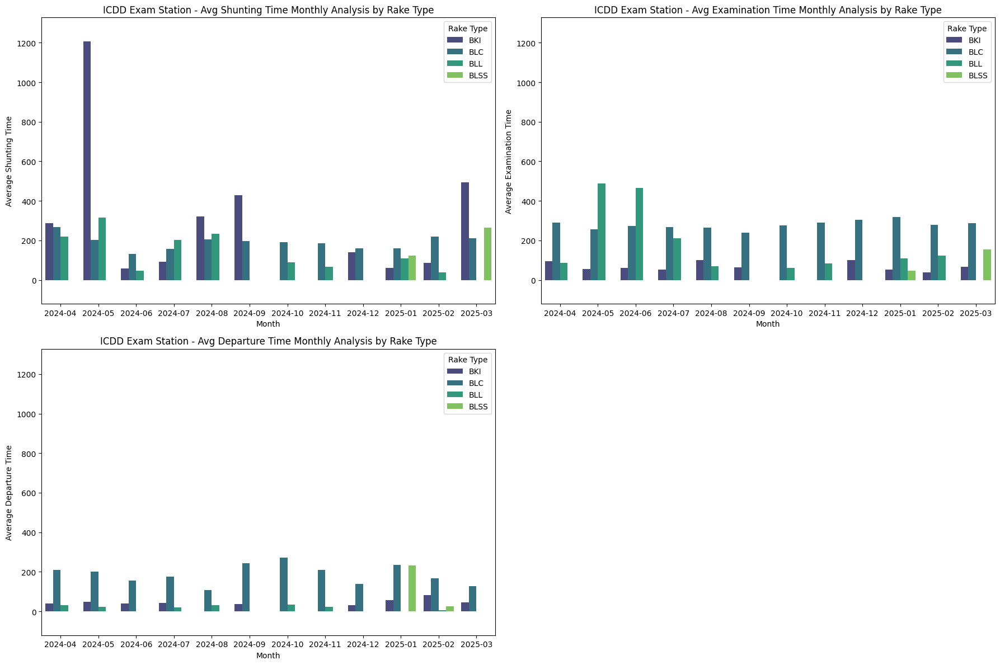

In [44]:
min_y = min(monthly_rake_type_count['AVG_SHUNTING_TIME'].min(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].min(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].min())

max_y = max(monthly_rake_type_count['AVG_SHUNTING_TIME'].max(),
            monthly_rake_type_count['AVG_EXAMINATION_TIME'].max(),
            monthly_rake_type_count['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_SHUNTING_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam Station - Avg Shunting Time Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Average Shunting Time')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_EXAMINATION_TIME', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam Station - Avg Examination Time Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Average Examination Time')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_DEPARTURE_TIME', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam Station - Avg Departure Time Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Average Departure Time')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

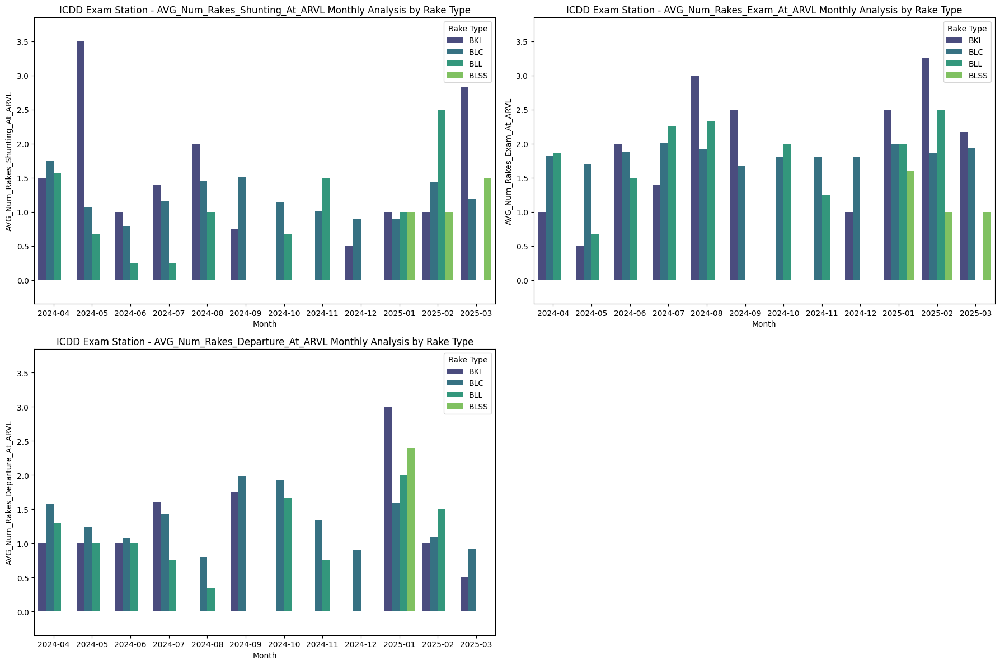

In [45]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Shunting_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam Station - AVG_Num_Rakes_Exam_At_ARVL Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_ARVL Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

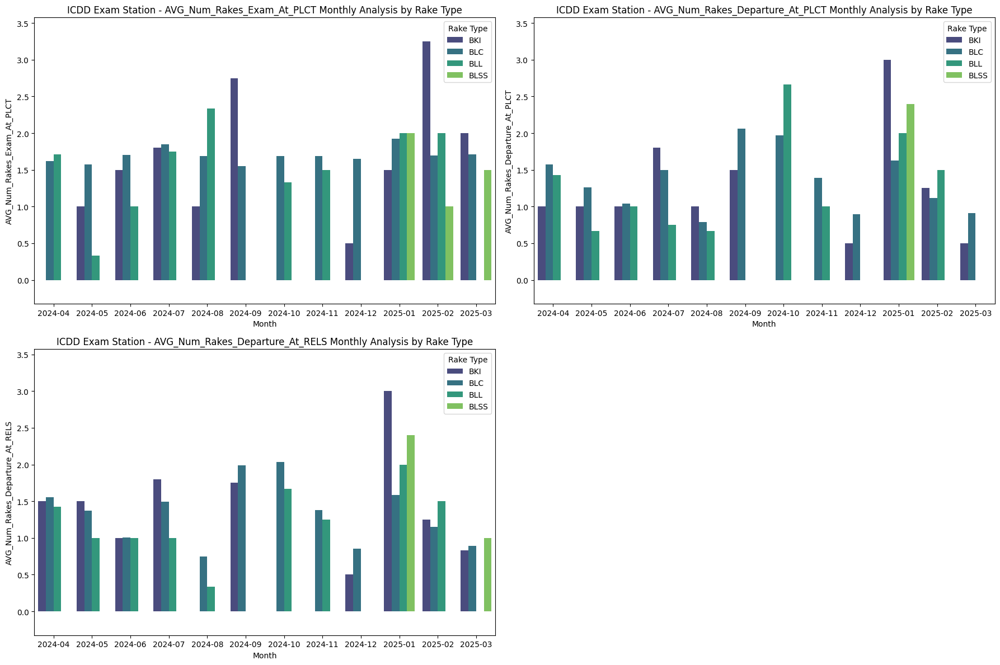

In [46]:
min_y = min(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(monthly_rake_type_count['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            monthly_rake_type_count['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Exam_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam Station - AVG_Num_Rakes_Exam_At_PLCT Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Num_Rakes_Departure_At_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

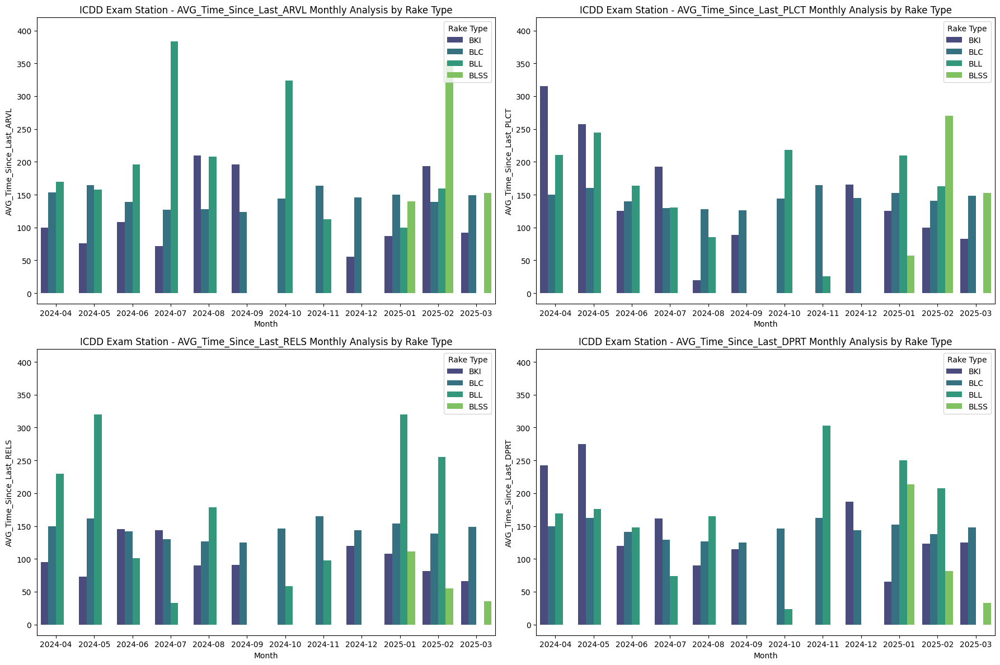

In [47]:
min_y = min(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].min(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].min())

max_y = max(monthly_rake_type_count['AVG_Time_Since_Last_ARVL'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_PLCT'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_RELS'].max(),
            monthly_rake_type_count['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_ARVL', hue='RAKETYPE', palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam Station - AVG_Time_Since_Last_ARVL Monthly Analysis by Rake Type')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_PLCT', hue='RAKETYPE', palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam Station - AVG_Time_Since_Last_PLCT Monthly Analysis by Rake Type')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[0, 1].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_RELS', hue='RAKETYPE', palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam Station - AVG_Time_Since_Last_RELS Monthly Analysis by Rake Type')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 0].legend(title='Rake Type', loc='upper right')

sns.barplot(data=monthly_rake_type_count, x='R_MONTH', y='AVG_Time_Since_Last_DPRT', hue='RAKETYPE', palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('ICDD Exam Station - AVG_Time_Since_Last_DPRT Monthly Analysis by Rake Type')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)
axes[1, 1].legend(title='Rake Type', loc='upper right')

plt.tight_layout()
plt.show()

#### Weekly Analysis

In [48]:
icdd_weekly = df1['R_WEEK'].value_counts(sort=False).reset_index()
icdd_weekly.columns =['R_WEEK','RAKE_COUNT']
icdd_weekly = pd.DataFrame(icdd_weekly)

weekly_shunting_time_sum = df1.groupby('R_WEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = df1.groupby('R_WEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = df1.groupby('R_WEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekly_numrakes1 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekly_numrakes2 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekly_numrakes3 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekly_numrakes4 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekly_numrakes5 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekly_numrakes6 = df1.groupby('R_WEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekly_timesince1 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekly_timesince2 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekly_timesince3 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekly_timesince4 = df1.groupby('R_WEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

icdd_weekly['AVG_SHUNTING_TIME'] = weekly_shunting_time_sum['Shunting_Time'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_EXAMINATION_TIME'] = weekly_examination_time_sum['Examination_Time'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_DEPARTURE_TIME'] = weekly_departure_lag_time_sum['Departure_Lag'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Num_Rakes_Shunting_At_ARVL'] = weekly_numrakes1['numrakes1'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Num_Rakes_Exam_At_ARVL'] = weekly_numrakes2['numrakes2'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Num_Rakes_Departure_At_ARVL'] = weekly_numrakes3['numrakes3'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Num_Rakes_Exam_At_PLCT'] = weekly_numrakes4['numrakes4'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Num_Rakes_Departure_At_PLCT'] = weekly_numrakes5['numrakes5'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Num_Rakes_Departure_At_RELS'] = weekly_numrakes6['numrakes6'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Time_Since_Last_ARVL'] = weekly_timesince1['timesince1'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Time_Since_Last_PLCT'] = weekly_timesince2['timesince2'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Time_Since_Last_RELS'] = weekly_timesince3['timesince3'] / icdd_weekly['RAKE_COUNT']
icdd_weekly['AVG_Time_Since_Last_DPRT'] = weekly_timesince4['timesince4'] / icdd_weekly['RAKE_COUNT']

icdd_weekly.head()

,R_WEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,W-14-2024,78,379.448718,188.525641,57.551282,3.358974,1.910256,1.705128,1.705128,1.615385,1.641026,122.948718,131.538462,131.153846,128.269231
1,W-15-2024,64,385.234375,409.562500,417.265625,1.765625,2.406250,2.343750,2.203125,2.406250,2.343750,177.781250,156.796875,151.796875,153.203125
2,W-16-2024,58,175.448276,331.120690,339.948276,0.862069,1.637931,1.137931,1.500000,1.103448,1.068966,168.724138,178.017241,177.500000,176.034483
3,W-17-2024,65,142.476923,281.292308,102.769231,0.569231,1.584615,1.030769,1.353846,1.123077,1.153846,165.230769,155.384615,152.923077,156.430769
4,W-18-2024,64,166.968750,193.437500,241.453125,0.875000,1.156250,1.203125,0.906250,1.187500,1.156250,148.343750,157.578125,160.546875,156.593750


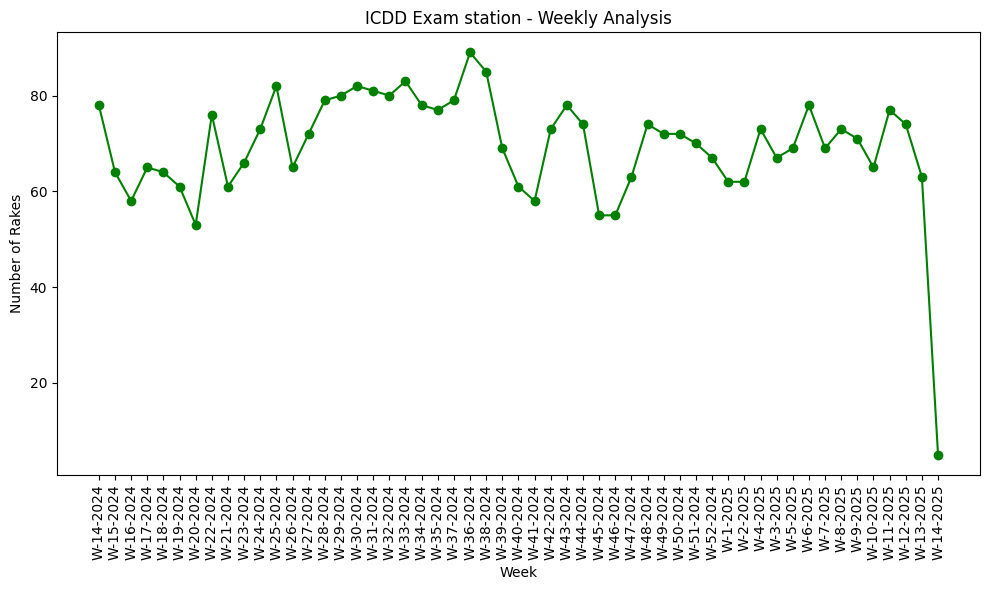

In [49]:
plt.figure(figsize=(10,6))
plt.plot(icdd_weekly['R_WEEK'], icdd_weekly['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam station - Weekly Analysis')
plt.xlabel('Week')
plt.ylabel('Number of Rakes')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1807163268.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1807163268.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1807163268.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
C:\Users\

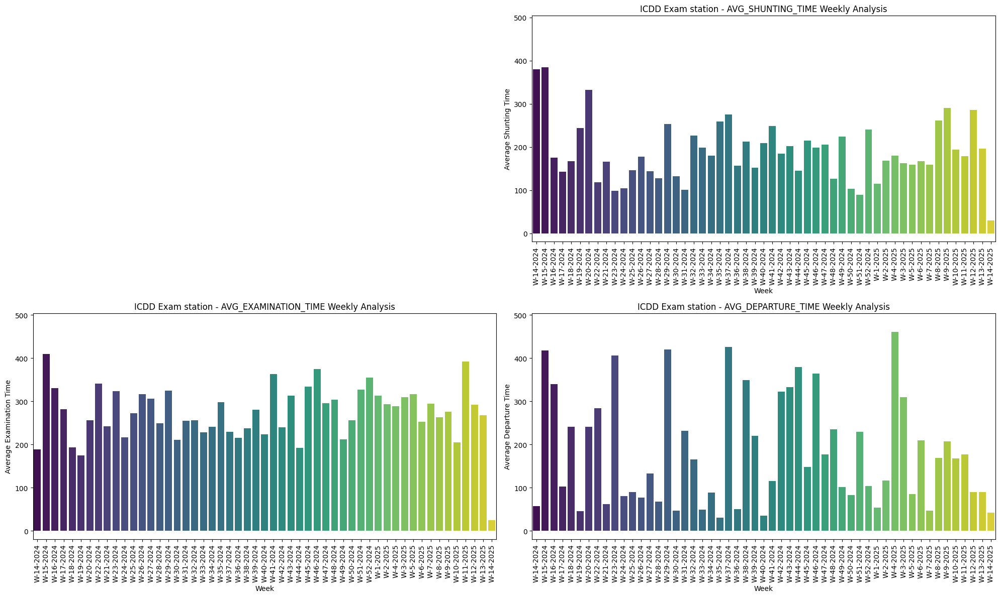

In [50]:
min_y = min(icdd_weekly['AVG_SHUNTING_TIME'].min(),
            icdd_weekly['AVG_EXAMINATION_TIME'].min(),
            icdd_weekly['AVG_DEPARTURE_TIME'].min())

max_y = max(icdd_weekly['AVG_SHUNTING_TIME'].max(),
            icdd_weekly['AVG_EXAMINATION_TIME'].max(),
            icdd_weekly['AVG_DEPARTURE_TIME'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

axes[0, 0].axis('off')

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_SHUNTING_TIME'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_SHUNTING_TIME Weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('Average Shunting Time')
axes[0, 1].set_xticklabels(axes[0, 1].get_xticklabels(), rotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_EXAMINATION_TIME'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_EXAMINATION_TIME Weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('Average Examination Time')
axes[1, 0].set_xticklabels(axes[1, 0].get_xticklabels(), rotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_DEPARTURE_TIME'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('ICDD Exam station - AVG_DEPARTURE_TIME Weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('Average Departure Time')
axes[1, 1].set_xticklabels(axes[1, 1].get_xticklabels(), rotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3454846265.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3454846265.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3454846265.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.b

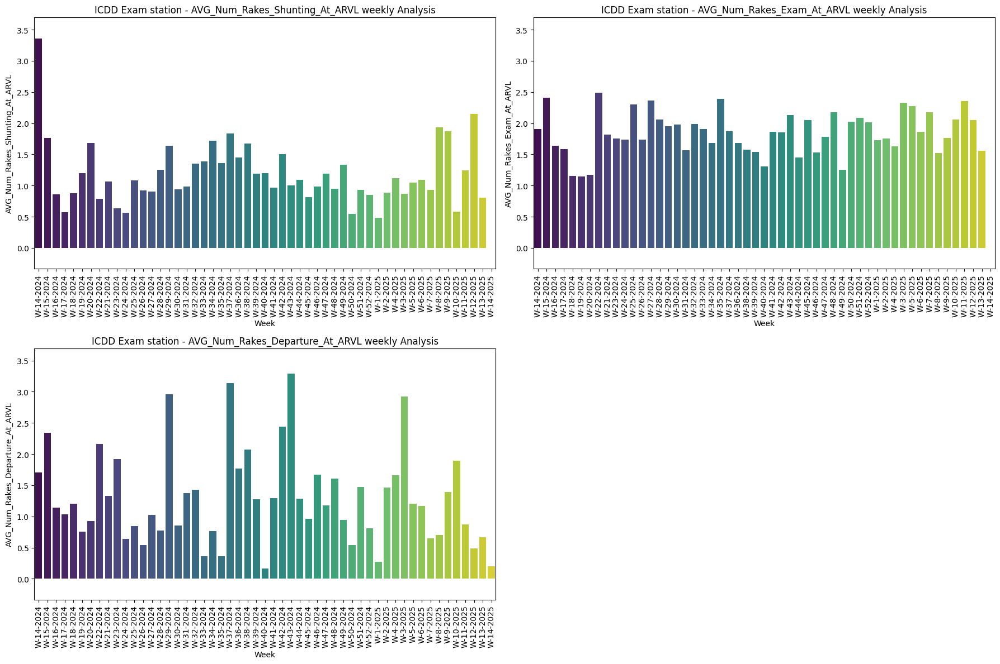

In [51]:
min_y = min(icdd_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].min(),
            icdd_weekly['AVG_Num_Rakes_Exam_At_ARVL'].min(),
            icdd_weekly['AVG_Num_Rakes_Departure_At_ARVL'].min())

max_y = max(icdd_weekly['AVG_Num_Rakes_Shunting_At_ARVL'].max(),
            icdd_weekly['AVG_Num_Rakes_Exam_At_ARVL'].max(),
            icdd_weekly['AVG_Num_Rakes_Departure_At_ARVL'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Shunting_At_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Shunting_At_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Exam_At_ARVL'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_Num_Rakes_Exam_At_ARVL weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Departure_At_ARVL'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Departure_At_ARVL weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1029745756.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1029745756.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\1029745756.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.

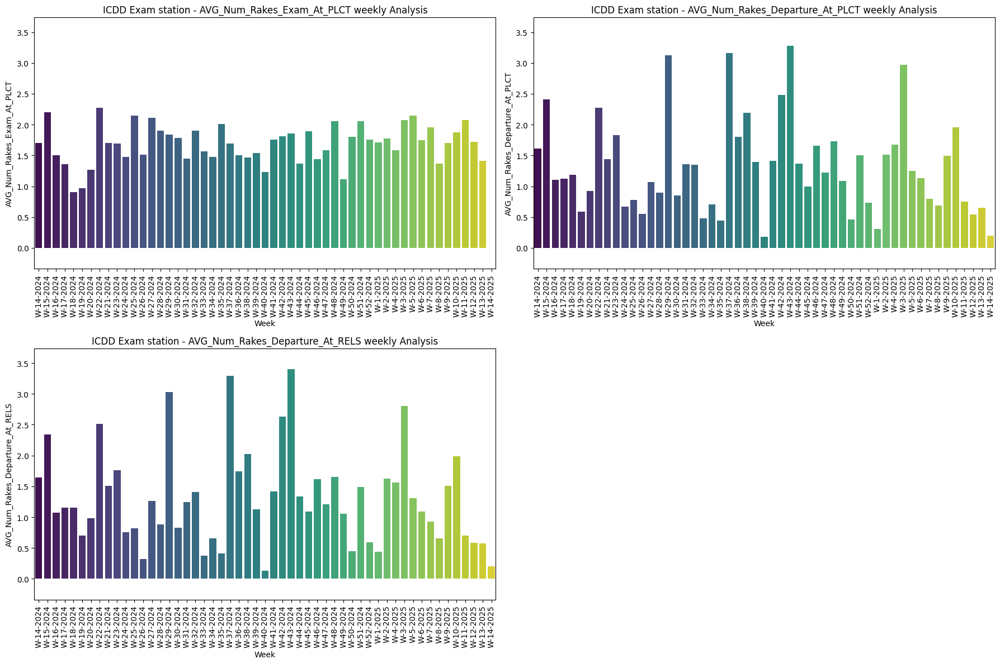

In [52]:
min_y = min(icdd_weekly['AVG_Num_Rakes_Exam_At_PLCT'].min(),
            icdd_weekly['AVG_Num_Rakes_Departure_At_PLCT'].min(),
            icdd_weekly['AVG_Num_Rakes_Departure_At_RELS'].min())

max_y = max(icdd_weekly['AVG_Num_Rakes_Exam_At_PLCT'].max(),
            icdd_weekly['AVG_Num_Rakes_Departure_At_PLCT'].max(),
            icdd_weekly['AVG_Num_Rakes_Departure_At_RELS'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Exam_At_PLCT'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Exam_At_PLCT weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Departure_At_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_Num_Rakes_Departure_At_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Num_Rakes_Departure_At_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_Num_Rakes_Departure_At_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3648626704.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3648626704.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
C:\Users\anant\AppData\Local\Temp\ipykernel_20120\3648626704.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x

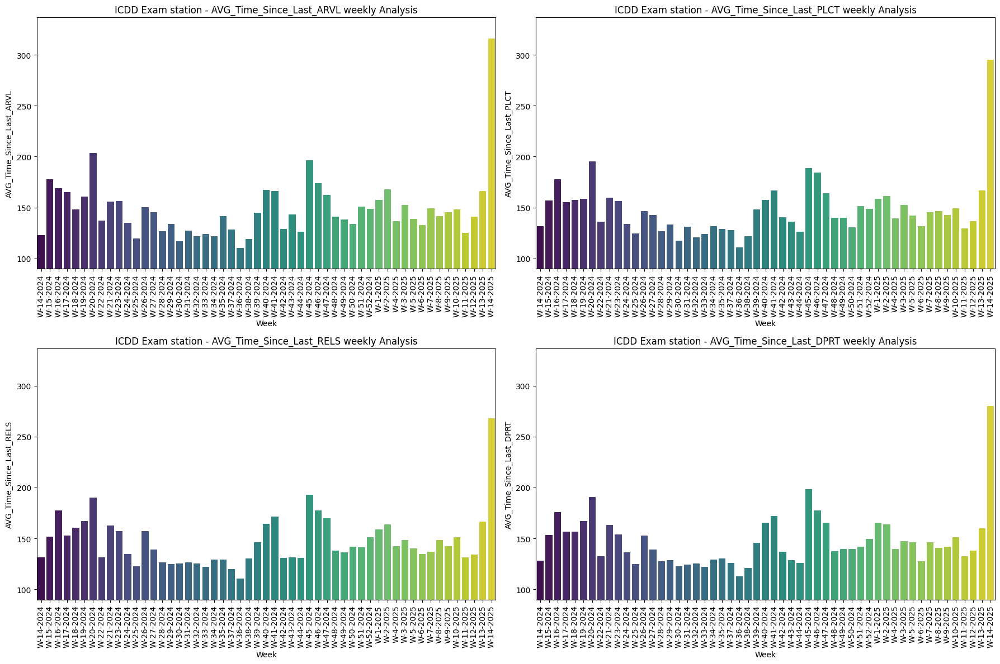

In [53]:
min_y = min(icdd_weekly['AVG_Time_Since_Last_ARVL'].min(),
            icdd_weekly['AVG_Time_Since_Last_PLCT'].min(),
            icdd_weekly['AVG_Time_Since_Last_RELS'].min(),
            icdd_weekly['AVG_Time_Since_Last_DPRT'].min())

max_y = max(icdd_weekly['AVG_Time_Since_Last_ARVL'].max(),
            icdd_weekly['AVG_Time_Since_Last_PLCT'].max(),
            icdd_weekly['AVG_Time_Since_Last_RELS'].max(),
            icdd_weekly['AVG_Time_Since_Last_DPRT'].max())

y_lower_bound = min_y - (max_y - min_y) * 0.1
y_upper_bound = max_y + (max_y - min_y) * 0.1

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Time_Since_Last_ARVL'], palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('ICDD Exam station - AVG_Time_Since_Last_ARVL weekly Analysis')
axes[0, 0].set_xlabel('Week')
axes[0, 0].set_ylabel('AVG_Time_Since_Last_ARVL')
axes[0, 0].tick_params(axis='x', labelrotation=90)
axes[0, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Time_Since_Last_PLCT'], palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('ICDD Exam station - AVG_Time_Since_Last_PLCT weekly Analysis')
axes[0, 1].set_xlabel('Week')
axes[0, 1].set_ylabel('AVG_Time_Since_Last_PLCT')
axes[0, 1].tick_params(axis='x', labelrotation=90)
axes[0, 1].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Time_Since_Last_RELS'], palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('ICDD Exam station - AVG_Time_Since_Last_RELS weekly Analysis')
axes[1, 0].set_xlabel('Week')
axes[1, 0].set_ylabel('AVG_Time_Since_Last_RELS')
axes[1, 0].tick_params(axis='x', labelrotation=90)
axes[1, 0].set_ylim(y_lower_bound, y_upper_bound)

sns.barplot(x=icdd_weekly['R_WEEK'], y=icdd_weekly['AVG_Time_Since_Last_DPRT'], palette='viridis', ax=axes[1, 1])
axes[1, 1].set_title('ICDD Exam station - AVG_Time_Since_Last_DPRT weekly Analysis')
axes[1, 1].set_xlabel('Week')
axes[1, 1].set_ylabel('AVG_Time_Since_Last_DPRT')
axes[1, 1].tick_params(axis='x', labelrotation=90)
axes[1, 1].set_ylim(y_lower_bound, y_upper_bound)

plt.tight_layout()
plt.show()

In [54]:
weekly_rake_type_count = icdd.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
weekly_rake_type_count = pd.DataFrame(weekly_rake_type_count)

weekly_shunting_time_sum = icdd.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekly_examination_time_sum = icdd.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekly_departure_lag_time_sum = icdd.groupby(['R_WEEK', 'RAKETYPE'], sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')

weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_shunting_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_SHUNTING_TIME'] = weekly_rake_type_count['Shunting_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_examination_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_EXAMINATION_TIME'] = weekly_rake_type_count['Examination_Time'] / weekly_rake_type_count['RAKE_COUNT']
weekly_rake_type_count = pd.merge(weekly_rake_type_count, weekly_departure_lag_time_sum, on=['R_WEEK', 'RAKETYPE'], how='left')
weekly_rake_type_count['AVG_DEPARTURE_TIME'] = weekly_rake_type_count['Departure_Lag'] / weekly_rake_type_count['RAKE_COUNT']

weekly_rake_type_count.drop(columns=['Shunting_Time','Examination_Time','Departure_Lag'], axis=1, inplace=True)

weekly_rake_type_count

,R_WEEK,RAKETYPE,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
0,W-14-2024,BLC,76,382.328947,192.171053,58.539474
1,W-14-2024,BLL,2,270.000000,50.000000,20.000000
2,W-15-2024,BLC,62,394.951613,418.419355,429.112903
3,W-15-2024,BLL,2,84.000000,135.000000,50.000000
4,W-16-2024,BLC,56,174.750000,340.892857,350.821429
...,...,...,...,...,...,...
92,W-11-2025,BKI,3,223.333333,40.000000,68.333333
93,W-12-2025,BLC,71,265.732394,300.704225,92.309859
94,W-12-2025,BKI,3,766.666667,95.000000,20.000000
95,W-13-2025,BLC,63,195.920635,267.380952,89.476190


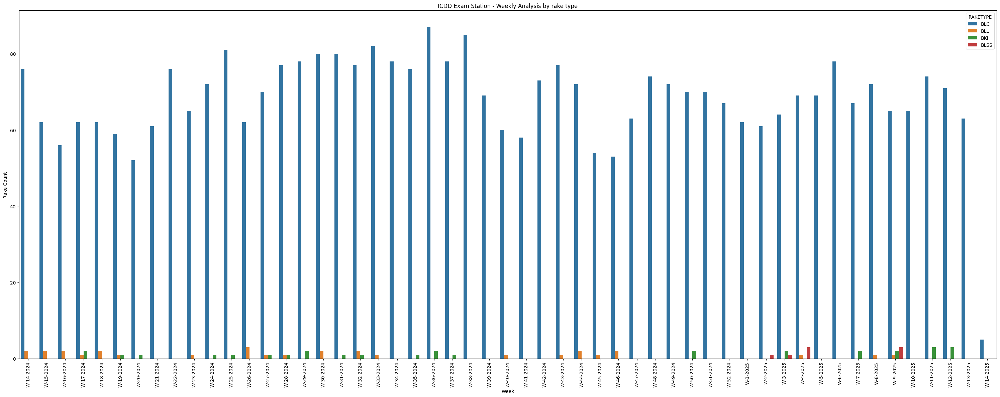

In [55]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='RAKE_COUNT', hue='RAKETYPE')
plt.title('ICDD Exam Station - Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

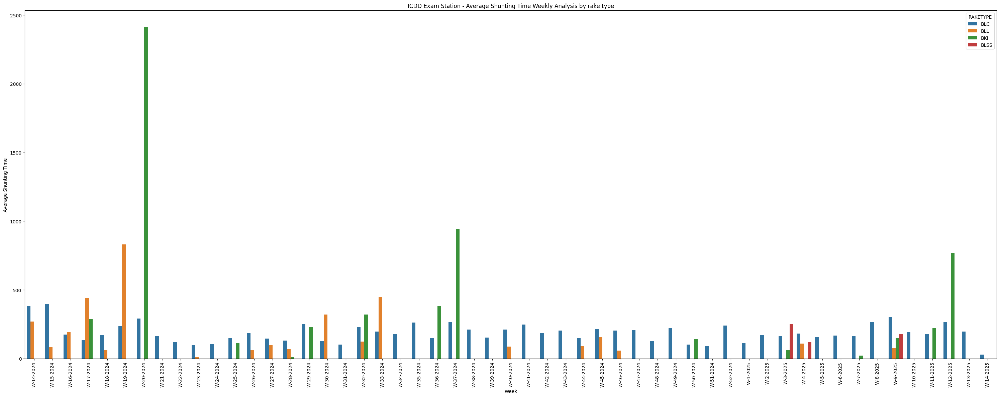

In [56]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_SHUNTING_TIME', hue='RAKETYPE')
plt.title('ICDD Exam Station - Average Shunting Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Shunting Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

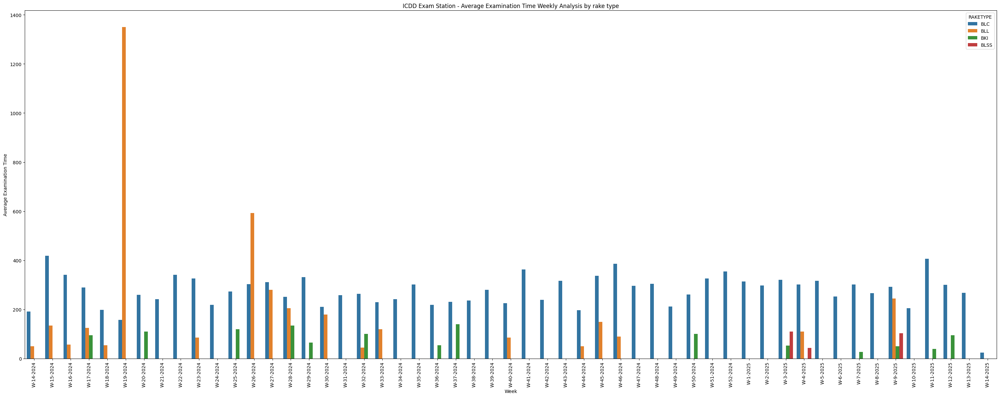

In [57]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_EXAMINATION_TIME', hue='RAKETYPE')
plt.title('ICDD Exam Station - Average Examination Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Examination Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

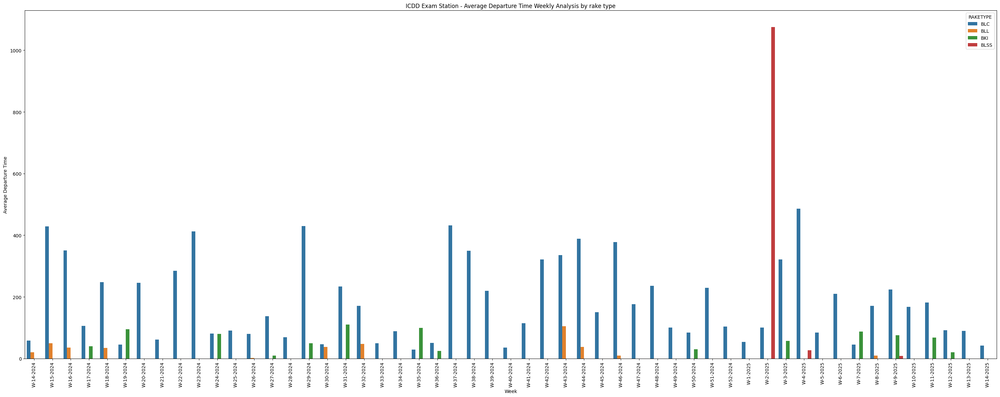

In [58]:
plt.figure(figsize=(30,12))
sns.barplot(weekly_rake_type_count, x='R_WEEK', y='AVG_DEPARTURE_TIME', hue='RAKETYPE')
plt.title('ICDD Exam Station - Average Departure Time Weekly Analysis by rake type')
plt.xlabel('Week')
plt.ylabel('Average Departure Time')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### Daily Analysis

In [59]:
icdd_daily = df1.groupby('R_DATEOFMONTH', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
icdd_daily = pd.DataFrame(icdd_daily)

daily_shunting_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
daily_examination_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
daily_departure_lag_time_sum = df1.groupby('R_DATEOFMONTH', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
daily_numrakes1 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
daily_numrakes2 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
daily_numrakes3 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
daily_numrakes4 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
daily_numrakes5 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
daily_numrakes6 = df1.groupby('R_DATEOFMONTH', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
daily_timesince1 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
daily_timesince2 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
daily_timesince3 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
daily_timesince4 = df1.groupby('R_DATEOFMONTH', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

icdd_daily['AVG_SHUNTING_TIME'] = daily_shunting_time_sum['Shunting_Time'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_EXAMINATION_TIME'] = daily_examination_time_sum['Examination_Time'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_DEPARTURE_TIME'] = daily_departure_lag_time_sum['Departure_Lag'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Num_Rakes_Shunting_At_ARVL'] = daily_numrakes1['numrakes1'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Num_Rakes_Exam_At_ARVL'] = daily_numrakes2['numrakes2'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Num_Rakes_Departure_At_ARVL'] = daily_numrakes3['numrakes3'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Num_Rakes_Exam_At_PLCT'] = daily_numrakes4['numrakes4'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Num_Rakes_Departure_At_PLCT'] = daily_numrakes5['numrakes5'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Num_Rakes_Departure_At_RELS'] = daily_numrakes6['numrakes6'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Time_Since_Last_ARVL'] = daily_timesince1['timesince1'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Time_Since_Last_PLCT'] = daily_timesince2['timesince2'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Time_Since_Last_RELS'] = daily_timesince3['timesince3'] / icdd_daily['RAKE_COUNT']
icdd_daily['AVG_Time_Since_Last_DPRT'] = daily_timesince4['timesince4'] / icdd_daily['RAKE_COUNT']

icdd_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,9,266.666667,205.555556,170.555556,2.222222,2.000000,1.000000,2.111111,0.555556,0.666667,122.111111,207.777778,142.111111,148.333333
1,2024-04-03,14,638.714286,132.500000,40.500000,4.285714,2.285714,1.000000,1.928571,1.071429,1.357143,102.285714,103.571429,98.571429,103.571429
2,2024-04-11,12,308.416667,973.333333,2083.833333,1.833333,2.333333,3.000000,1.916667,3.333333,2.750000,237.000000,134.166667,125.416667,106.666667
3,2024-04-02,11,258.909091,278.181818,49.909091,4.272727,2.363636,0.818182,2.363636,0.363636,0.181818,147.363636,106.363636,147.363636,115.454545
4,2024-04-04,11,473.000000,39.545455,45.000000,2.272727,1.272727,2.181818,0.636364,2.454545,2.454545,156.454545,126.363636,128.181818,137.818182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2025-03-27,12,103.500000,300.833333,18.583333,1.583333,2.333333,0.250000,2.166667,0.250000,0.333333,118.000000,135.000000,107.916667,118.333333
361,2025-03-30,10,54.000000,345.500000,392.600000,0.200000,0.900000,0.800000,0.600000,0.800000,0.700000,176.000000,172.500000,153.500000,146.000000
362,2025-03-28,7,272.285714,217.857143,14.285714,1.000000,1.285714,1.000000,1.000000,1.000000,1.285714,195.285714,161.428571,202.142857,208.571429
363,2025-03-29,12,209.833333,229.166667,60.916667,0.500000,1.583333,1.250000,1.333333,1.250000,1.166667,139.000000,143.333333,127.083333,119.166667


In [60]:
import matplotlib.dates as mdates

In [61]:
icdd_daily['R_DATEOFMONTH'] = pd.to_datetime(icdd_daily['R_DATEOFMONTH'], format='%Y-%m-%d')

icdd_daily = icdd_daily.sort_values(by='R_DATEOFMONTH')

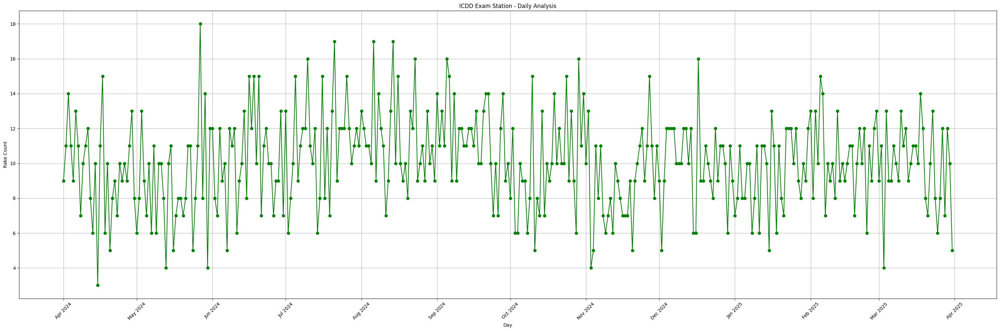

In [62]:
fig, ax = plt.subplots(figsize=(30, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['RAKE_COUNT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Rake Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

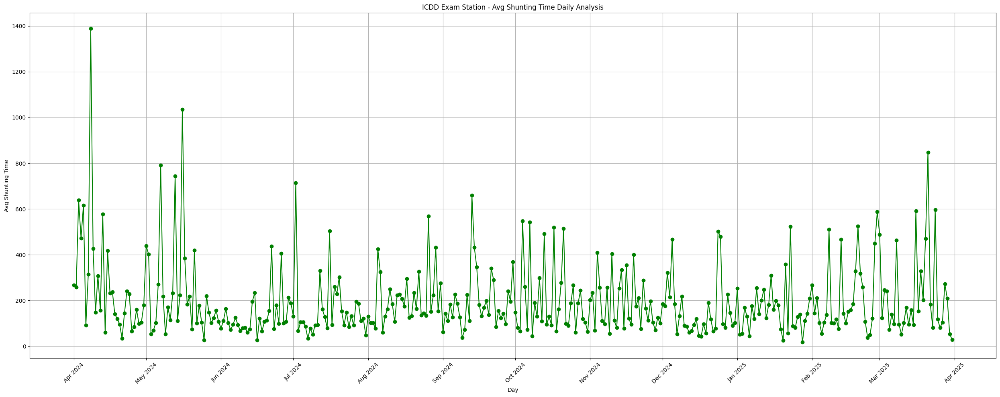

In [63]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - Avg Shunting Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Shunting Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [64]:
icdd_daily[icdd_daily['AVG_SHUNTING_TIME'] > 1000]

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
7,2024-04-08,7,1388.285714,167.857143,15.285714,2.285714,2.0,2.0,1.714286,2.0,2.285714,189.0,138.571429,144.285714,167.142857
45,2024-05-16,5,1034.400000,56.000000,44.400000,2.400000,0.8,1.2,1.000000,1.0,1.200000,161.6,256.000000,266.000000,301.400000


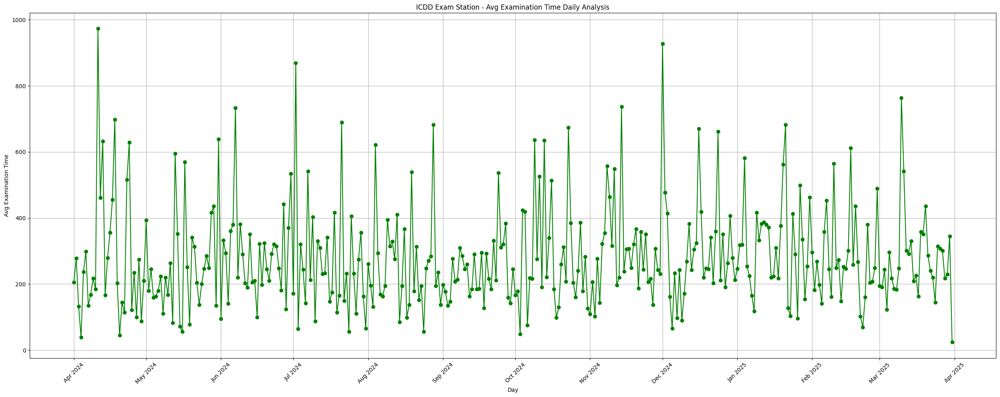

In [65]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - Avg Examination Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Examination Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

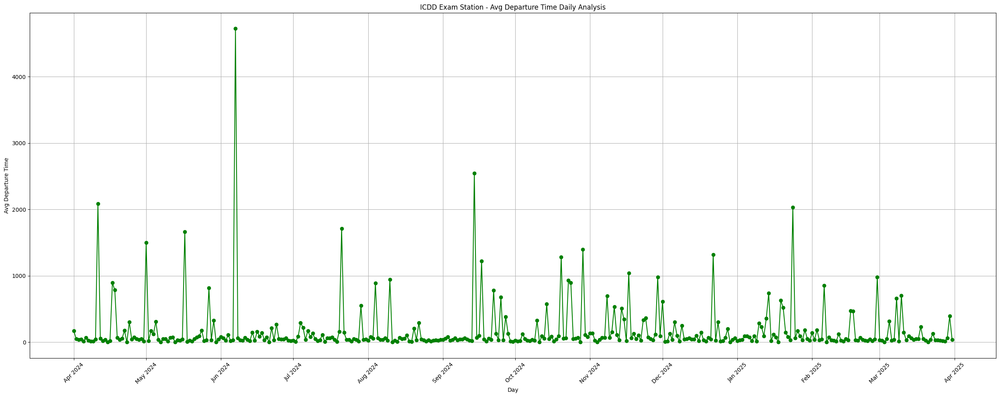

In [66]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - Avg Departure Time Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('Avg Departure Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

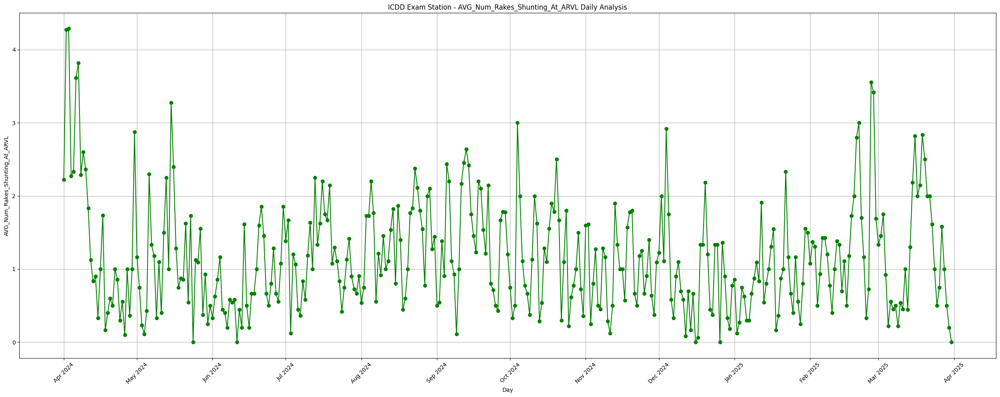

In [67]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

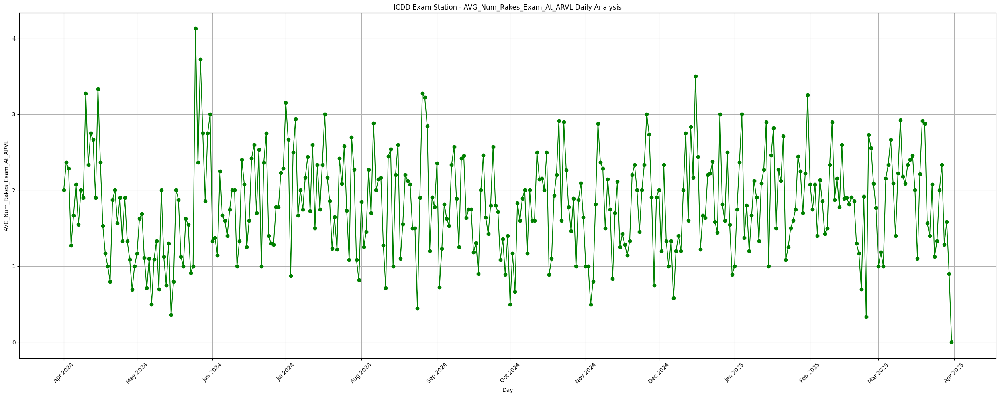

In [68]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Num_Rakes_Exam_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

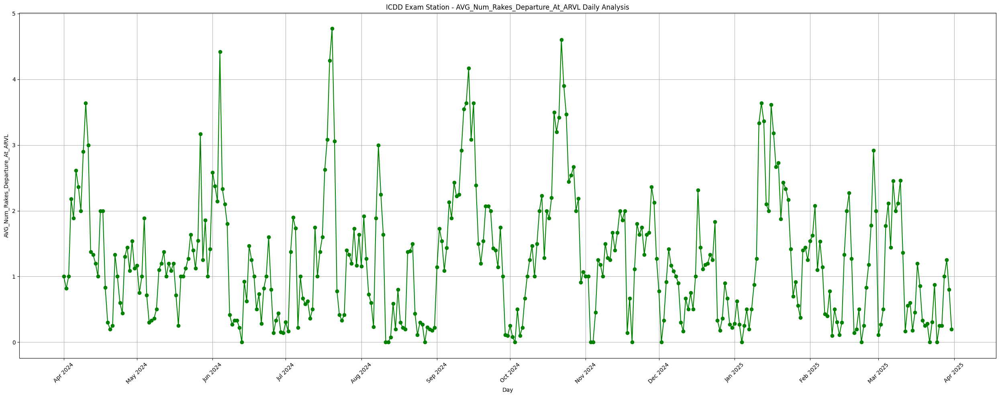

In [69]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

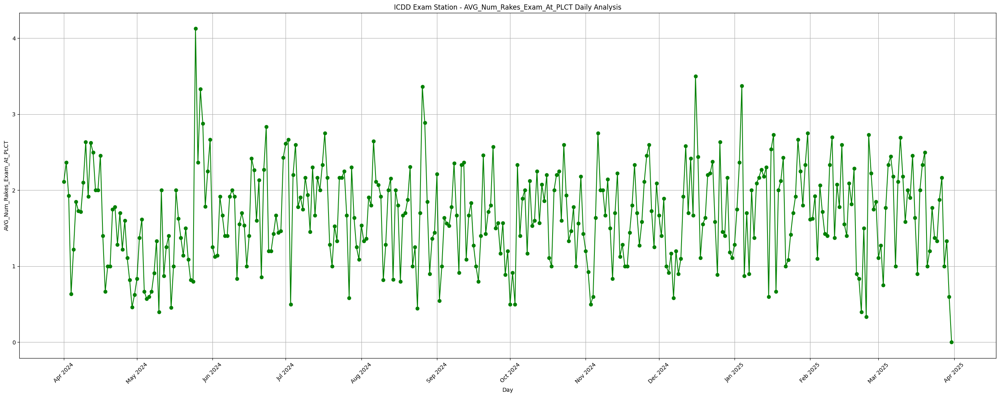

In [70]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Num_Rakes_Exam_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

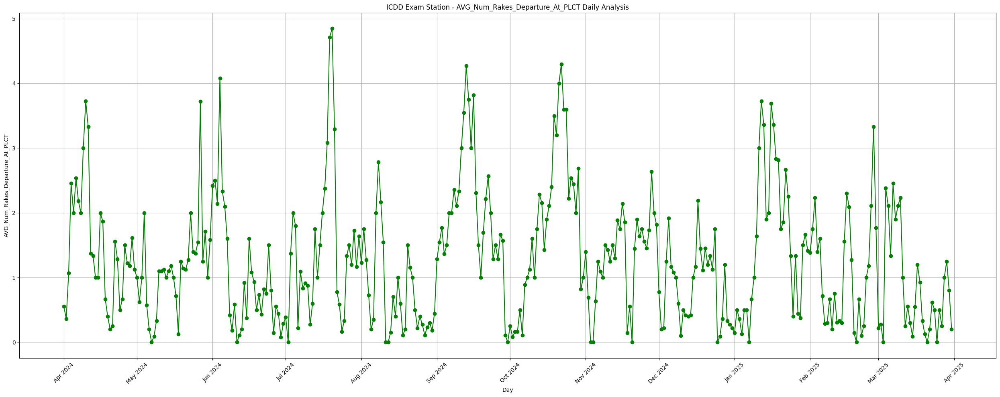

In [71]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

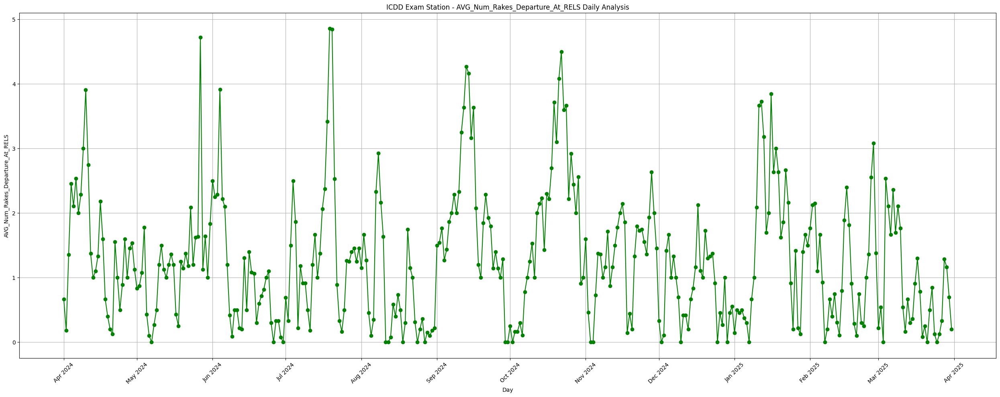

In [72]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

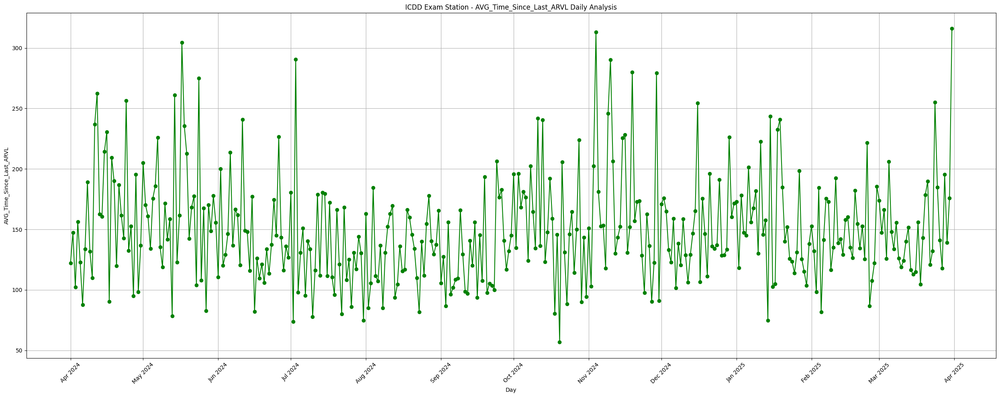

In [73]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Time_Since_Last_ARVL Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

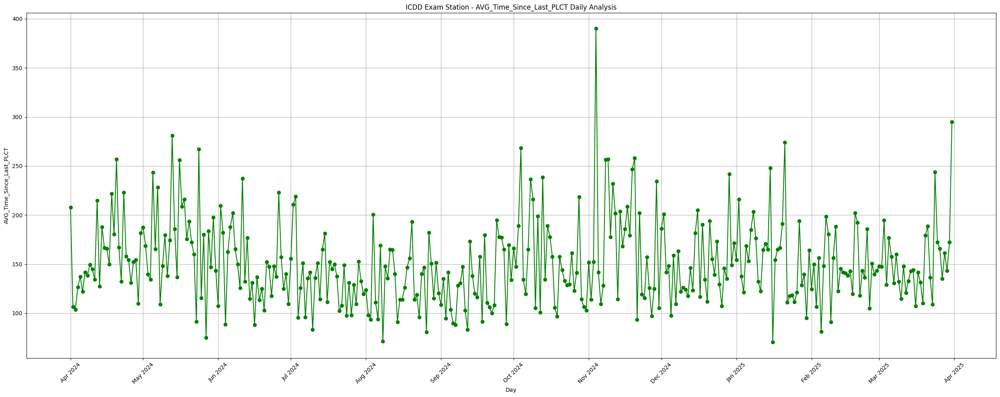

In [74]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Time_Since_Last_PLCT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

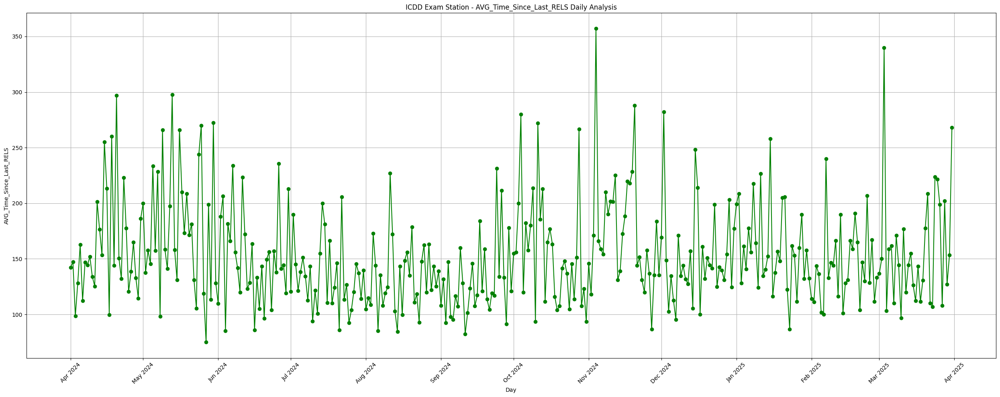

In [75]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Time_Since_Last_RELS Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

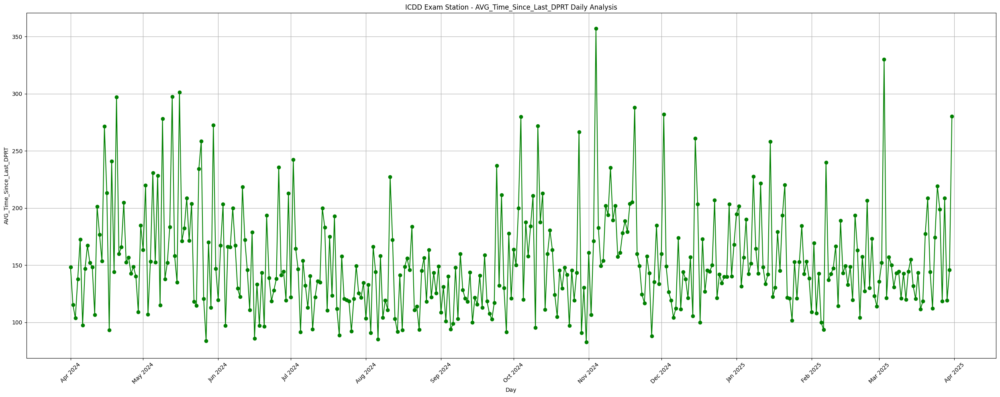

In [76]:
fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(icdd_daily['R_DATEOFMONTH'], icdd_daily['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
ax.xaxis.set_major_locator(mdates.MonthLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))

ax.set_title('ICDD Exam Station - AVG_Time_Since_Last_DPRT Daily Analysis')
ax.set_xlabel('Day')
ax.set_ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Weekend Analysis

In [77]:
icdd_weekend = df1.groupby('R_DAYOFWEEK', sort=False)['RDATE'].count().reset_index(name='RAKE_COUNT')
icdd_weekend = pd.DataFrame(icdd_weekend)

weekend_shunting_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['AR_TO_PL'].sum().reset_index(name='Shunting_Time')
weekend_examination_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['PL_TO_RL'].sum().reset_index(name='Examination_Time')
weekend_departure_lag_time_sum = df1.groupby('R_DAYOFWEEK', sort=False)['RL_TO_DP'].sum().reset_index(name='Departure_Lag')
weekend_numrakes1 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Shunting_At_ARVL'].sum().reset_index(name='numrakes1')
weekend_numrakes2 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_ARVL'].sum().reset_index(name='numrakes2')
weekend_numrakes3 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_ARVL'].sum().reset_index(name='numrakes3')
weekend_numrakes4 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Exam_At_PLCT'].sum().reset_index(name='numrakes4')
weekend_numrakes5 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_PLCT'].sum().reset_index(name='numrakes5')
weekend_numrakes6 = df1.groupby('R_DAYOFWEEK', sort=False)['Num_Rakes_Departure_At_RELS'].sum().reset_index(name='numrakes6')
weekend_timesince1 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_ARVL'].sum().reset_index(name='timesince1')
weekend_timesince2 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_PLCT'].sum().reset_index(name='timesince2')
weekend_timesince3 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_RELS'].sum().reset_index(name='timesince3')
weekend_timesince4 = df1.groupby('R_DAYOFWEEK', sort=False)['Time_Since_Last_DPRT'].sum().reset_index(name='timesince4')

icdd_weekend['AVG_SHUNTING_TIME'] = weekend_shunting_time_sum['Shunting_Time'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_EXAMINATION_TIME'] = weekend_examination_time_sum['Examination_Time'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_DEPARTURE_TIME'] = weekend_departure_lag_time_sum['Departure_Lag'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Num_Rakes_Shunting_At_ARVL'] = weekend_numrakes1['numrakes1'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Num_Rakes_Exam_At_ARVL'] = weekend_numrakes2['numrakes2'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Num_Rakes_Departure_At_ARVL'] = weekend_numrakes3['numrakes3'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Num_Rakes_Exam_At_PLCT'] = weekend_numrakes4['numrakes4'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Num_Rakes_Departure_At_PLCT'] = weekend_numrakes5['numrakes5'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Num_Rakes_Departure_At_RELS'] = weekend_numrakes6['numrakes6'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Time_Since_Last_ARVL'] = weekend_timesince1['timesince1'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Time_Since_Last_PLCT'] = weekend_timesince2['timesince2'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Time_Since_Last_RELS'] = weekend_timesince3['timesince3'] / icdd_weekend['RAKE_COUNT']
icdd_weekend['AVG_Time_Since_Last_DPRT'] = weekend_timesince4['timesince4'] / icdd_weekend['RAKE_COUNT']

icdd_weekend

,R_DAYOFWEEK,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,0,492,197.837398,301.371951,167.465447,1.006098,1.918699,1.325203,1.770325,1.339431,1.337398,151.758130,152.182927,155.540650,151.857724
1,2,544,165.818015,255.586397,135.893382,1.384191,1.867647,1.205882,1.705882,1.222426,1.220588,139.950368,137.750000,137.244485,139.090074
2,3,540,210.846296,285.488889,169.340741,1.268519,1.925926,1.387037,1.707407,1.429630,1.451852,137.050000,133.809259,134.112963,138.138889
3,1,530,198.543396,285.605660,160.447170,1.137736,1.939623,1.284906,1.788679,1.296226,1.235849,144.124528,150.898113,148.130189,145.292453
4,4,533,195.776735,285.737336,236.696060,1.273921,1.838649,1.332083,1.658537,1.369606,1.363977,144.296435,147.577861,141.572233,140.712946
5,5,530,205.686792,227.458491,165.686792,1.211321,1.664151,1.356604,1.522642,1.383019,1.420755,139.437736,133.792453,139.075472,137.439623
6,6,511,157.360078,288.146771,248.148728,1.086106,1.833659,1.326810,1.718200,1.375734,1.332681,146.590998,146.062622,145.626223,148.031311


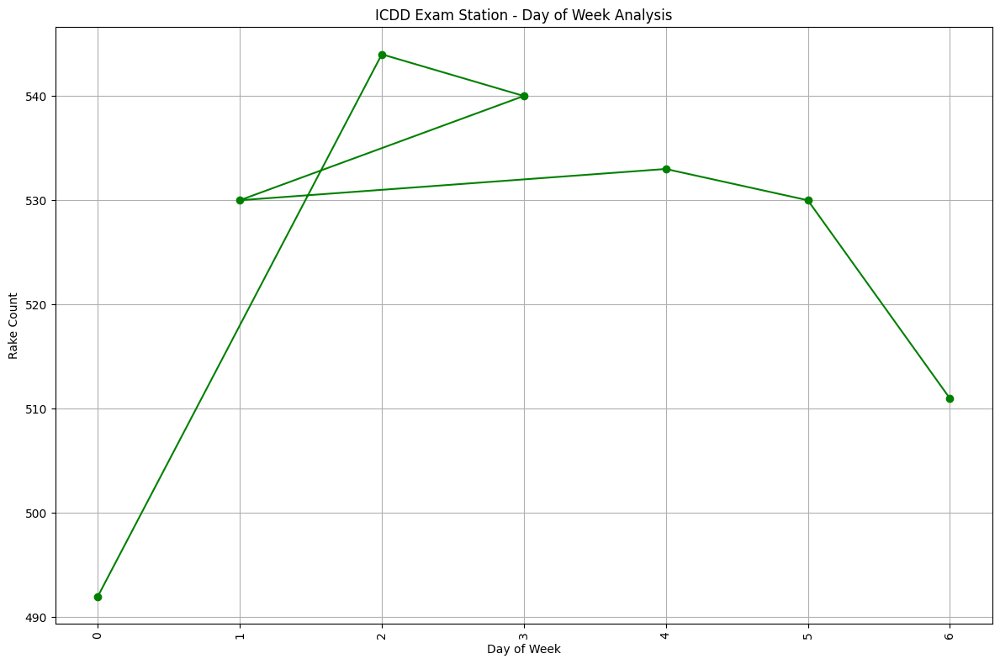

In [78]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Rake Count')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

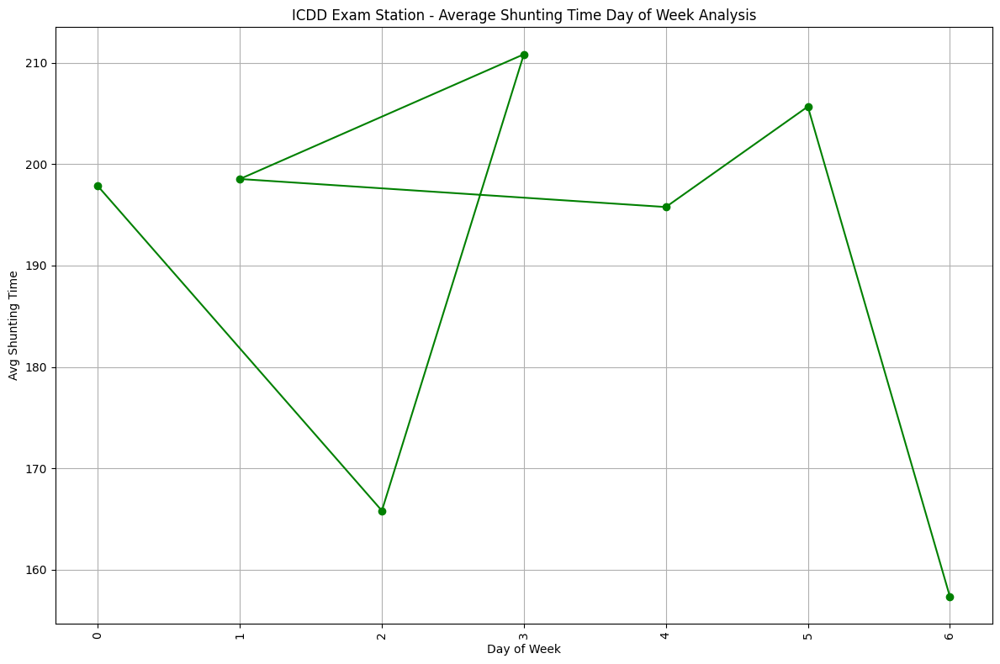

In [79]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_SHUNTING_TIME'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Average Shunting Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Shunting Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

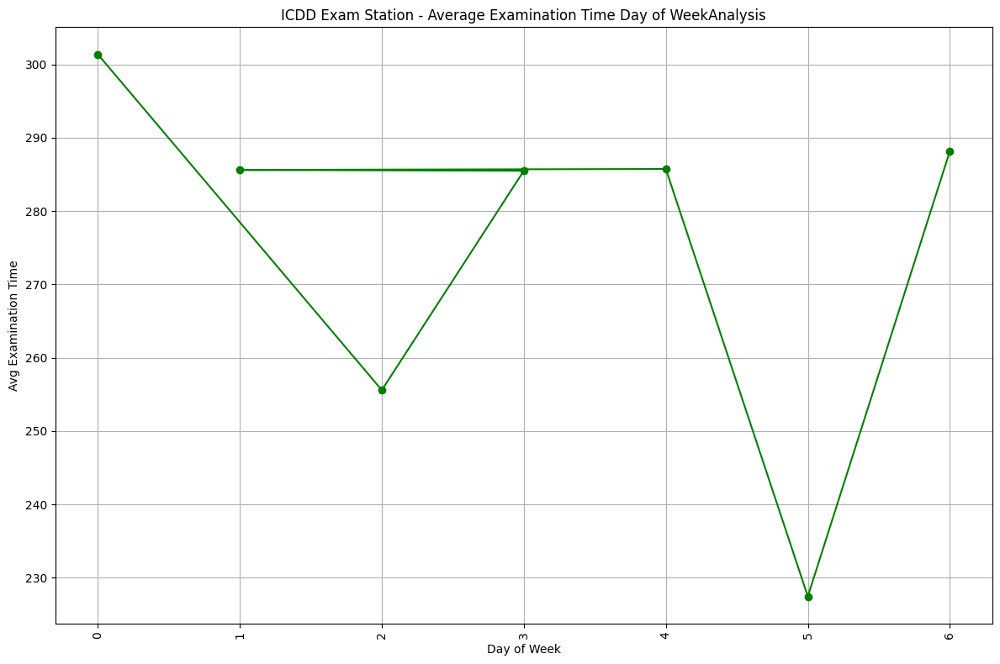

In [80]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_EXAMINATION_TIME'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Average Examination Time Day of WeekAnalysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Examination Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

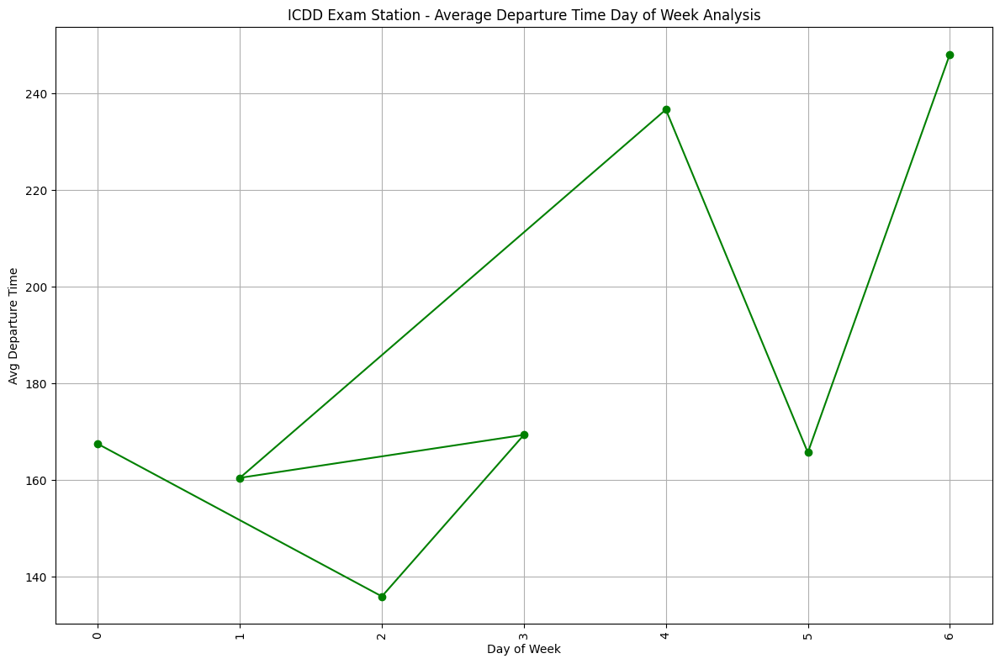

In [81]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_DEPARTURE_TIME'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Average Departure Time Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Avg Departure Time')
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

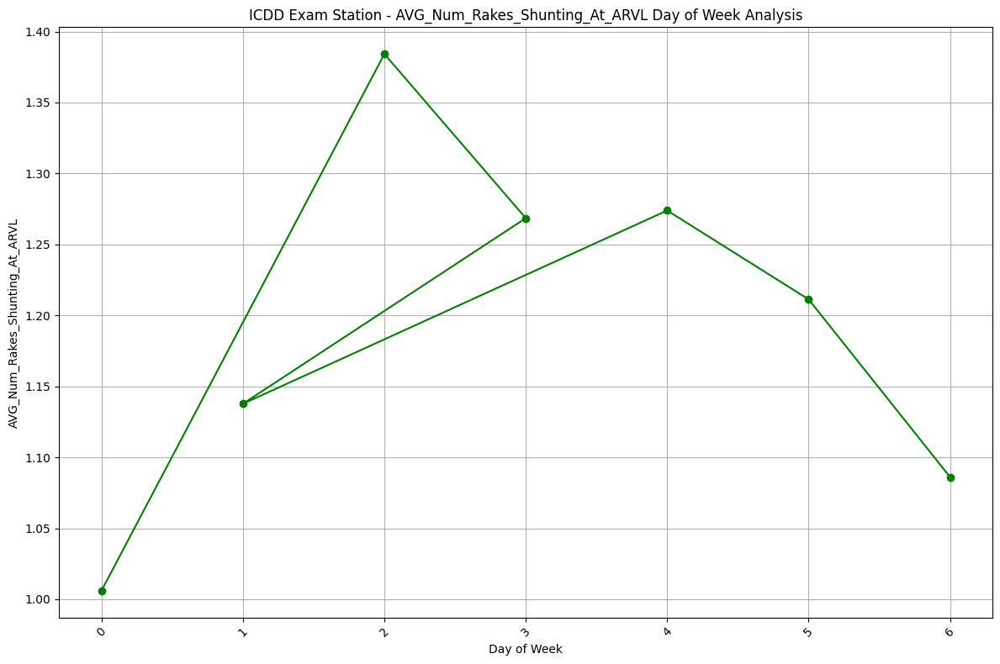

In [82]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Num_Rakes_Shunting_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Num_Rakes_Shunting_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Shunting_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

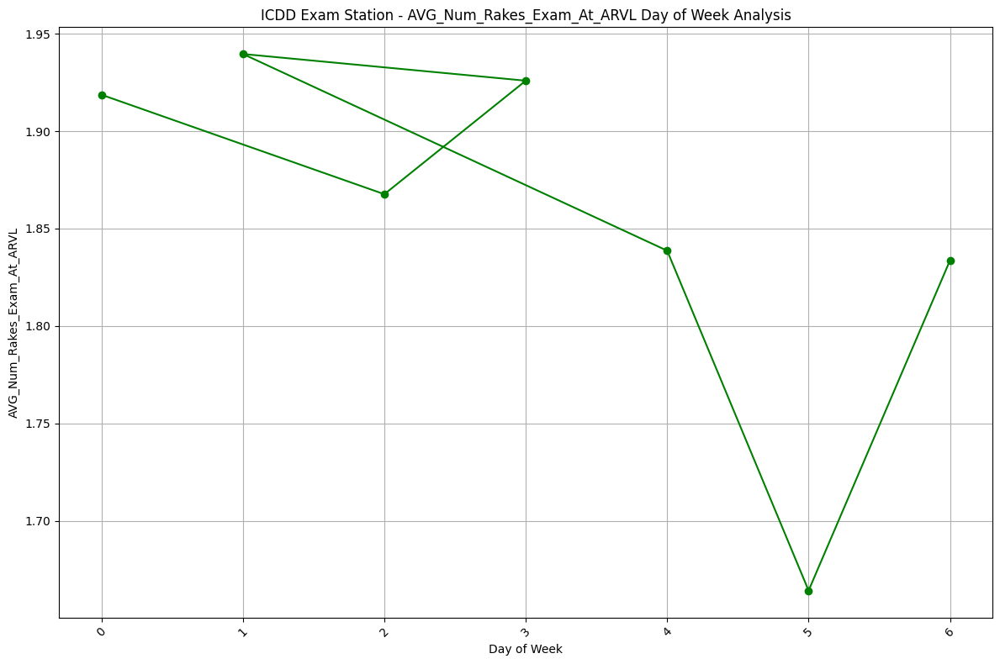

In [83]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Num_Rakes_Exam_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Num_Rakes_Exam_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

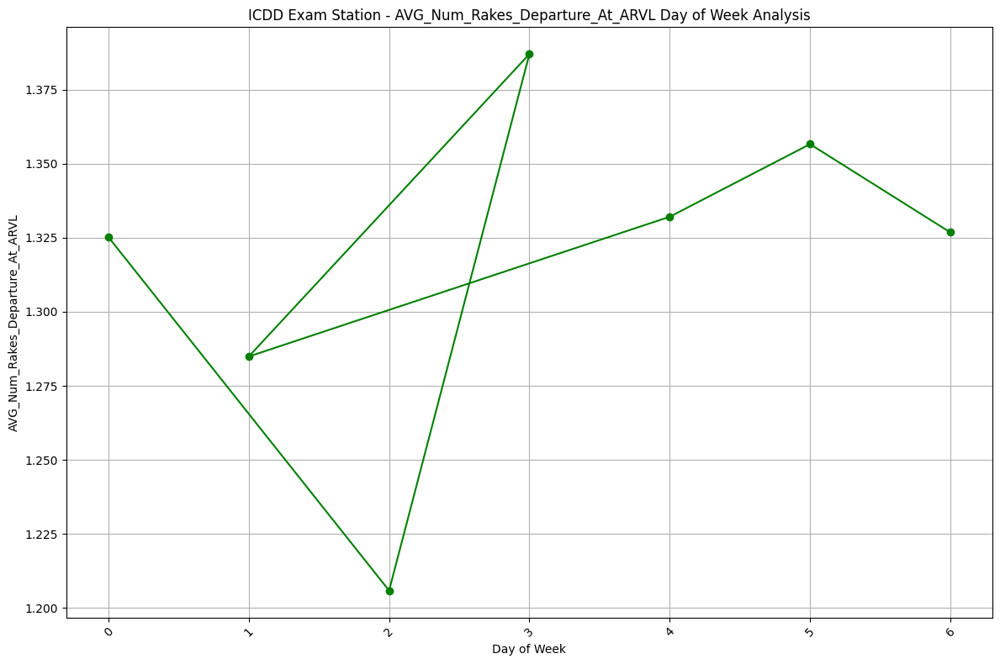

In [84]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Num_Rakes_Departure_At_ARVL'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

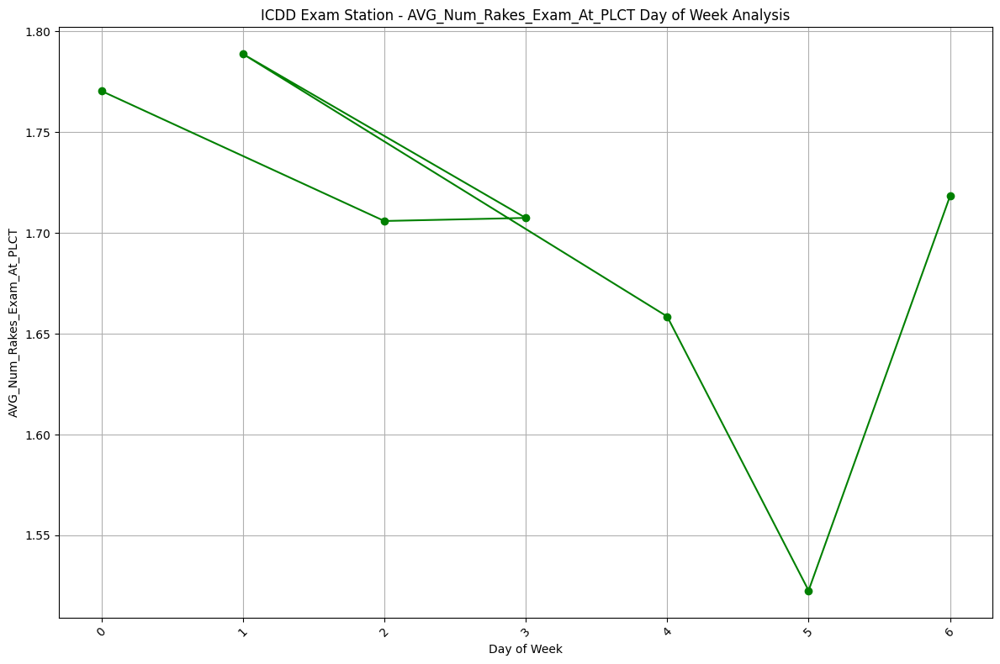

In [85]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Num_Rakes_Exam_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Num_Rakes_Exam_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Exam_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

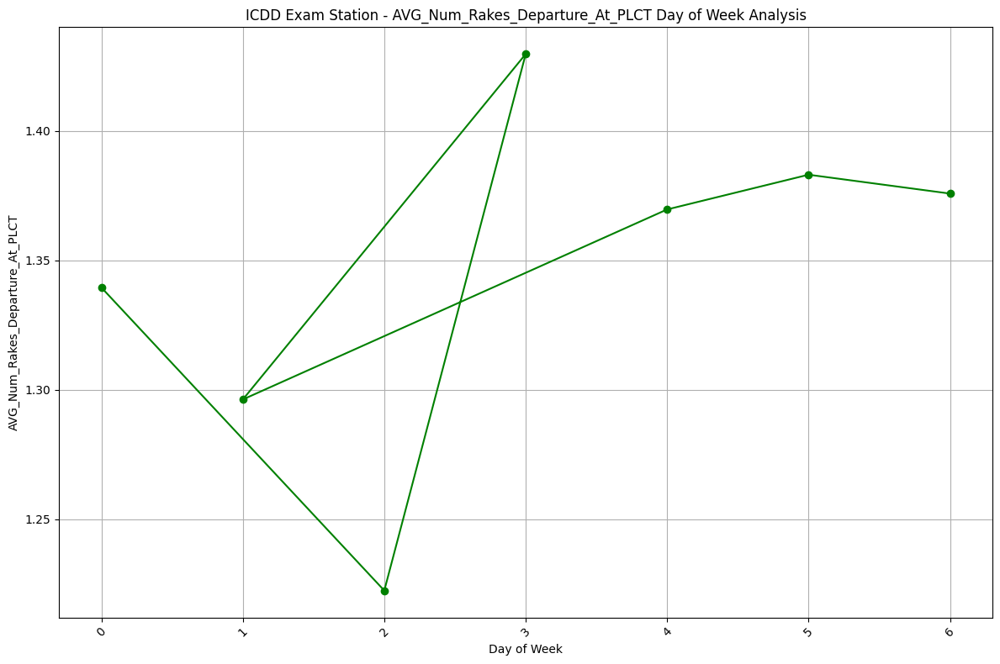

In [86]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Num_Rakes_Departure_At_PLCT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

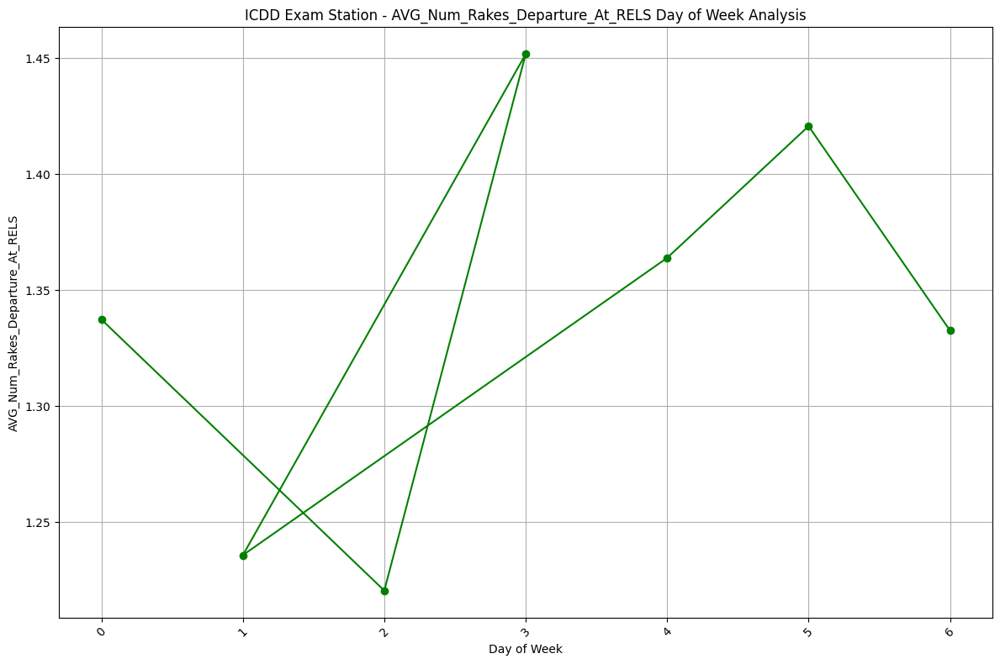

In [87]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Num_Rakes_Departure_At_RELS'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Num_Rakes_Departure_At_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Num_Rakes_Departure_At_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

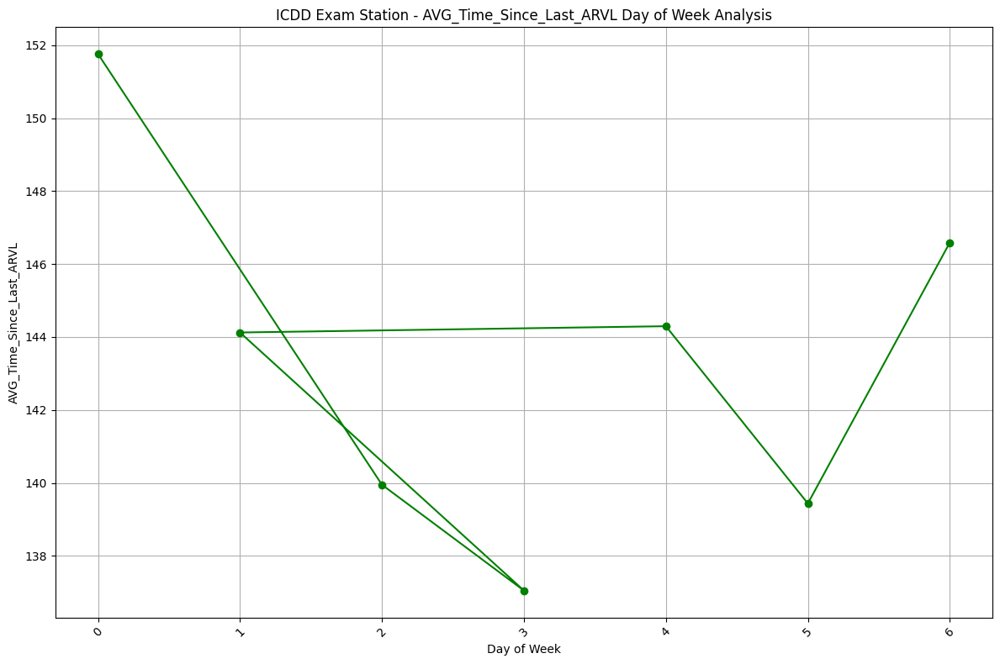

In [88]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Time_Since_Last_ARVL'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Time_Since_Last_ARVL Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_ARVL')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

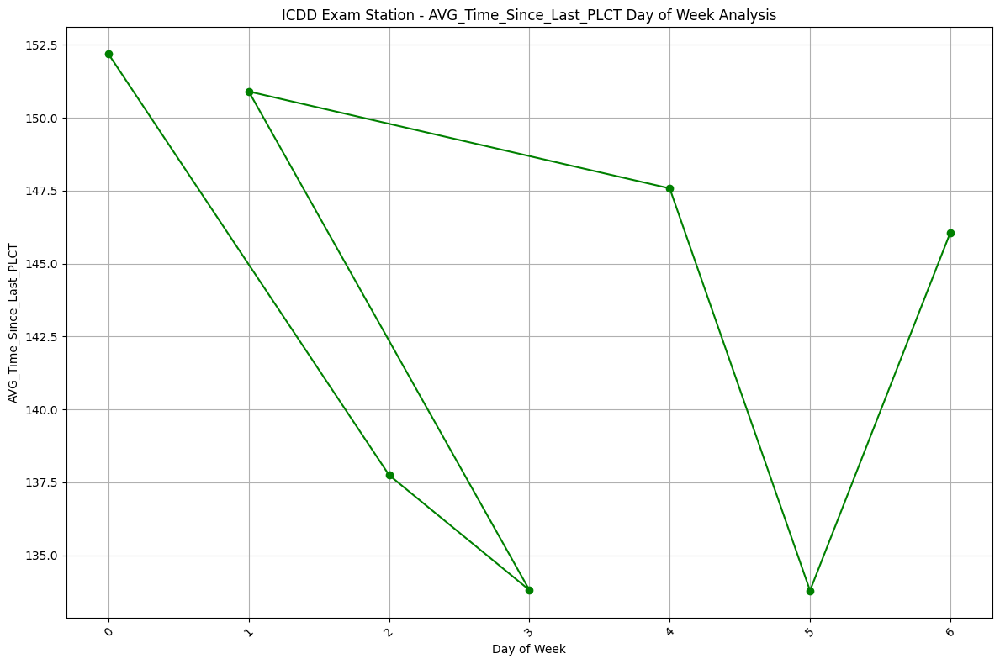

In [89]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Time_Since_Last_PLCT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Time_Since_Last_PLCT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_PLCT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

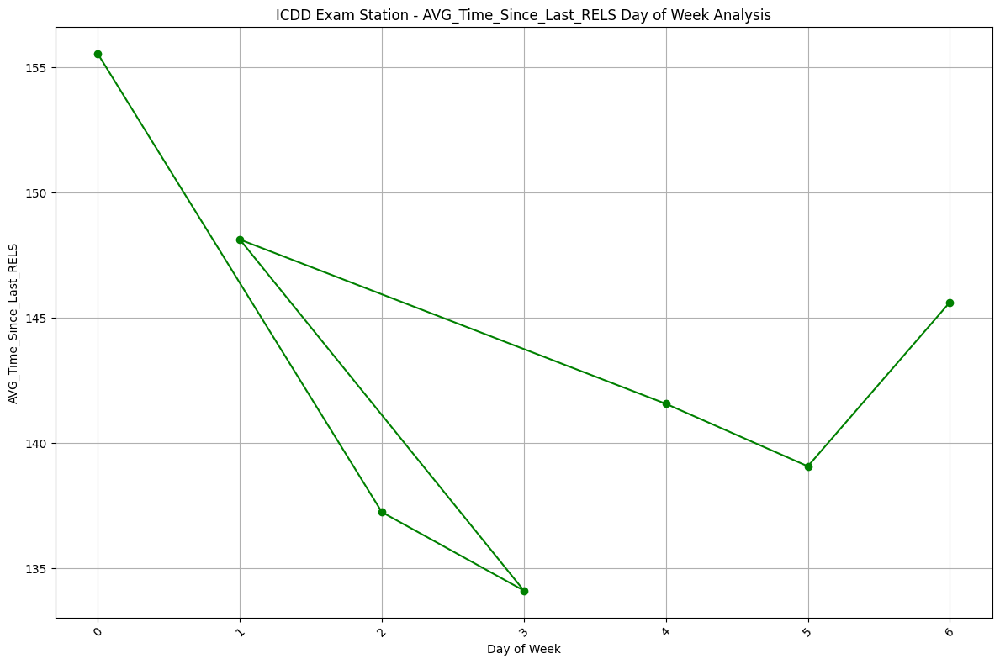

In [90]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Time_Since_Last_RELS'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Time_Since_Last_RELS Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_RELS')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

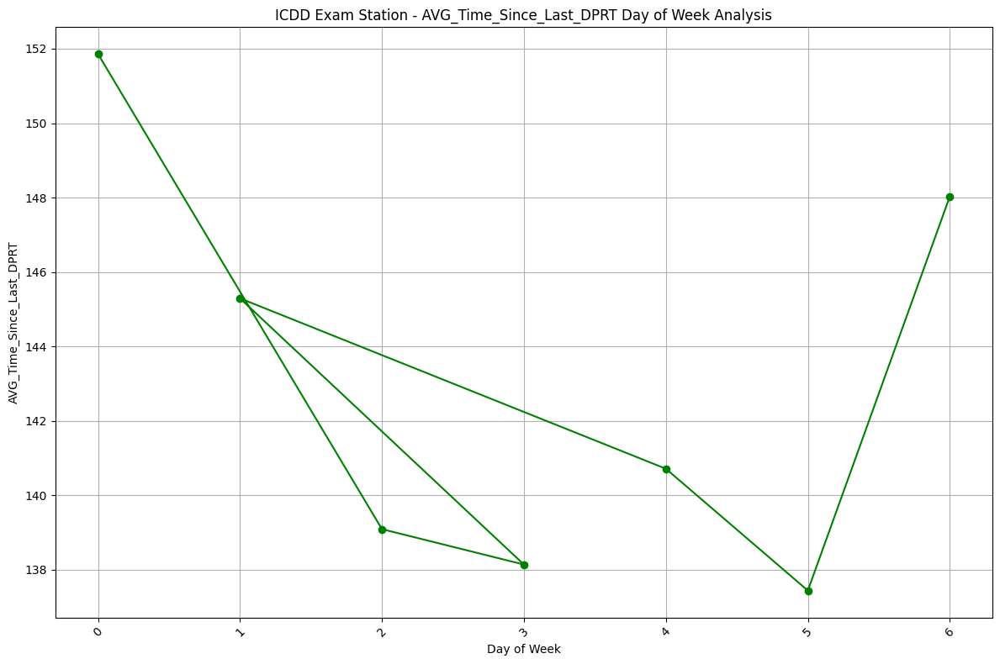

In [91]:
plt.figure(figsize=(12,8))
plt.plot(icdd_weekend['R_DAYOFWEEK'], icdd_weekend['AVG_Time_Since_Last_DPRT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - AVG_Time_Since_Last_DPRT Day of Week Analysis')
plt.xlabel('Day of Week')
plt.ylabel('AVG_Time_Since_Last_DPRT')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Hourly Analysis

In [92]:
icdd_arvl_h = icdd.groupby('ARVL_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
icdd_arvl_h = pd.DataFrame(icdd_arvl_h)
icdd_plct_h = icdd.groupby('PLCT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
icdd_plct_h = pd.DataFrame(icdd_plct_h)
icdd_rels_h = icdd.groupby('RELS_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
icdd_rels_h = pd.DataFrame(icdd_rels_h)
icdd_dprt_h = icdd.groupby('DPRT_H')['RDATE'].count().reset_index(name='RAKE_COUNT')
icdd_dprt_h = pd.DataFrame(icdd_dprt_h)

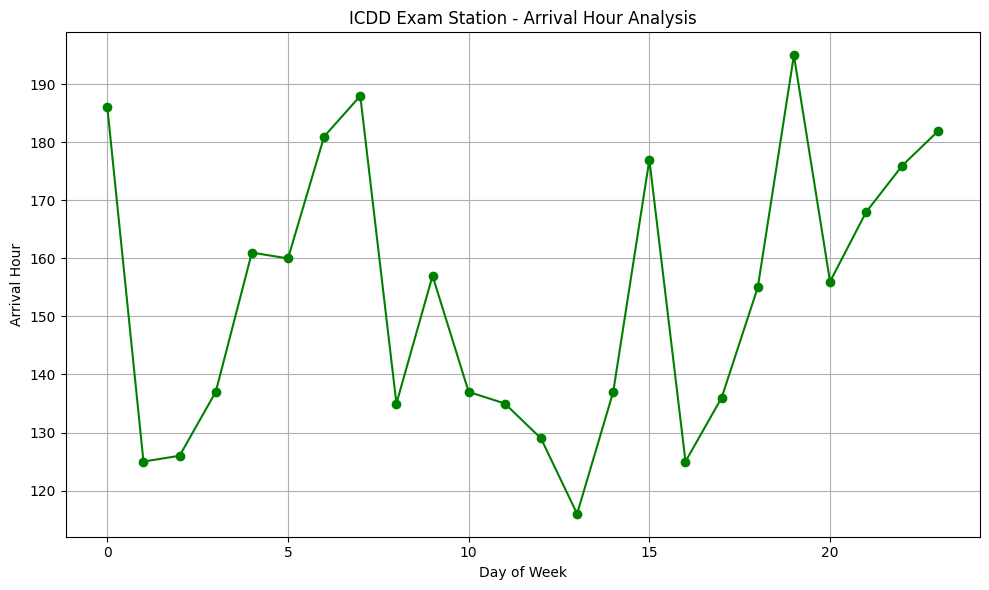

In [93]:
plt.figure(figsize=(10,6))
plt.plot(icdd_arvl_h['ARVL_H'], icdd_arvl_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Arrival Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Arrival Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

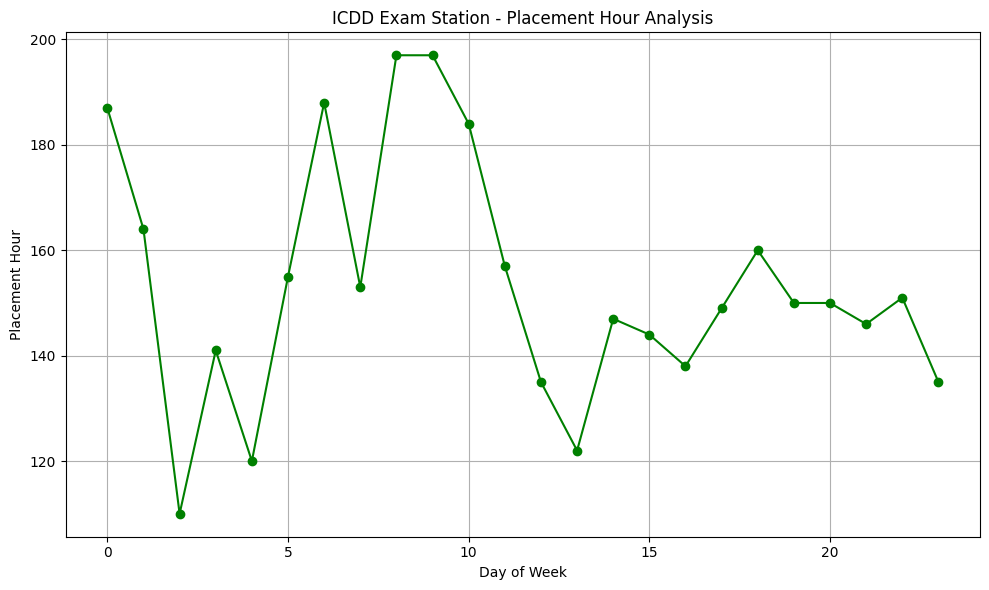

In [94]:
plt.figure(figsize=(10,6))
plt.plot(icdd_plct_h['PLCT_H'], icdd_plct_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Placement Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Placement Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

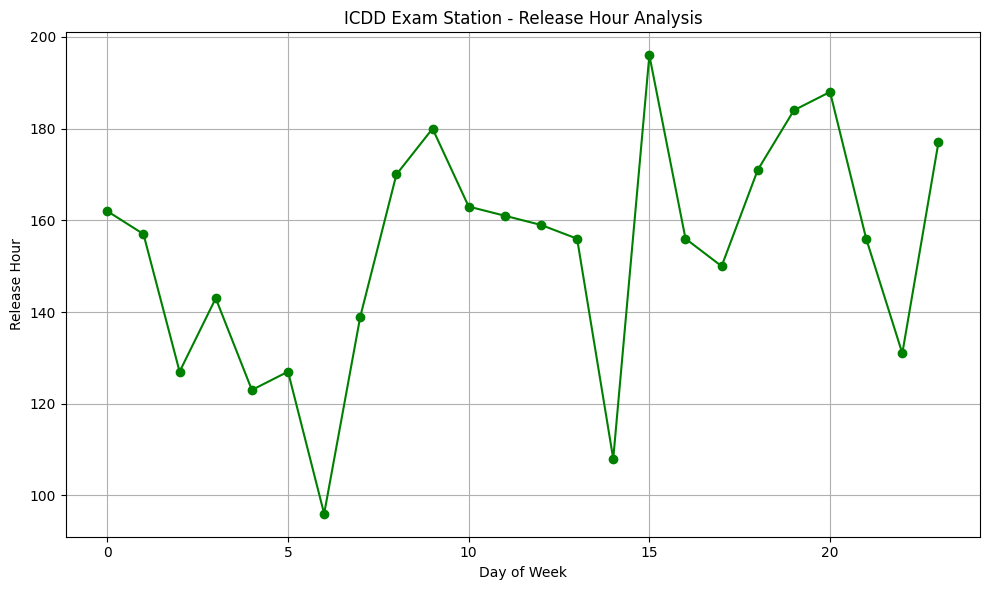

In [95]:
plt.figure(figsize=(10,6))
plt.plot(icdd_rels_h['RELS_H'], icdd_rels_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Release Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Release Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

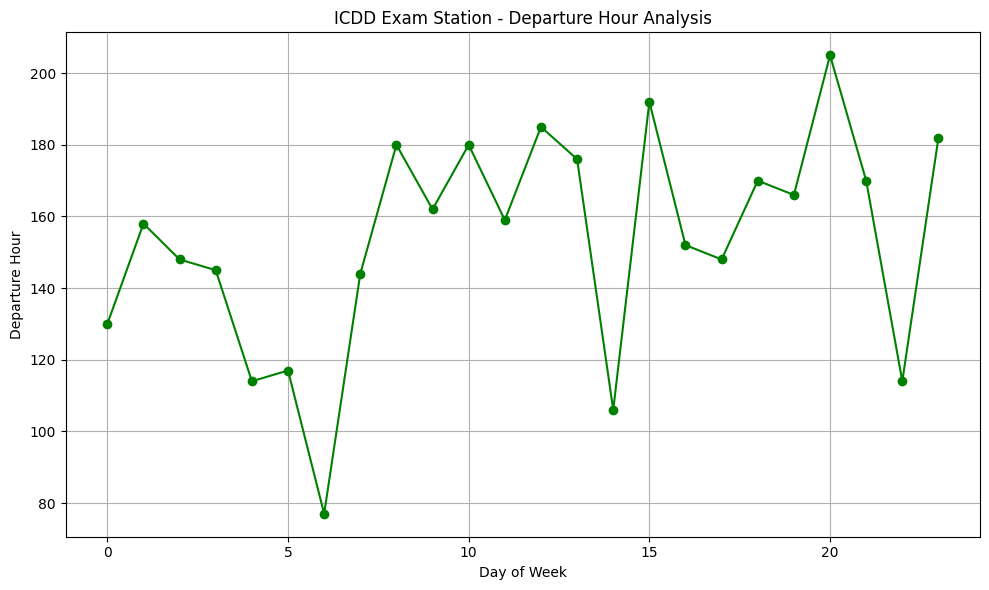

In [96]:
plt.figure(figsize=(10,6))
plt.plot(icdd_dprt_h['DPRT_H'], icdd_dprt_h['RAKE_COUNT'], marker='o', linestyle='-', color='green')
plt.title('ICDD Exam Station - Departure Hour Analysis')
plt.xlabel('Day of Week')
plt.ylabel('Departure Hour')
plt.grid(True)
plt.tight_layout()
plt.show()

In [97]:
corr_df = df1.copy()

In [98]:
corr_df['R_DATEOFMONTH'] = corr_df['R_DATEOFMONTH'].str.split('-').str[2].astype('int64')
corr_df['R_MONTH'] = corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
corr_df['R_WEEK'] = corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE'], axis=1, inplace=True)

In [99]:
corr = corr_df.corr()

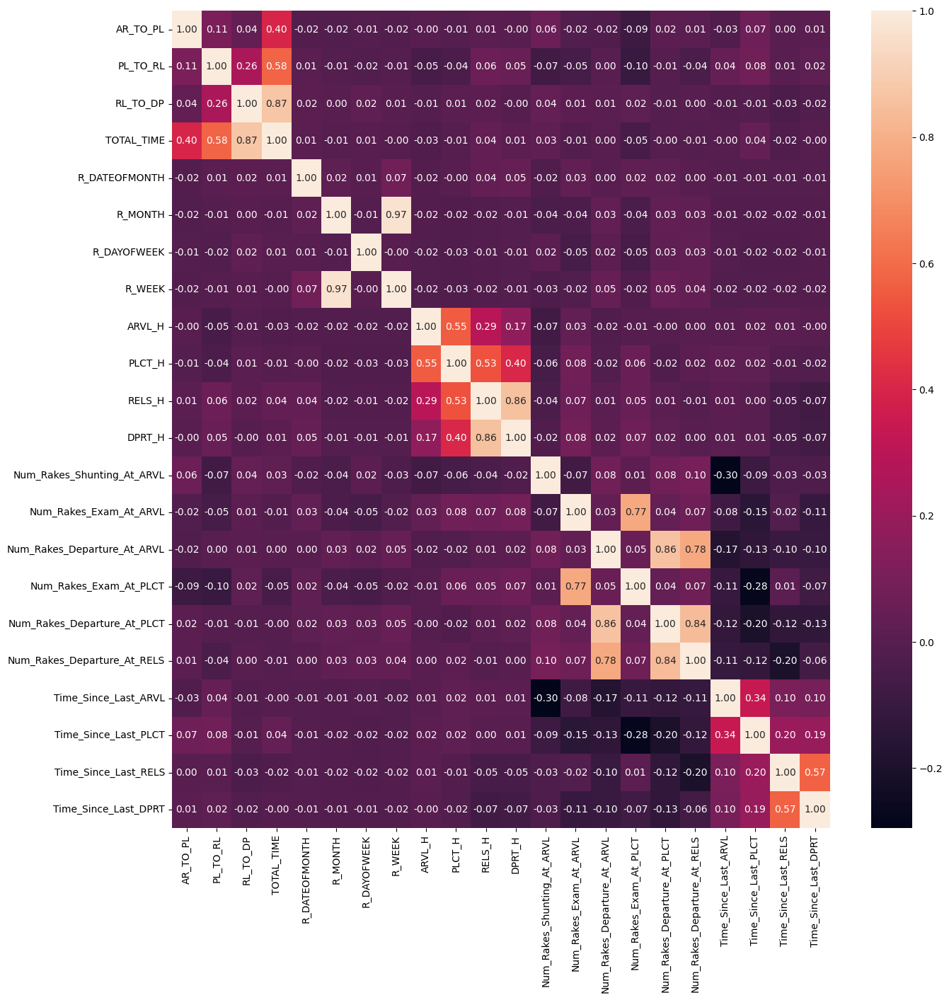

In [100]:
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, fmt=".2f")
plt.show()

#### 10 new feature analysis

In [101]:
df1[['Num_Rakes_Shunting_At_ARVL','Num_Rakes_Exam_At_ARVL','Num_Rakes_Departure_At_ARVL','Num_Rakes_Exam_At_PLCT','Num_Rakes_Departure_At_PLCT','Num_Rakes_Departure_At_RELS','Time_Since_Last_ARVL','Time_Since_Last_PLCT','Time_Since_Last_RELS','Time_Since_Last_DPRT']].describe()

,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
count,3680.000000,3680.000000,3680.000000,3680.000000,3680.000000,3680.000000,3680.000000,3680.000000,3680.000000,3680.000000
mean,1.198913,1.855163,1.316576,1.695109,1.344837,1.337500,143.182337,143.002717,142.853261,142.789674
std,1.102814,1.109866,1.216471,1.069470,1.245967,1.269247,131.797202,120.286803,134.106349,134.320062
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,47.000000,50.000000,45.000000,43.000000
50%,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,110.000000,115.500000,110.000000,110.000000
75%,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,200.000000,205.000000,195.000000,200.000000
max,6.000000,6.000000,10.000000,6.000000,10.000000,10.000000,1170.000000,1020.000000,1180.000000,1180.000000


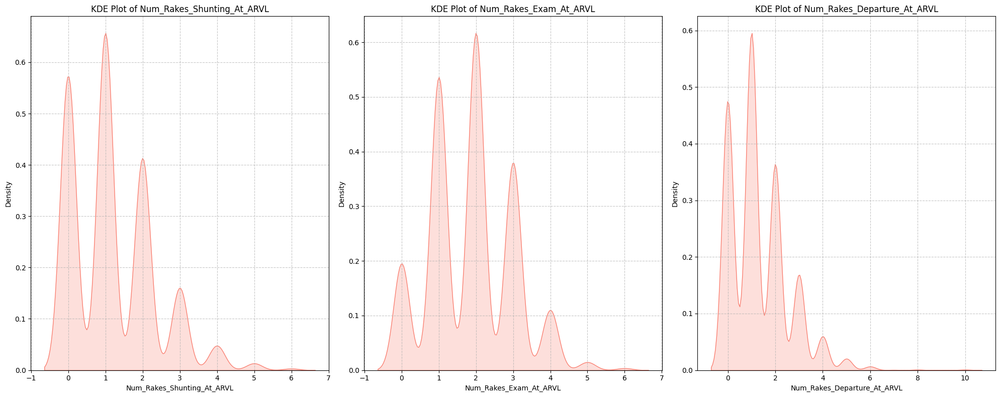

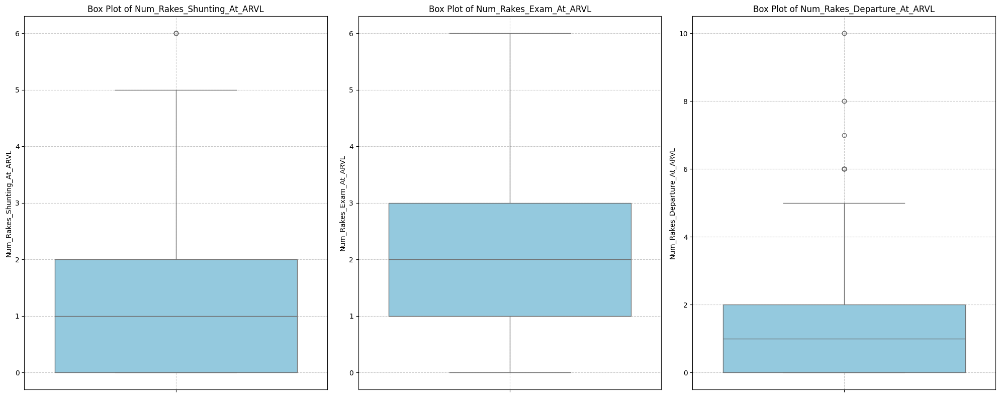

In [102]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Shunting_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Shunting_At_ARVL')
plt.xlabel('Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Exam_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_ARVL')
plt.xlabel('Num_Rakes_Exam_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_ARVL')
plt.xlabel('Num_Rakes_Departure_At_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Shunting_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Shunting_At_ARVL')
plt.ylabel('Num_Rakes_Shunting_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Exam_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_ARVL')
plt.ylabel('Num_Rakes_Exam_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_ARVL'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_ARVL')
plt.ylabel('Num_Rakes_Departure_At_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

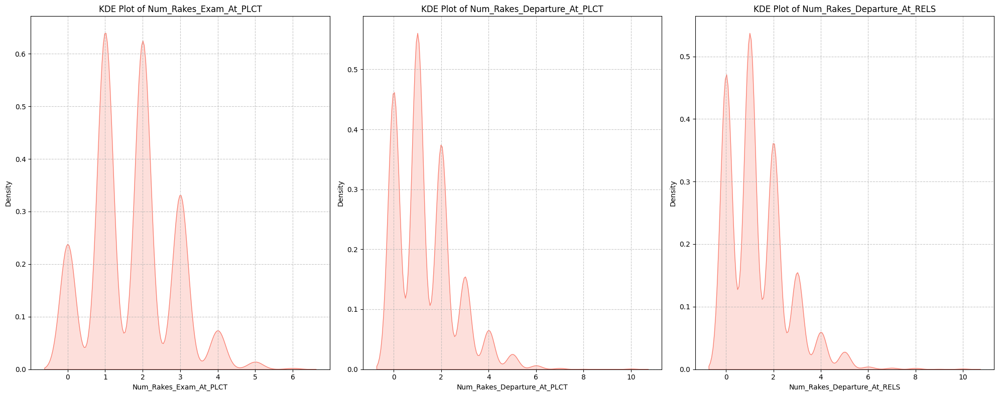

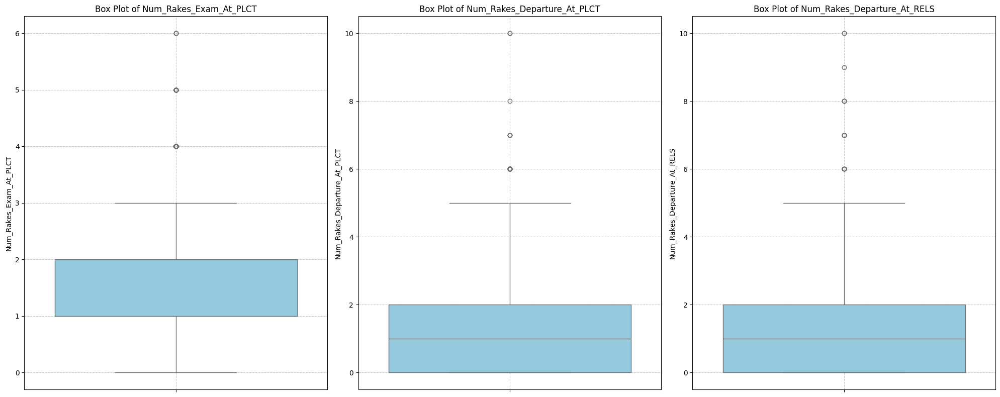

In [103]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.kdeplot(df1['Num_Rakes_Exam_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Exam_At_PLCT')
plt.xlabel('Num_Rakes_Exam_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.kdeplot(df1['Num_Rakes_Departure_At_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_PLCT')
plt.xlabel('Num_Rakes_Departure_At_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.kdeplot(df1['Num_Rakes_Departure_At_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Num_Rakes_Departure_At_RELS')
plt.xlabel('Num_Rakes_Departure_At_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 3, 1)
sns.boxplot(y=df1['Num_Rakes_Exam_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Exam_At_PLCT')
plt.ylabel('Num_Rakes_Exam_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 2)
sns.boxplot(y=df1['Num_Rakes_Departure_At_PLCT'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_PLCT')
plt.ylabel('Num_Rakes_Departure_At_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 3, 3)
sns.boxplot(y=df1['Num_Rakes_Departure_At_RELS'], color='skyblue')
plt.title('Box Plot of Num_Rakes_Departure_At_RELS')
plt.ylabel('Num_Rakes_Departure_At_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

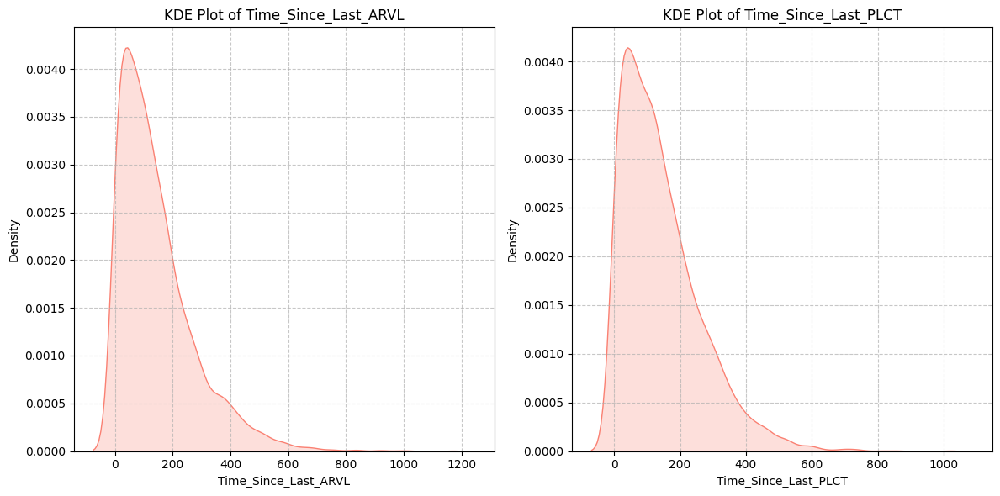

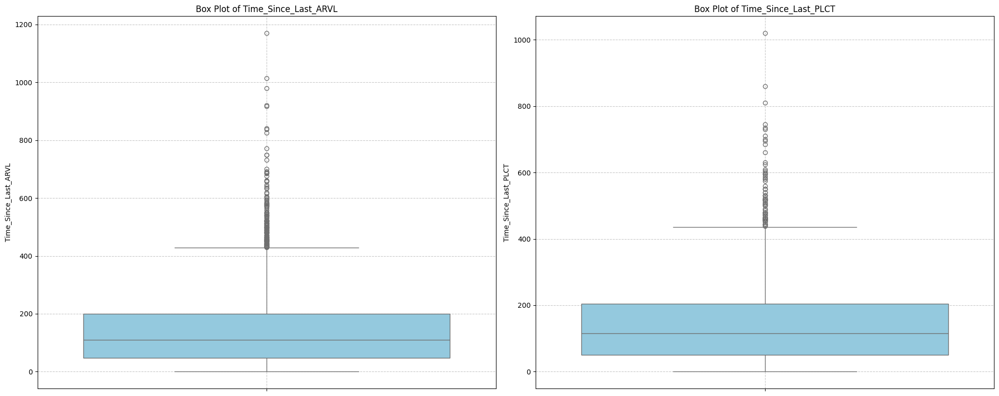

In [104]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_ARVL'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_ARVL')
plt.xlabel('Time_Since_Last_ARVL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_PLCT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_PLCT')
plt.xlabel('Time_Since_Last_PLCT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_ARVL'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_ARVL')
plt.ylabel('Time_Since_Last_ARVL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_PLCT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_PLCT')
plt.ylabel('Time_Since_Last_PLCT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

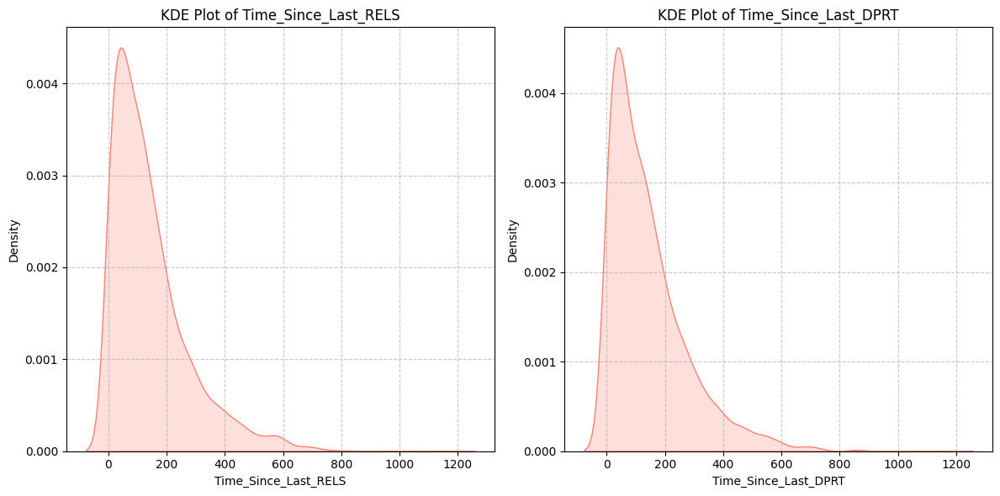

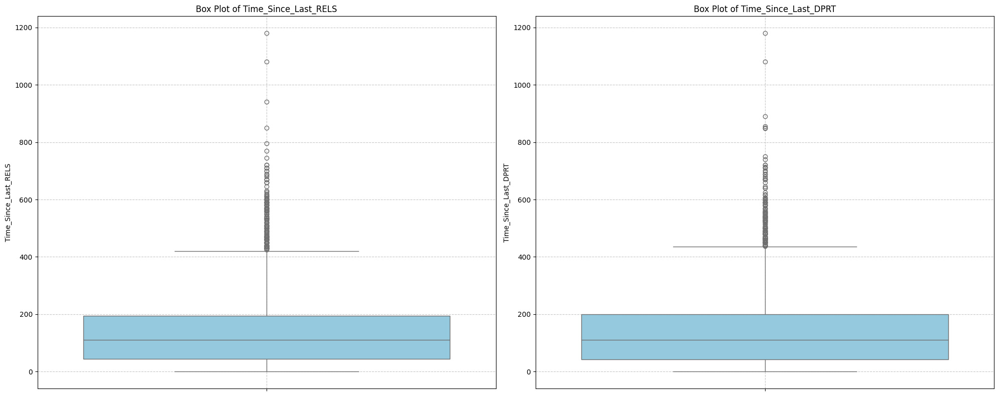

In [105]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(df1['Time_Since_Last_RELS'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_RELS')
plt.xlabel('Time_Since_Last_RELS')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(df1['Time_Since_Last_DPRT'], fill=True, color='salmon')
plt.title('KDE Plot of Time_Since_Last_DPRT')
plt.xlabel('Time_Since_Last_DPRT')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
sns.boxplot(y=df1['Time_Since_Last_RELS'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_RELS')
plt.ylabel('Time_Since_Last_RELS')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=df1['Time_Since_Last_DPRT'], color='skyblue')
plt.title('Box Plot of Time_Since_Last_DPRT')
plt.ylabel('Time_Since_Last_DPRT')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Handling Outliers on the basis of EDA

#### outliers removal

In [106]:
icdd_daily

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
0,2024-04-01,9,266.666667,205.555556,170.555556,2.222222,2.000000,1.000000,2.111111,0.555556,0.666667,122.111111,207.777778,142.111111,148.333333
3,2024-04-02,11,258.909091,278.181818,49.909091,4.272727,2.363636,0.818182,2.363636,0.363636,0.181818,147.363636,106.363636,147.363636,115.454545
1,2024-04-03,14,638.714286,132.500000,40.500000,4.285714,2.285714,1.000000,1.928571,1.071429,1.357143,102.285714,103.571429,98.571429,103.571429
4,2024-04-04,11,473.000000,39.545455,45.000000,2.272727,1.272727,2.181818,0.636364,2.454545,2.454545,156.454545,126.363636,128.181818,137.818182
5,2024-04-05,9,616.777778,236.666667,13.333333,2.333333,1.666667,1.888889,1.222222,2.000000,2.111111,122.777778,137.222222,162.777778,172.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2025-03-27,12,103.500000,300.833333,18.583333,1.583333,2.333333,0.250000,2.166667,0.250000,0.333333,118.000000,135.000000,107.916667,118.333333
362,2025-03-28,7,272.285714,217.857143,14.285714,1.000000,1.285714,1.000000,1.000000,1.000000,1.285714,195.285714,161.428571,202.142857,208.571429
363,2025-03-29,12,209.833333,229.166667,60.916667,0.500000,1.583333,1.250000,1.333333,1.250000,1.166667,139.000000,143.333333,127.083333,119.166667
361,2025-03-30,10,54.000000,345.500000,392.600000,0.200000,0.900000,0.800000,0.600000,0.800000,0.700000,176.000000,172.500000,153.500000,146.000000


In [107]:
icdd_daily.describe()

,R_DATEOFMONTH,RAKE_COUNT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME,AVG_Num_Rakes_Shunting_At_ARVL,AVG_Num_Rakes_Exam_At_ARVL,AVG_Num_Rakes_Departure_At_ARVL,AVG_Num_Rakes_Exam_At_PLCT,AVG_Num_Rakes_Departure_At_PLCT,AVG_Num_Rakes_Departure_At_RELS,AVG_Time_Since_Last_ARVL,AVG_Time_Since_Last_PLCT,AVG_Time_Since_Last_RELS,AVG_Time_Since_Last_DPRT
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,2024-09-30 00:00:00,10.082192,196.792440,280.387889,174.948703,1.157520,1.815516,1.256012,1.663796,1.275924,1.270822,149.531730,150.788852,152.919563,153.299131
min,2024-04-01 00:00:00,3.000000,17.625000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,56.700000,70.384615,75.000000,82.500000
25%,2024-07-01 00:00:00,8.000000,95.846154,180.714286,28.777778,0.555556,1.333333,0.444444,1.200000,0.428571,0.416667,118.833333,119.833333,120.000000,120.454545
50%,2024-09-30 00:00:00,10.000000,142.444444,246.100000,49.909091,1.000000,1.818182,1.142857,1.666667,1.166667,1.153846,141.700000,144.090909,144.000000,144.444444
75%,2024-12-30 00:00:00,12.000000,234.625000,341.428571,116.727273,1.615385,2.272727,1.800000,2.133333,1.818182,1.800000,172.857143,173.333333,172.727273,173.000000
max,2025-03-31 00:00:00,18.000000,1388.285714,973.333333,4722.200000,4.285714,4.125000,4.769231,4.125000,4.846154,4.857143,316.000000,390.000000,357.000000,357.000000
std,NaN,2.668258,164.014335,154.066336,403.531558,0.759090,0.652275,0.957529,0.631296,0.984284,1.008893,44.720685,43.075273,46.265760,45.735002


In [108]:
df1['R_DATEOFMONTH'] = pd.to_datetime(df1['R_DATEOFMONTH'], format='%Y-%m-%d')

In [109]:
merged_icdd_df = pd.merge(df1, icdd_daily[['R_DATEOFMONTH', 'AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME']], on='R_DATEOFMONTH', how='left')

In [110]:
shuntingavg_q1, shuntingavg_q3 = np.quantile(icdd_daily['AVG_SHUNTING_TIME'], q=(0.25,0.75))

shuntingavg_lf = shuntingavg_q1 - 1.5*(shuntingavg_q3-shuntingavg_q1)
shuntingavg_hf = shuntingavg_q3 + 1.5*(shuntingavg_q3-shuntingavg_q1)

print(shuntingavg_lf, shuntingavg_hf)

shunting_q1, shunting_q3 = np.quantile(merged_icdd_df['AR_TO_PL'], q=(0.25,0.75))

shunting_lf = shunting_q1 - 1.5*(shunting_q3-shunting_q1)
shunting_hf = shunting_q3 + 1.5*(shunting_q3-shunting_q1)

print(shunting_lf, shunting_hf)

-112.32211538461539 442.7932692307692
-285.0 475.0


In [111]:
shunting_outliers = merged_icdd_df[(merged_icdd_df['AVG_SHUNTING_TIME'] < shuntingavg_lf) & (merged_icdd_df['AR_TO_PL'] < shunting_lf) | (merged_icdd_df['AVG_SHUNTING_TIME'] > shuntingavg_hf) & (merged_icdd_df['AR_TO_PL'] > shunting_hf)]

print(shunting_outliers.count())
shunting_outliers.head()

RDATE                          67
RAKETYPE                       67
EXAMSTTN                       67
ZONE                           67
AR_TO_PL                       67
PL_TO_RL                       67
RL_TO_DP                       67
TOTAL_TIME                     67
R_DATEOFMONTH                  67
R_MONTH                        67
R_DAYOFWEEK                    67
R_WEEK                         67
ARVL_H                         67
PLCT_H                         67
RELS_H                         67
DPRT_H                         67
Num_Rakes_Shunting_At_ARVL     67
Num_Rakes_Exam_At_ARVL         67
Num_Rakes_Departure_At_ARVL    67
Num_Rakes_Exam_At_PLCT         67
Num_Rakes_Departure_At_PLCT    67
Num_Rakes_Departure_At_RELS    67
Time_Since_Last_ARVL           67
Time_Since_Last_PLCT           67
Time_Since_Last_RELS           67
Time_Since_Last_DPRT           67
AVG_SHUNTING_TIME              67
AVG_EXAMINATION_TIME           67
AVG_DEPARTURE_TIME             67
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
1,2024-04-03,BLC,ICDD,NC,5277,100,0,5377,2024-04-03,2024-04,...,0,3,3,4.0,20.0,40.0,45.0,638.714286,132.500000,40.500000
15,2024-04-03,BLC,ICDD,NC,1332,695,0,2027,2024-04-03,2024-04,...,2,0,0,113.0,205.0,50.0,50.0,638.714286,132.500000,40.500000
17,2024-04-04,BLC,ICDD,NC,3163,125,0,3288,2024-04-04,2024-04,...,0,2,2,1.0,310.0,335.0,335.0,473.000000,39.545455,45.000000
21,2024-04-05,BLC,ICDD,NC,3325,850,0,4175,2024-04-05,2024-04,...,1,2,2,5.0,60.0,80.0,80.0,616.777778,236.666667,13.333333
23,2024-04-03,BLC,ICDD,NC,1214,250,0,1464,2024-04-03,2024-04,...,3,0,3,126.0,310.0,25.0,110.0,638.714286,132.500000,40.500000


In [112]:
examinationavg_q1, examinationavg_q3 = np.quantile(icdd_daily['AVG_EXAMINATION_TIME'], q=(0.25,0.75))

examinationavg_lf = examinationavg_q1 - 1.5*(examinationavg_q3-examinationavg_q1)
examinationavg_hf = examinationavg_q3 + 1.5*(examinationavg_q3-examinationavg_q1)

print(examinationavg_lf, examinationavg_hf)

examination_q1, examination_q3 = np.quantile(merged_icdd_df['PL_TO_RL'], q=(0.25,0.75))

examination_lf = examination_q1 - 1.5*(examination_q3-examination_q1)
examination_hf = examination_q3 + 1.5*(examination_q3-examination_q1)

print(examination_lf, examination_hf)

-60.35714285714286 582.5
-412.5 687.5


In [113]:
examination_outliers = merged_icdd_df[(merged_icdd_df['AVG_EXAMINATION_TIME'] < examinationavg_lf) & (merged_icdd_df['PL_TO_RL'] < examination_lf) | (merged_icdd_df['AVG_EXAMINATION_TIME'] > examinationavg_hf) & (merged_icdd_df['PL_TO_RL'] > examination_hf)]

print(examination_outliers.count())
examination_outliers.head()

RDATE                          76
RAKETYPE                       76
EXAMSTTN                       76
ZONE                           76
AR_TO_PL                       76
PL_TO_RL                       76
RL_TO_DP                       76
TOTAL_TIME                     76
R_DATEOFMONTH                  76
R_MONTH                        76
R_DAYOFWEEK                    76
R_WEEK                         76
ARVL_H                         76
PLCT_H                         76
RELS_H                         76
DPRT_H                         76
Num_Rakes_Shunting_At_ARVL     76
Num_Rakes_Exam_At_ARVL         76
Num_Rakes_Departure_At_ARVL    76
Num_Rakes_Exam_At_PLCT         76
Num_Rakes_Departure_At_PLCT    76
Num_Rakes_Departure_At_RELS    76
Time_Since_Last_ARVL           76
Time_Since_Last_PLCT           76
Time_Since_Last_RELS           76
Time_Since_Last_DPRT           76
AVG_SHUNTING_TIME              76
AVG_EXAMINATION_TIME           76
AVG_DEPARTURE_TIME             76
dtype: int64


,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
2,2024-04-11,BLC,ICDD,NC,370,3825,11635,15830,2024-04-11,2024-04,...,1,1,2,917.0,80.0,5.0,605.0,308.416667,973.333333,2083.833333
22,2024-04-11,BLC,ICDD,NC,170,1255,11775,13200,2024-04-11,2024-04,...,2,0,0,85.0,230.0,65.0,0.0,308.416667,973.333333,2083.833333
90,2024-04-11,BLC,ICDD,NC,165,4270,0,4435,2024-04-11,2024-04,...,2,3,2,230.0,250.0,90.0,110.0,308.416667,973.333333,2083.833333
94,2024-04-11,BLC,ICDD,NC,1725,900,1090,3715,2024-04-11,2024-04,...,1,3,3,33.0,120.0,25.0,0.0,308.416667,973.333333,2083.833333
104,2024-04-13,BLC,ICDD,NC,2195,1750,0,3945,2024-04-13,2024-04,...,2,1,1,198.0,125.0,190.0,190.0,577.500000,633.333333,21.666667


In [114]:
departureavg_q1, departureavg_q3 = np.quantile(icdd_daily['AVG_DEPARTURE_TIME'], q=(0.25,0.75))

departureavg_lf = departureavg_q1 - 1.5*(departureavg_q3-departureavg_q1)
departureavg_hf = departureavg_q3 + 1.5*(departureavg_q3-departureavg_q1)

print(departureavg_lf, departureavg_hf)

departure_q1, departure_q3 = np.quantile(merged_icdd_df['RL_TO_DP'], q=(0.25,0.75))

departure_lf = departure_q1 - 1.5*(departure_q3-departure_q1)
departure_hf = departure_q3 + 1.5*(departure_q3-departure_q1)

print(departure_lf, departure_hf)

-103.14646464646466 248.65151515151518
-112.5 187.5


In [115]:
departure_outliers = merged_icdd_df[(merged_icdd_df['AVG_DEPARTURE_TIME'] < departureavg_lf) & (merged_icdd_df['RL_TO_DP'] < departure_lf) | (merged_icdd_df['AVG_DEPARTURE_TIME'] > departureavg_hf) & (merged_icdd_df['RL_TO_DP'] > departure_hf)]

print(departure_outliers.count())
departure_outliers.head()

RDATE                          114
RAKETYPE                       114
EXAMSTTN                       114
ZONE                           114
AR_TO_PL                       114
PL_TO_RL                       114
RL_TO_DP                       114
TOTAL_TIME                     114
R_DATEOFMONTH                  114
R_MONTH                        114
R_DAYOFWEEK                    114
R_WEEK                         114
ARVL_H                         114
PLCT_H                         114
RELS_H                         114
DPRT_H                         114
Num_Rakes_Shunting_At_ARVL     114
Num_Rakes_Exam_At_ARVL         114
Num_Rakes_Departure_At_ARVL    114
Num_Rakes_Exam_At_PLCT         114
Num_Rakes_Departure_At_PLCT    114
Num_Rakes_Departure_At_RELS    114
Time_Since_Last_ARVL           114
Time_Since_Last_PLCT           114
Time_Since_Last_RELS           114
Time_Since_Last_DPRT           114
AVG_SHUNTING_TIME              114
AVG_EXAMINATION_TIME           114
AVG_DEPARTURE_TIME  

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT,AVG_SHUNTING_TIME,AVG_EXAMINATION_TIME,AVG_DEPARTURE_TIME
2,2024-04-11,BLC,ICDD,NC,370,3825,11635,15830,2024-04-11,2024-04,...,1,1,2,917.0,80.0,5.0,605.0,308.416667,973.333333,2083.833333
22,2024-04-11,BLC,ICDD,NC,170,1255,11775,13200,2024-04-11,2024-04,...,2,0,0,85.0,230.0,65.0,0.0,308.416667,973.333333,2083.833333
66,2024-04-17,BLC,ICDD,NC,720,2790,12570,16080,2024-04-17,2024-04,...,2,2,2,30.0,60.0,160.0,80.0,237.866667,456.000000,894.666667
94,2024-04-11,BLC,ICDD,NC,1725,900,1090,3715,2024-04-11,2024-04,...,1,3,3,33.0,120.0,25.0,0.0,308.416667,973.333333,2083.833333
129,2024-04-18,BLC,ICDD,NC,265,3010,4710,7985,2024-04-18,2024-04,...,1,1,1,30.0,285.0,50.0,20.0,140.833333,698.333333,785.000000


In [116]:
combined_outlier_df = pd.concat([shunting_outliers, examination_outliers, departure_outliers], ignore_index=True)
combined_outlier_df = combined_outlier_df.drop_duplicates(keep='first')
combined_outlier_df.count()

RDATE                          229
RAKETYPE                       229
EXAMSTTN                       229
ZONE                           229
AR_TO_PL                       229
PL_TO_RL                       229
RL_TO_DP                       229
TOTAL_TIME                     229
R_DATEOFMONTH                  229
R_MONTH                        229
R_DAYOFWEEK                    229
R_WEEK                         229
ARVL_H                         229
PLCT_H                         229
RELS_H                         229
DPRT_H                         229
Num_Rakes_Shunting_At_ARVL     229
Num_Rakes_Exam_At_ARVL         229
Num_Rakes_Departure_At_ARVL    229
Num_Rakes_Exam_At_PLCT         229
Num_Rakes_Departure_At_PLCT    229
Num_Rakes_Departure_At_RELS    229
Time_Since_Last_ARVL           229
Time_Since_Last_PLCT           229
Time_Since_Last_RELS           229
Time_Since_Last_DPRT           229
AVG_SHUNTING_TIME              229
AVG_EXAMINATION_TIME           229
AVG_DEPARTURE_TIME  

In [117]:
combined_outlier_df.drop(columns=['AVG_SHUNTING_TIME','AVG_EXAMINATION_TIME','AVG_DEPARTURE_TIME'], axis=1, inplace=True)
combined_outlier_df.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-03,BLC,ICDD,NC,5277,100,0,5377,2024-04-03,2024-04,...,1,0,0,0,3,3,4.0,20.0,40.0,45.0
1,2024-04-03,BLC,ICDD,NC,1332,695,0,2027,2024-04-03,2024-04,...,3,2,1,2,0,0,113.0,205.0,50.0,50.0
2,2024-04-04,BLC,ICDD,NC,3163,125,0,3288,2024-04-04,2024-04,...,5,2,1,0,2,2,1.0,310.0,335.0,335.0
3,2024-04-05,BLC,ICDD,NC,3325,850,0,4175,2024-04-05,2024-04,...,5,2,0,1,2,2,5.0,60.0,80.0,80.0
4,2024-04-03,BLC,ICDD,NC,1214,250,0,1464,2024-04-03,2024-04,...,6,2,0,3,0,3,126.0,310.0,25.0,110.0


In [118]:
icdd_updated1 = df1.copy()

In [119]:
merged_for_removal = pd.merge(icdd_updated1, combined_outlier_df, on=list(icdd_updated1.columns), how='left', indicator=True)

icdd_updated1 = merged_for_removal[merged_for_removal['_merge'] == 'left_only']
icdd_updated1 = icdd_updated1.drop(columns='_merge')

icdd_updated1

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BLC,ICDD,NC,661,1365,0,2026,2024-04-01,2024-04,...,0,0,0,0,0,1,0.0,0.0,120.0,120.0
3,2024-04-01,BLC,ICDD,NC,0,0,295,295,2024-04-01,2024-04,...,2,1,0,1,0,0,290.0,550.0,0.0,0.0
4,2024-04-01,BLC,ICDD,NC,0,0,225,225,2024-04-01,2024-04,...,2,2,1,2,1,1,180.0,100.0,180.0,25.0
5,2024-04-01,BLC,ICDD,NC,1350,100,0,1450,2024-04-01,2024-04,...,1,2,2,2,0,1,0.0,321.0,70.0,135.0
6,2024-04-01,BLC,ICDD,NC,70,250,0,320,2024-04-01,2024-04,...,2,2,2,2,2,0,5.0,75.0,205.0,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3675,2025-03-31,BLC,ICDD,NC,0,0,125,125,2025-03-31,2025-03,...,0,0,0,0,0,0,700.0,595.0,460.0,60.0
3676,2025-03-31,BLC,ICDD,NC,18,10,0,28,2025-03-31,2025-03,...,0,0,1,0,1,1,37.0,55.0,65.0,525.0
3677,2025-03-31,BLC,ICDD,NC,130,110,0,240,2025-03-31,2025-03,...,0,0,0,0,0,0,253.0,365.0,465.0,405.0
3678,2025-03-31,BLC,ICDD,NC,0,0,24,24,2025-03-31,2025-03,...,0,0,0,0,0,0,372.0,242.0,132.0,156.0


#### graphs and analysis

In [120]:
updated_corr_df = icdd_updated1.copy()

In [121]:
updated_corr_df['R_DATEOFMONTH'] = updated_corr_df['R_DATEOFMONTH'].dt.day
updated_corr_df['R_MONTH'] = updated_corr_df['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df['R_WEEK'] = updated_corr_df['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr_df.drop(columns=['RDATE','RAKETYPE','EXAMSTTN','ZONE','R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H'], axis=1, inplace=True)

In [122]:
updated_corr = updated_corr_df.corr()

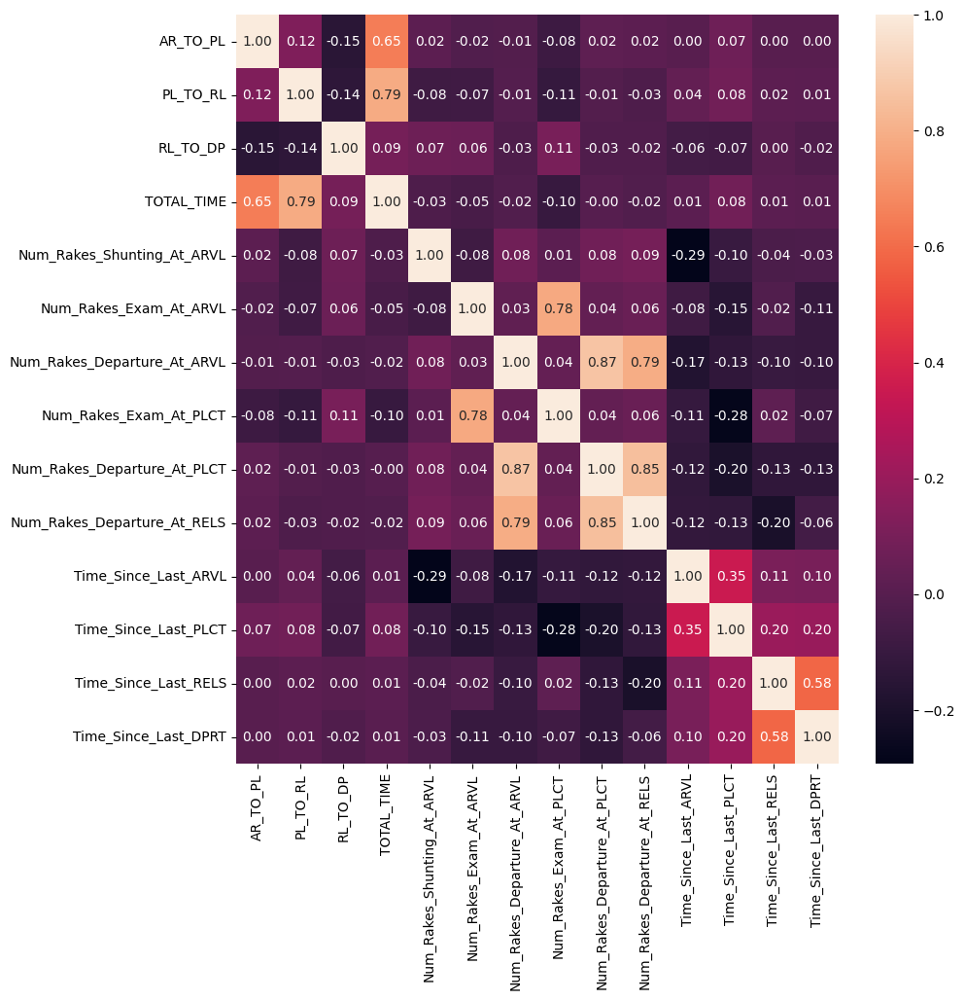

In [123]:
plt.figure(figsize=(10,10))
sns.heatmap(updated_corr, annot=True, fmt=".2f")
plt.show()

In [124]:
updated_corr_df1 = icdd_updated1.copy()

In [125]:
updated_corr_df1['R_DATEOFMONTH'] = updated_corr_df1['R_DATEOFMONTH'].dt.day
updated_corr_df1['R_MONTH'] = updated_corr_df1['R_MONTH'].str.split('-').str[1].astype('int64')
updated_corr_df1['R_WEEK'] = updated_corr_df1['R_WEEK'].str.split('-').str[1].astype('int64')

updated_corr1 = updated_corr_df1[['R_DATEOFMONTH','R_MONTH','R_WEEK','R_DAYOFWEEK','ARVL_H','PLCT_H','RELS_H','DPRT_H']].corr()

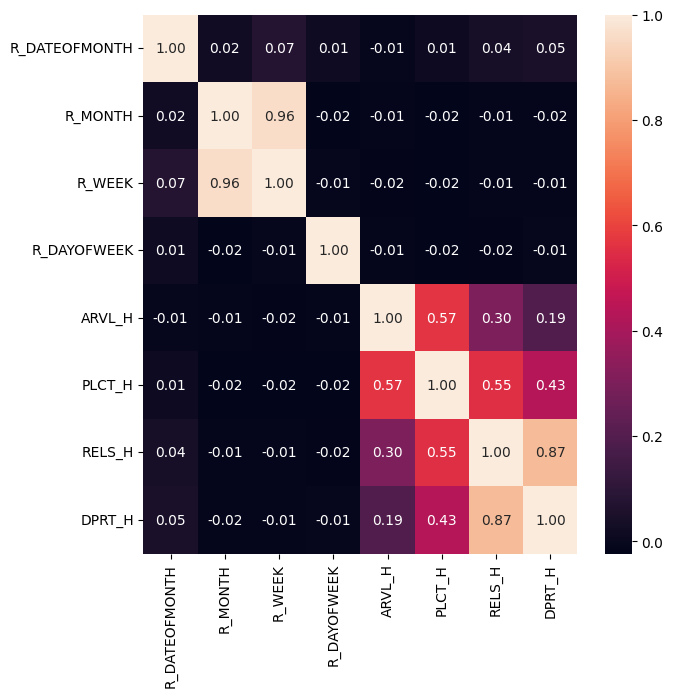

In [126]:
plt.figure(figsize=(7,7))
sns.heatmap(updated_corr1, annot=True, fmt=".2f")
plt.show()

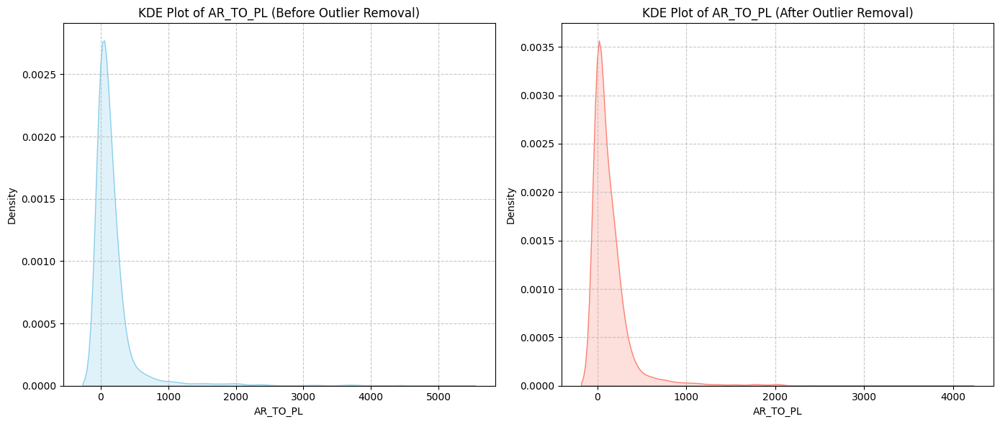

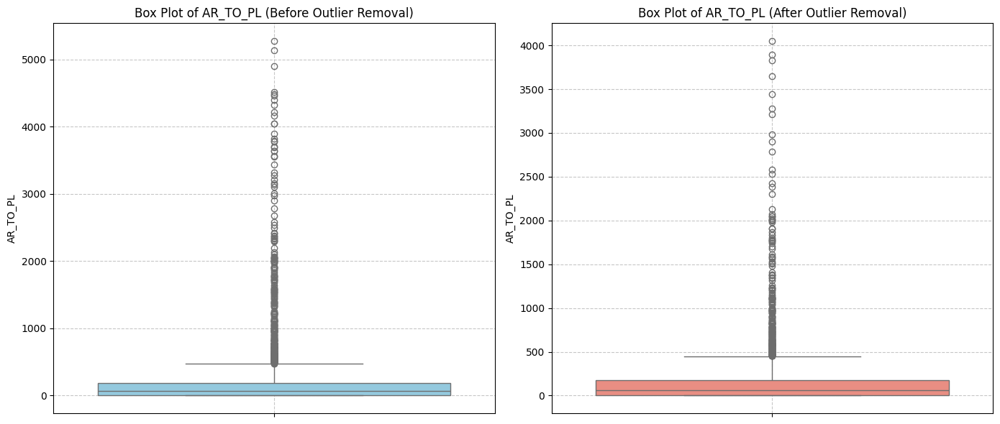

In [127]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(icdd['AR_TO_PL'], fill=True, color='skyblue')
plt.title('KDE Plot of AR_TO_PL (Before Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(icdd_updated1['AR_TO_PL'], fill=True, color='salmon')
plt.title('KDE Plot of AR_TO_PL (After Outlier Removal)')
plt.xlabel('AR_TO_PL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=icdd['AR_TO_PL'], color='skyblue')
plt.title('Box Plot of AR_TO_PL (Before Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=icdd_updated1['AR_TO_PL'], color='salmon')
plt.title('Box Plot of AR_TO_PL (After Outlier Removal)')
plt.ylabel('AR_TO_PL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

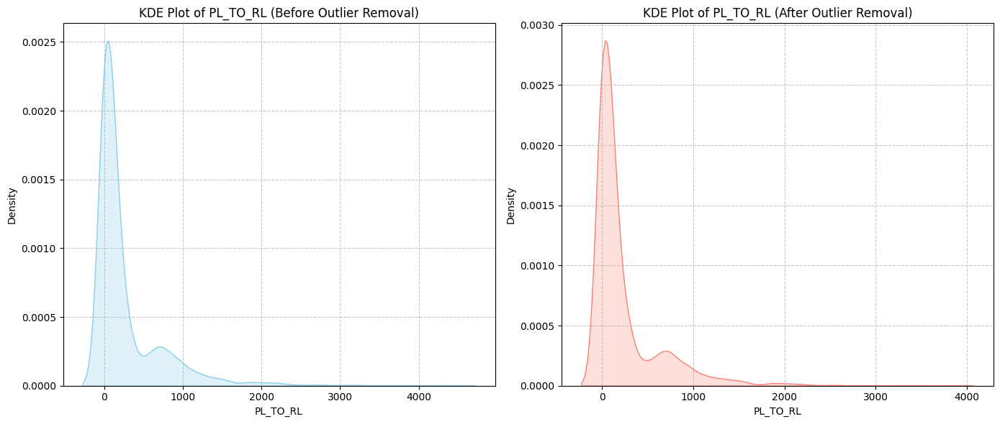

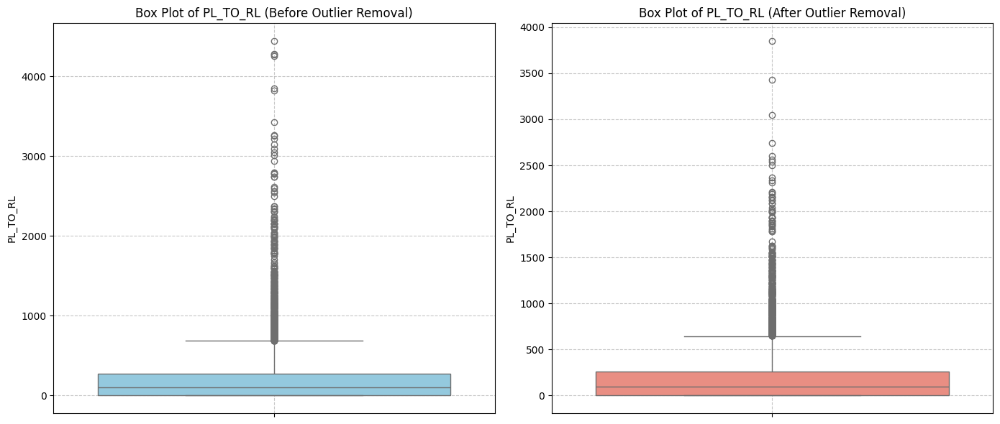

In [128]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(icdd['PL_TO_RL'], fill=True, color='skyblue')
plt.title('KDE Plot of PL_TO_RL (Before Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(icdd_updated1['PL_TO_RL'], fill=True, color='salmon')
plt.title('KDE Plot of PL_TO_RL (After Outlier Removal)')
plt.xlabel('PL_TO_RL')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=icdd['PL_TO_RL'], color='skyblue')
plt.title('Box Plot of PL_TO_RL (Before Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=icdd_updated1['PL_TO_RL'], color='salmon')
plt.title('Box Plot of PL_TO_RL (After Outlier Removal)')
plt.ylabel('PL_TO_RL')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

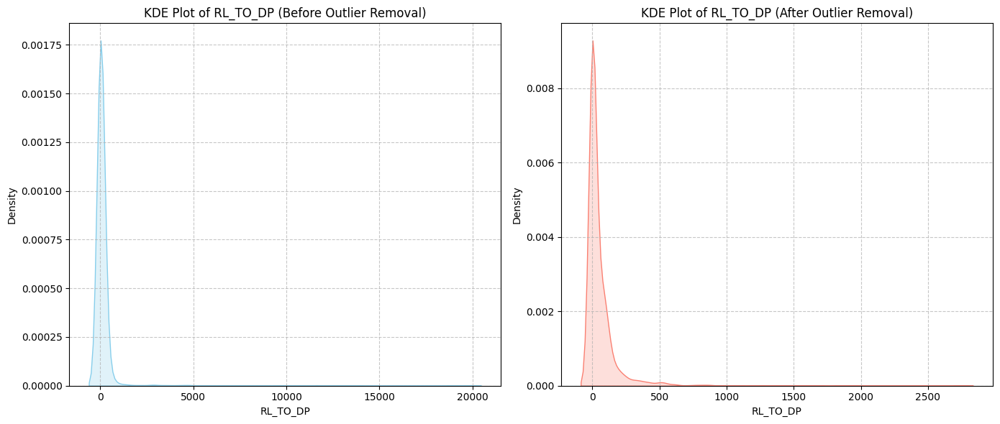

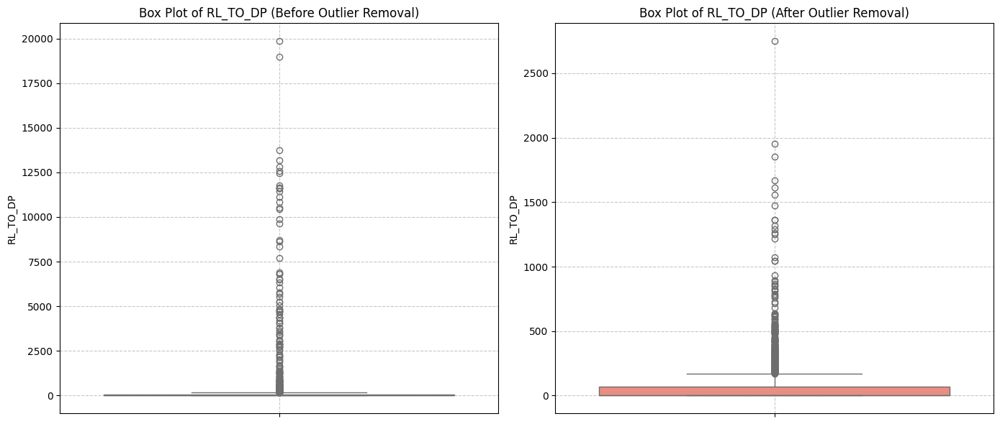

In [129]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.kdeplot(icdd['RL_TO_DP'], fill=True, color='skyblue')
plt.title('KDE Plot of RL_TO_DP (Before Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.kdeplot(icdd_updated1['RL_TO_DP'], fill=True, color='salmon')
plt.title('KDE Plot of RL_TO_DP (After Outlier Removal)')
plt.xlabel('RL_TO_DP')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()


plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.boxplot(y=icdd['RL_TO_DP'], color='skyblue')
plt.title('Box Plot of RL_TO_DP (Before Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.subplot(1, 2, 2)
sns.boxplot(y=icdd_updated1['RL_TO_DP'], color='salmon')
plt.title('Box Plot of RL_TO_DP (After Outlier Removal)')
plt.ylabel('RL_TO_DP')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout() 

### Implementing Cyclic features

In [130]:
icdd_updated2 = icdd_updated1.copy()

In [131]:
icdd_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,R_MONTH,...,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,Time_Since_Last_ARVL,Time_Since_Last_PLCT,Time_Since_Last_RELS,Time_Since_Last_DPRT
0,2024-04-01,BLC,ICDD,NC,661,1365,0,2026,2024-04-01,2024-04,...,0,0,0,0,0,1,0.0,0.0,120.0,120.0
3,2024-04-01,BLC,ICDD,NC,0,0,295,295,2024-04-01,2024-04,...,2,1,0,1,0,0,290.0,550.0,0.0,0.0
4,2024-04-01,BLC,ICDD,NC,0,0,225,225,2024-04-01,2024-04,...,2,2,1,2,1,1,180.0,100.0,180.0,25.0
5,2024-04-01,BLC,ICDD,NC,1350,100,0,1450,2024-04-01,2024-04,...,1,2,2,2,0,1,0.0,321.0,70.0,135.0
6,2024-04-01,BLC,ICDD,NC,70,250,0,320,2024-04-01,2024-04,...,2,2,2,2,2,0,5.0,75.0,205.0,100.0


In [132]:
icdd_updated2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3451 entries, 0 to 3679
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   RDATE                        3451 non-null   object        
 1   RAKETYPE                     3451 non-null   object        
 2   EXAMSTTN                     3451 non-null   object        
 3   ZONE                         3451 non-null   object        
 4   AR_TO_PL                     3451 non-null   int64         
 5   PL_TO_RL                     3451 non-null   int64         
 6   RL_TO_DP                     3451 non-null   int64         
 7   TOTAL_TIME                   3451 non-null   int64         
 8   R_DATEOFMONTH                3451 non-null   datetime64[ns]
 9   R_MONTH                      3451 non-null   object        
 10  R_DAYOFWEEK                  3451 non-null   int64         
 11  R_WEEK                       3451 non-null   obj

In [133]:
icdd_updated2['R_MONTH'] = icdd_updated2['R_MONTH'].str.split('-').str[1].astype('int64')
icdd_updated2['R_DATEOFMONTH'] = icdd_updated2['R_DATEOFMONTH'].dt.day
icdd_updated2['R_WEEK'] = icdd_updated2['R_WEEK'].str.split('-').str[1].astype('int64')


icdd_updated2['R_MONTH_sin'] = np.sin(2 * np.pi * icdd_updated2['R_MONTH'] / 12)
icdd_updated2['R_MONTH_cos'] = np.cos(2 * np.pi * icdd_updated2['R_MONTH'] / 12)

icdd_updated2['R_DAYOFWEEK_sin'] = np.sin(2 * np.pi * icdd_updated2['R_DAYOFWEEK'] / 7)
icdd_updated2['R_DAYOFWEEK_cos'] = np.cos(2 * np.pi * icdd_updated2['R_DAYOFWEEK'] / 7)

icdd_updated2['R_WEEK_sin'] = np.sin(2 * np.pi * icdd_updated2['R_WEEK'] / 52)
icdd_updated2['R_WEEK_cos'] = np.cos(2 * np.pi * icdd_updated2['R_WEEK'] / 52)

icdd_updated2['ARVL_H_sin'] = np.sin(2 * np.pi * icdd_updated2['ARVL_H'] / 24)
icdd_updated2['ARVL_H_cos'] = np.cos(2 * np.pi * icdd_updated2['ARVL_H'] / 24)


icdd_updated2.drop(columns=['R_MONTH', 'R_DAYOFWEEK', 'R_WEEK', 'ARVL_H', 'PLCT_H', 'RELS_H', 'DPRT_H'], axis=1, inplace=True)

icdd_updated2.head()

,RDATE,RAKETYPE,EXAMSTTN,ZONE,AR_TO_PL,PL_TO_RL,RL_TO_DP,TOTAL_TIME,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,...,Time_Since_Last_RELS,Time_Since_Last_DPRT,R_MONTH_sin,R_MONTH_cos,R_DAYOFWEEK_sin,R_DAYOFWEEK_cos,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos
0,2024-04-01,BLC,ICDD,NC,661,1365,0,2026,1,0,...,120.0,120.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.258819,0.965926
3,2024-04-01,BLC,ICDD,NC,0,0,295,295,1,2,...,0.0,0.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.866025,0.500000
4,2024-04-01,BLC,ICDD,NC,0,0,225,225,1,2,...,180.0,25.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.258819,0.965926
5,2024-04-01,BLC,ICDD,NC,1350,100,0,1450,1,1,...,70.0,135.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.258819,0.965926
6,2024-04-01,BLC,ICDD,NC,70,250,0,320,1,2,...,205.0,100.0,0.866025,-0.5,0.0,1.0,0.992709,-0.120537,-0.258819,0.965926


### One Hot Encoding

In [134]:
from sklearn.preprocessing import OneHotEncoder

In [135]:
categorical_cols = ['RAKETYPE']

In [136]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoded_features = encoder.fit_transform(icdd_updated2[categorical_cols])

In [137]:
encoded_col_names = encoder.get_feature_names_out(categorical_cols)
encoded_df = pd.DataFrame(encoded_features, columns=encoded_col_names, index=icdd_updated2.index)

In [138]:
icdd_updated3 = pd.concat([icdd_updated2, encoded_df], axis=1)
icdd_updated3 = icdd_updated3.drop(columns=categorical_cols)

In [139]:
icdd_updated3.drop(columns=['RDATE', 'EXAMSTTN','ZONE','TOTAL_TIME'], axis=1, inplace=True)

In [140]:
icdd_updated3

,AR_TO_PL,PL_TO_RL,RL_TO_DP,R_DATEOFMONTH,Num_Rakes_Shunting_At_ARVL,Num_Rakes_Exam_At_ARVL,Num_Rakes_Departure_At_ARVL,Num_Rakes_Exam_At_PLCT,Num_Rakes_Departure_At_PLCT,Num_Rakes_Departure_At_RELS,...,R_DAYOFWEEK_sin,R_DAYOFWEEK_cos,R_WEEK_sin,R_WEEK_cos,ARVL_H_sin,ARVL_H_cos,RAKETYPE_BKI,RAKETYPE_BLC,RAKETYPE_BLL,RAKETYPE_BLSS
0,661,1365,0,1,0,0,0,0,0,1,...,0.0,1.0,0.992709,-0.120537,-0.258819,9.659258e-01,0.0,1.0,0.0,0.0
3,0,0,295,1,2,1,0,1,0,0,...,0.0,1.0,0.992709,-0.120537,-0.866025,5.000000e-01,0.0,1.0,0.0,0.0
4,0,0,225,1,2,2,1,2,1,1,...,0.0,1.0,0.992709,-0.120537,-0.258819,9.659258e-01,0.0,1.0,0.0,0.0
5,1350,100,0,1,1,2,2,2,0,1,...,0.0,1.0,0.992709,-0.120537,-0.258819,9.659258e-01,0.0,1.0,0.0,0.0
6,70,250,0,1,2,2,2,2,2,0,...,0.0,1.0,0.992709,-0.120537,-0.258819,9.659258e-01,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3675,0,0,125,31,0,0,0,0,0,0,...,0.0,1.0,0.992709,-0.120537,0.965926,-2.588190e-01,0.0,1.0,0.0,0.0
3676,18,10,0,31,0,0,1,0,1,1,...,0.0,1.0,0.992709,-0.120537,0.965926,-2.588190e-01,0.0,1.0,0.0,0.0
3677,130,110,0,31,0,0,0,0,0,0,...,0.0,1.0,0.992709,-0.120537,0.258819,-9.659258e-01,0.0,1.0,0.0,0.0
3678,0,0,24,31,0,0,0,0,0,0,...,0.0,1.0,0.992709,-0.120537,-1.000000,-1.836970e-16,0.0,1.0,0.0,0.0


In [141]:
icdd_updated3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3451 entries, 0 to 3679
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     3451 non-null   int64  
 1   PL_TO_RL                     3451 non-null   int64  
 2   RL_TO_DP                     3451 non-null   int64  
 3   R_DATEOFMONTH                3451 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   3451 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       3451 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  3451 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       3451 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  3451 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  3451 non-null   int64  
 10  Time_Since_Last_ARVL         3451 non-null   float64
 11  Time_Since_Last_PLCT         3451 non-null   float64
 12  Time_Since_Last_RELS         3451 non-null   float64
 13  Time_Since_Last_DPRT   

### Each time frame count analysis

In [142]:
shunting_time_count = icdd_updated3['AR_TO_PL'].value_counts().reset_index()
shunting_time_count.columns = ['AR_TO_PL','RAKE_COUNT']

shunting_time_count = shunting_time_count.sort_values(by='AR_TO_PL').reset_index(drop=True)
shunting_time_count.head(30)

,AR_TO_PL,RAKE_COUNT
0,0,1285
1,1,5
2,2,7
3,3,5
4,4,2
5,5,26
6,7,1
7,8,2
8,9,1
9,10,56


In [143]:
exam_time_count = icdd_updated3['PL_TO_RL'].value_counts().reset_index()
exam_time_count.columns = ['PL_TO_RL','RAKE_COUNT']

exam_time_count = exam_time_count.sort_values(by='PL_TO_RL').reset_index(drop=True)
exam_time_count.head(30)

,PL_TO_RL,RAKE_COUNT
0,0,1342
1,1,5
2,2,1
3,4,1
4,5,19
5,9,2
6,10,6
7,15,9
8,19,1
9,20,4


In [144]:
departure_time_count = icdd_updated3['RL_TO_DP'].value_counts().reset_index()
departure_time_count.columns = ['RL_TO_DP','RAKE_COUNT']

departure_time_count = departure_time_count.sort_values(by='RL_TO_DP').reset_index(drop=True)
departure_time_count.head(30)

,RL_TO_DP,RAKE_COUNT
0,0,2060
1,1,9
2,2,4
3,3,3
4,4,2
5,5,19
6,6,4
7,7,2
8,8,5
9,9,4


# Model Selections Part - single stage (old)

### Preparing columns

In [153]:
icdd_final = icdd_updated3.copy()

In [154]:
icdd_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3451 entries, 0 to 3679
Data columns (total 26 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AR_TO_PL                     3451 non-null   int64  
 1   PL_TO_RL                     3451 non-null   int64  
 2   RL_TO_DP                     3451 non-null   int64  
 3   R_DATEOFMONTH                3451 non-null   int32  
 4   Num_Rakes_Shunting_At_ARVL   3451 non-null   int64  
 5   Num_Rakes_Exam_At_ARVL       3451 non-null   int64  
 6   Num_Rakes_Departure_At_ARVL  3451 non-null   int64  
 7   Num_Rakes_Exam_At_PLCT       3451 non-null   int64  
 8   Num_Rakes_Departure_At_PLCT  3451 non-null   int64  
 9   Num_Rakes_Departure_At_RELS  3451 non-null   int64  
 10  Time_Since_Last_ARVL         3451 non-null   float64
 11  Time_Since_Last_PLCT         3451 non-null   float64
 12  Time_Since_Last_RELS         3451 non-null   float64
 13  Time_Since_Last_DPRT   

In [155]:
target_cols = ['AR_TO_PL', 'PL_TO_RL', 'RL_TO_DP']

base_features = [col for col in icdd_final.columns if col not in target_cols]

X = icdd_final[base_features]
y = icdd_final[target_cols]

In [156]:
base_features

['R_DATEOFMONTH',
 'Num_Rakes_Shunting_At_ARVL',
 'Num_Rakes_Exam_At_ARVL',
 'Num_Rakes_Departure_At_ARVL',
 'Num_Rakes_Exam_At_PLCT',
 'Num_Rakes_Departure_At_PLCT',
 'Num_Rakes_Departure_At_RELS',
 'Time_Since_Last_ARVL',
 'Time_Since_Last_PLCT',
 'Time_Since_Last_RELS',
 'Time_Since_Last_DPRT',
 'R_MONTH_sin',
 'R_MONTH_cos',
 'R_DAYOFWEEK_sin',
 'R_DAYOFWEEK_cos',
 'R_WEEK_sin',
 'R_WEEK_cos',
 'ARVL_H_sin',
 'ARVL_H_cos',
 'RAKETYPE_BKI',
 'RAKETYPE_BLC',
 'RAKETYPE_BLL',
 'RAKETYPE_BLSS']

In [157]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [158]:
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score

In [159]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_indices = y_true != 0

    if not np.any(non_zero_indices):
        return np.nan

    return np.mean(np.abs((y_true[non_zero_indices] - y_pred[non_zero_indices]) / y_true[non_zero_indices])) * 100


In [160]:
models = {}
scalers = {}

## RandomForest Regressor

In [161]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline

In [162]:
rfr_predictions = {}
rfr_metrics = {}

In [163]:
for target in target_cols:
    print(f"RandomForestRegressor model for target: {target}")
    rfr_model = Pipeline(steps=[('regressor', RandomForestRegressor(n_estimators=300, max_depth=15, min_samples_leaf=3, random_state=42, n_jobs=-1))])
    rfr_model.fit(X_train, y_train[target])
    models[f'RFR_{target}'] = rfr_model

    y_pred = rfr_model.predict(X_test)
    rfr_predictions[target] = y_pred

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    rfr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

RandomForestRegressor model for target: AR_TO_PL
 Mean Absolute Error (MAE): 144.5835728578353
 Mean Absolute Percentage Error (MAPE): 159.78527644020826
 Root Mean Squared Error (RMSE): 315.42796034214473
 R-squared (R2): 0.07423957184628294
RandomForestRegressor model for target: PL_TO_RL
 Mean Absolute Error (MAE): 257.9103825254026
 Mean Absolute Percentage Error (MAPE): 205.73612710776655
 Root Mean Squared Error (RMSE): 353.80580636942915
 R-squared (R2): 0.025116912884046827
RandomForestRegressor model for target: RL_TO_DP
 Mean Absolute Error (MAE): 65.27930449183893
 Mean Absolute Percentage Error (MAPE): 109.01179178840586
 Root Mean Squared Error (RMSE): 150.51821493463828
 R-squared (R2): 0.04260806808484596


In [164]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))])}

In [165]:
rfr_predictions

{'AR_TO_PL': array([309.08898467, 155.7038204 ,  89.0244602 , 240.86597208,
        270.77539588, 166.73851403, 207.86026057, 249.92374142,
        102.63161223, 250.81670546,  83.16074074, 173.36555597,
        167.45046315, 150.13852945, 169.59543054, 227.61926433,
        110.88789982, 238.62817905, 298.90942248, 288.77495993,
        237.37694681,  88.02045719, 386.3772831 , 233.61597052,
         92.23073978, 169.17270753, 298.56004381, 158.45760619,
         98.62211771, 100.99843489,  44.16430388, 282.4705024 ,
        148.79899399, 114.89369208, 480.55553049, 130.67085455,
        166.38388612, 152.18870242,  60.52915961, 195.71327741,
        111.94918751, 182.98158354, 248.98729061, 125.67453236,
         74.63788352, 168.18370364, 183.8155725 ,  84.1236404 ,
         94.34437076, 120.05413228, 413.17921909, 276.25936031,
        130.37980873, 232.75877525, 427.13276241,  58.62208503,
         30.07346699, 261.9244794 , 822.69520293, 297.96748504,
        137.3766984 , 150.90

In [166]:
rfr_metrics

{'AR_TO_PL': {'MAE': 144.5835728578353,
  'MAPE': np.float64(159.78527644020826),
  'RMSE': 315.42796034214473,
  'R2': 0.07423957184628294},
 'PL_TO_RL': {'MAE': 257.9103825254026,
  'MAPE': np.float64(205.73612710776655),
  'RMSE': 353.80580636942915,
  'R2': 0.025116912884046827},
 'RL_TO_DP': {'MAE': 65.27930449183893,
  'MAPE': np.float64(109.01179178840586),
  'RMSE': 150.51821493463828,
  'R2': 0.04260806808484596}}

## SupportVector Regressor

In [167]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler

In [168]:
svr_metrics = {}

Training SVR for target: AR_TO_PL
Evaluation for AR_TO_PL (SVR):
 Mean Absolute Error (MAE): 122.18350229688224
 Mean Absolute Percentage Error (MAPE): 165.27723733830248
 Root Mean Squared Error (RMSE): 317.4984989015756
 R-squared (R2): 0.06204589133593752


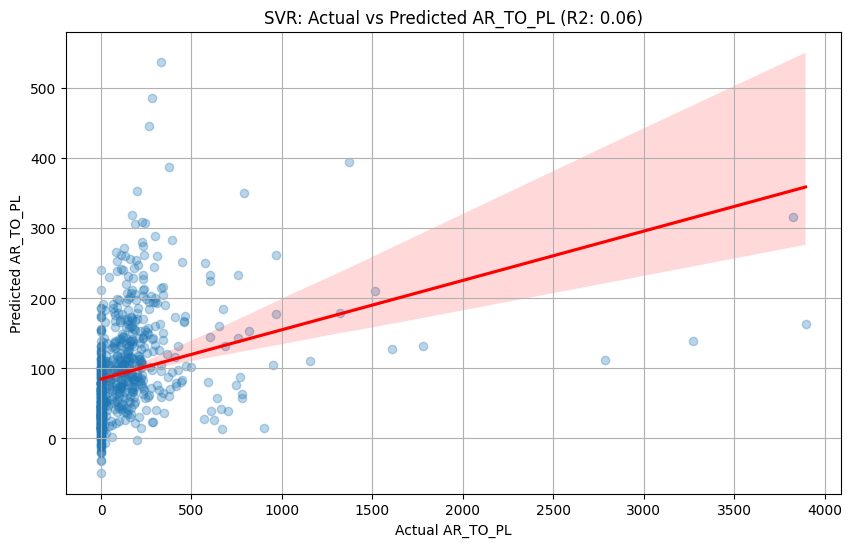

Training SVR for target: PL_TO_RL
Evaluation for PL_TO_RL (SVR):
 Mean Absolute Error (MAE): 199.02944076200538
 Mean Absolute Percentage Error (MAPE): 146.14508061369742
 Root Mean Squared Error (RMSE): 357.1082387588166
 R-squared (R2): 0.006832810112463061


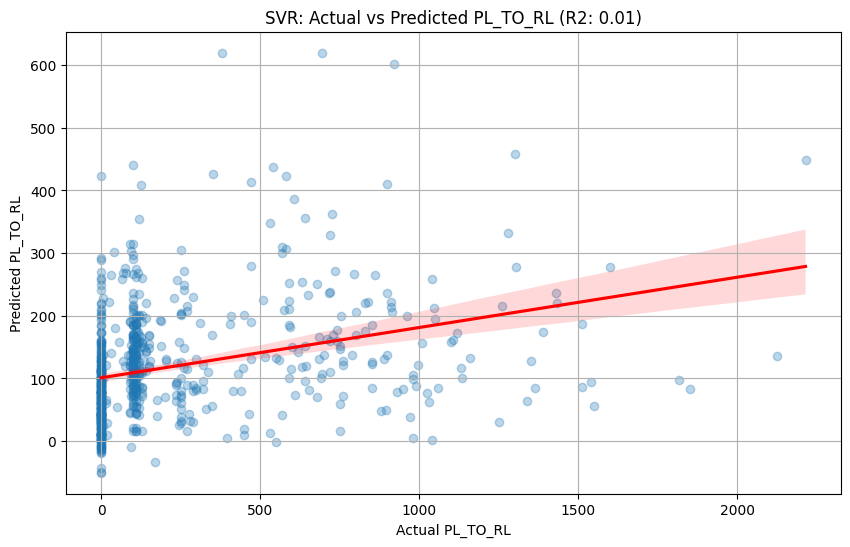

Training SVR for target: RL_TO_DP
Evaluation for RL_TO_DP (SVR):
 Mean Absolute Error (MAE): 56.634872972933906
 Mean Absolute Percentage Error (MAPE): 89.97068496919819
 Root Mean Squared Error (RMSE): 155.36937875508318
 R-squared (R2): -0.020099426409152743


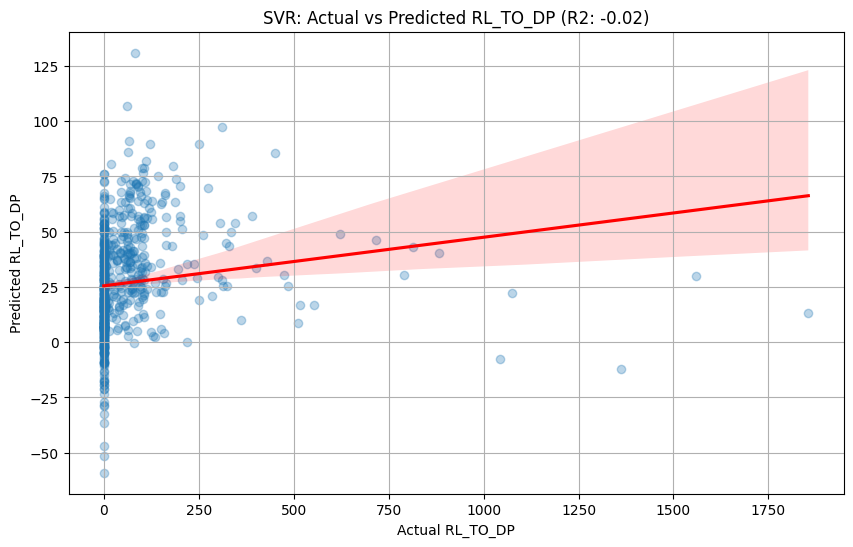

In [169]:
for target in target_cols:
    print(f"Training SVR for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1, gamma='scale')

    svr_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'SVR_{target}'] = svr_model
    scalers[f'SVR_X_scaler_{target}'] = scaler_X
    scalers[f'SVR_y_scaler_{target}'] = scaler_y

    y_pred_scaled = svr_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    svr_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (SVR):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'SVR: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [170]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR()}

In [171]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler()}

In [172]:
svr_metrics

{'AR_TO_PL': {'MAE': 122.18350229688224,
  'MAPE': np.float64(165.27723733830248),
  'RMSE': 317.4984989015756,
  'R2': 0.06204589133593752},
 'PL_TO_RL': {'MAE': 199.02944076200538,
  'MAPE': np.float64(146.14508061369742),
  'RMSE': 357.1082387588166,
  'R2': 0.006832810112463061},
 'RL_TO_DP': {'MAE': 56.634872972933906,
  'MAPE': np.float64(89.97068496919819),
  'RMSE': 155.36937875508318,
  'R2': -0.020099426409152743}}

## KNN

In [173]:
from sklearn.neighbors import KNeighborsRegressor

In [174]:
knn_metrics = {}

Training KNN for target: AR_TO_PL
Evaluation for AR_TO_PL (KNN):
 Mean Absolute Error (MAE): 158.05201875266798
 Mean Absolute Percentage Error (MAPE): 202.9579460531415
 Root Mean Squared Error (RMSE): 339.5049825577041
 R-squared (R2): -0.07248330939930803


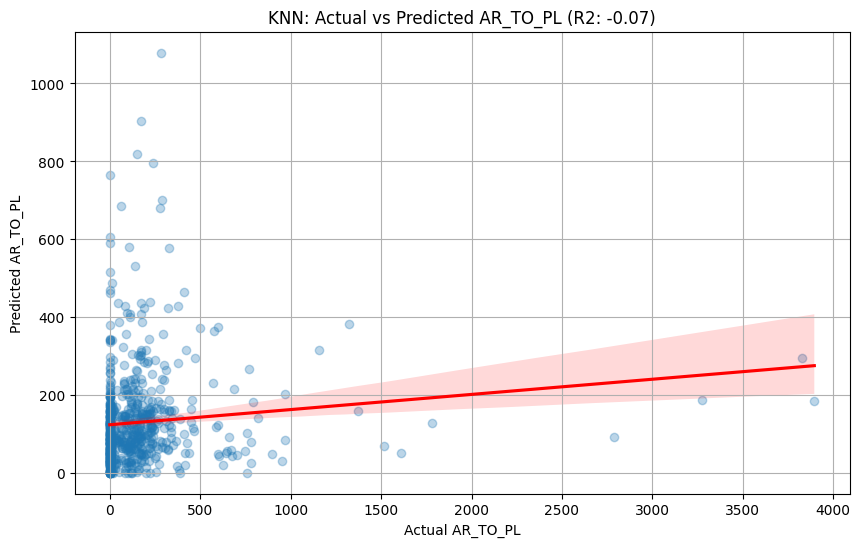

Training KNN for target: PL_TO_RL
Evaluation for PL_TO_RL (KNN):
 Mean Absolute Error (MAE): 255.16126052298495
 Mean Absolute Percentage Error (MAPE): 212.19443362988505
 Root Mean Squared Error (RMSE): 379.7136141901122
 R-squared (R2): -0.12288417501619753


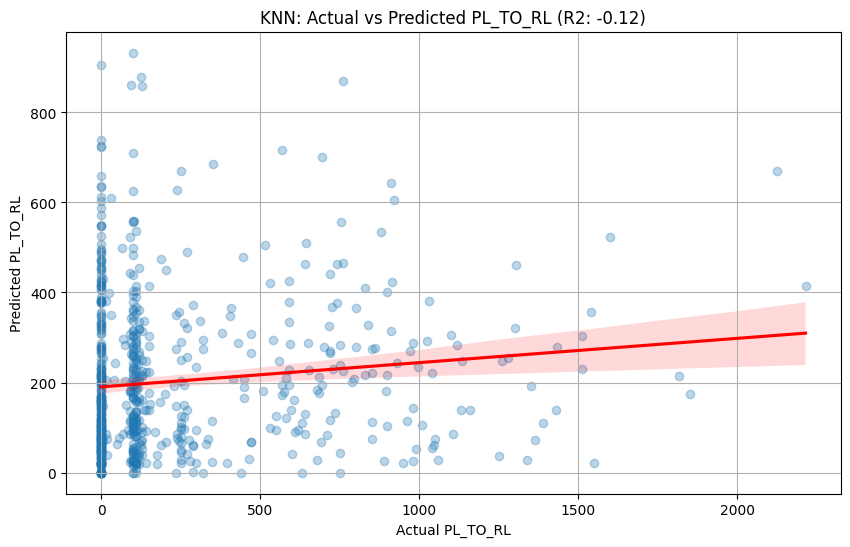

Training KNN for target: RL_TO_DP
Evaluation for RL_TO_DP (KNN):
 Mean Absolute Error (MAE): 72.07231932671681
 Mean Absolute Percentage Error (MAPE): 125.42586616101599
 Root Mean Squared Error (RMSE): 162.01933414881756
 R-squared (R2): -0.1092905952330534


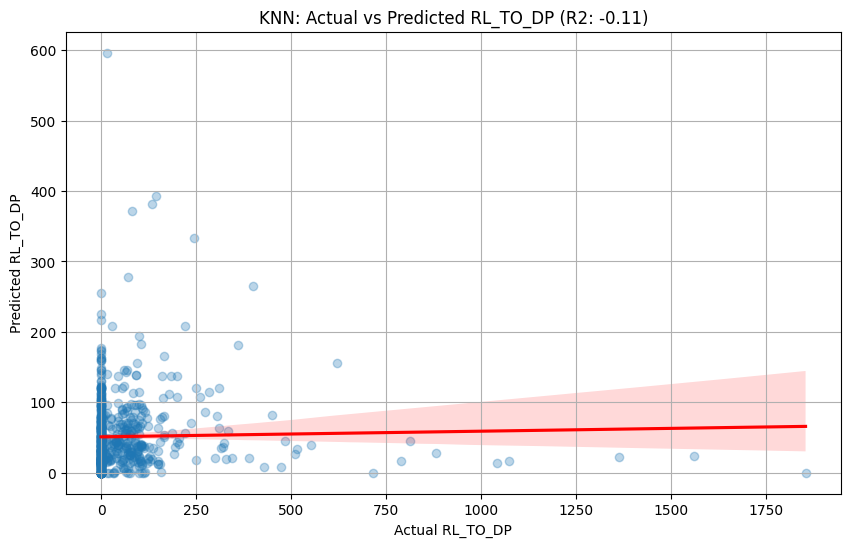

In [175]:
for target in target_cols:
    print(f"Training KNN for target: {target}")

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X_train_scaled = scaler_X.fit_transform(X_train)
    y_train_scaled = scaler_y.fit_transform(y_train[[target]])

    X_test_scaled = scaler_X.transform(X_test)

    knn_model = KNeighborsRegressor(n_neighbors=5, weights='distance', metric='euclidean')

    knn_model.fit(X_train_scaled, y_train_scaled.ravel())

    models[f'KNN_{target}'] = knn_model
    scalers[f'KNN_X_scaler_{target}'] = scaler_X
    scalers[f'KNN_y_scaler_{target}'] = scaler_y

    y_pred_scaled = knn_model.predict(X_test_scaled)

    y_pred = scaler_y.inverse_transform(y_pred_scaled.reshape(-1, 1))

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    knn_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (KNN):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred.flatten(), scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'KNN: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [176]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [177]:
scalers

{'SVR_X_scaler_AR_TO_PL': StandardScaler(),
 'SVR_y_scaler_AR_TO_PL': StandardScaler(),
 'SVR_X_scaler_PL_TO_RL': StandardScaler(),
 'SVR_y_scaler_PL_TO_RL': StandardScaler(),
 'SVR_X_scaler_RL_TO_DP': StandardScaler(),
 'SVR_y_scaler_RL_TO_DP': StandardScaler(),
 'KNN_X_scaler_AR_TO_PL': StandardScaler(),
 'KNN_y_scaler_AR_TO_PL': StandardScaler(),
 'KNN_X_scaler_PL_TO_RL': StandardScaler(),
 'KNN_y_scaler_PL_TO_RL': StandardScaler(),
 'KNN_X_scaler_RL_TO_DP': StandardScaler(),
 'KNN_y_scaler_RL_TO_DP': StandardScaler()}

In [178]:
knn_metrics

{'AR_TO_PL': {'MAE': 158.05201875266798,
  'MAPE': np.float64(202.9579460531415),
  'RMSE': 339.5049825577041,
  'R2': -0.07248330939930803},
 'PL_TO_RL': {'MAE': 255.16126052298495,
  'MAPE': np.float64(212.19443362988505),
  'RMSE': 379.7136141901122,
  'R2': -0.12288417501619753},
 'RL_TO_DP': {'MAE': 72.07231932671681,
  'MAPE': np.float64(125.42586616101599),
  'RMSE': 162.01933414881756,
  'R2': -0.1092905952330534}}

## XGBoost Regressor

In [179]:
from xgboost import XGBRegressor

In [180]:
xgb_metrics = {}

Training XGBoost for target: AR_TO_PL
Evaluation for AR_TO_PL (XGBoost):
 Mean Absolute Error (MAE): 148.1331329345703
 Mean Absolute Percentage Error (MAPE): 168.51527546724182
 Root Mean Squared Error (RMSE): 315.7414245605469
 R-squared (R2): 0.07239866256713867


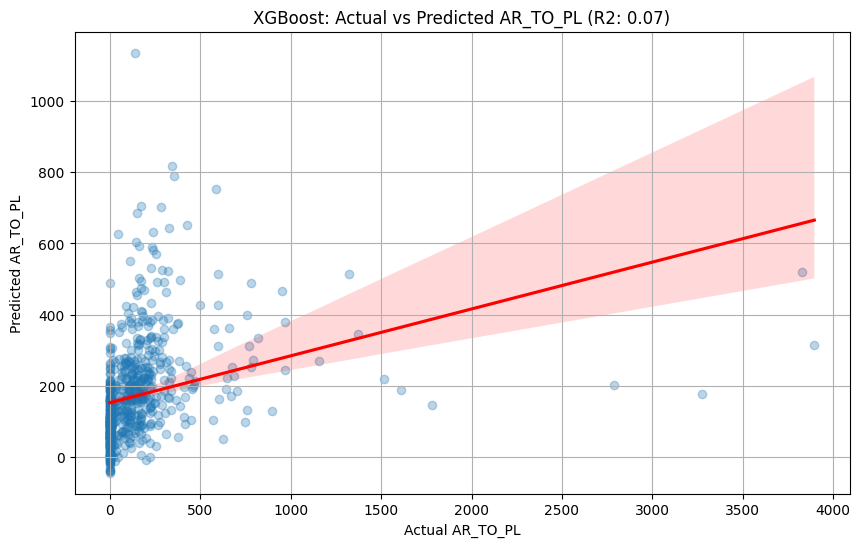

Training XGBoost for target: PL_TO_RL
Evaluation for PL_TO_RL (XGBoost):
 Mean Absolute Error (MAE): 248.07260131835938
 Mean Absolute Percentage Error (MAPE): 205.3728640494246
 Root Mean Squared Error (RMSE): 356.6663818359375
 R-squared (R2): 0.009289085865020752


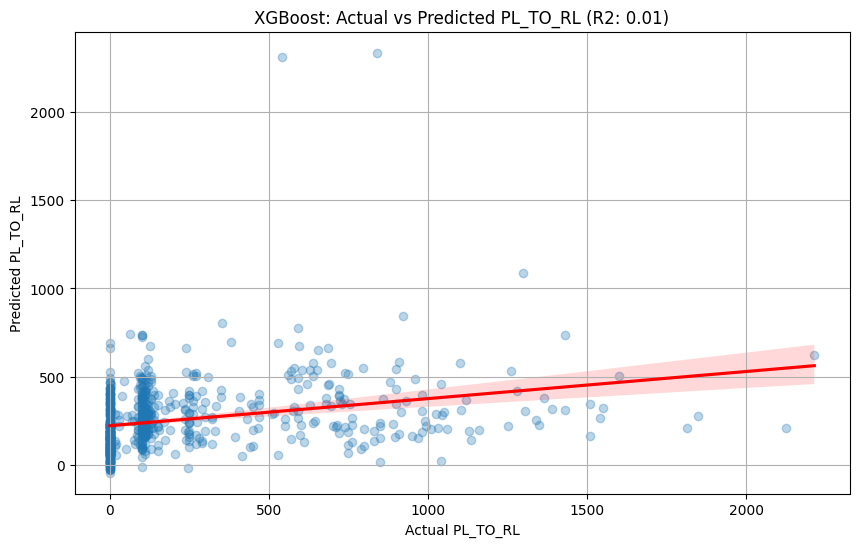

Training XGBoost for target: RL_TO_DP
Evaluation for RL_TO_DP (XGBoost):
 Mean Absolute Error (MAE): 65.0093765258789
 Mean Absolute Percentage Error (MAPE): 122.62043066937159
 Root Mean Squared Error (RMSE): 152.14207458496094
 R-squared (R2): 0.021838903427124023


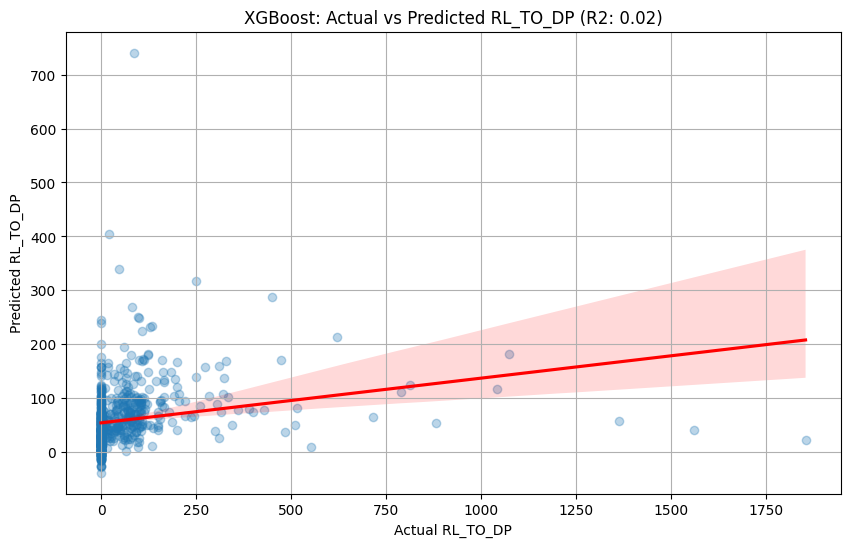

In [181]:
for target in target_cols:
    print(f"Training XGBoost for target: {target}")

    xgb_model = XGBRegressor(objective='reg:squarederror', n_estimators=250, max_depth=8, learning_rate=0.05, subsample=0.8, colsample_bytree=0.8, random_state=42, n_jobs=-1)

    xgb_model.fit(X_train, y_train[target])
    models[f'XGBoost_{target}'] = xgb_model

    y_pred = xgb_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    xgb_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (XGBoost):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'XGBoost: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()


In [182]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [183]:
xgb_metrics

{'AR_TO_PL': {'MAE': 148.1331329345703,
  'MAPE': np.float64(168.51527546724182),
  'RMSE': 315.7414245605469,
  'R2': 0.07239866256713867},
 'PL_TO_RL': {'MAE': 248.07260131835938,
  'MAPE': np.float64(205.3728640494246),
  'RMSE': 356.6663818359375,
  'R2': 0.009289085865020752},
 'RL_TO_DP': {'MAE': 65.0093765258789,
  'MAPE': np.float64(122.62043066937159),
  'RMSE': 152.14207458496094,
  'R2': 0.021838903427124023}}

## LightGBM Regressor

In [184]:
from lightgbm import LGBMRegressor

In [185]:
lgbm_metrics = {}

Training LightGBM for target: AR_TO_PL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1015
[LightGBM] [Info] Number of data points in the train set: 2760, number of used features: 22
[LightGBM] [Info] Start training from score 149.734783
Evaluation for AR_TO_PL (LightGBM):
 Mean Absolute Error (MAE): 148.07517713652013
 Mean Absolute Percentage Error (MAPE): 152.81460644787012
 Root Mean Squared Error (RMSE): 318.1071947360396
 R-squared (R2): 0.05844602524460374


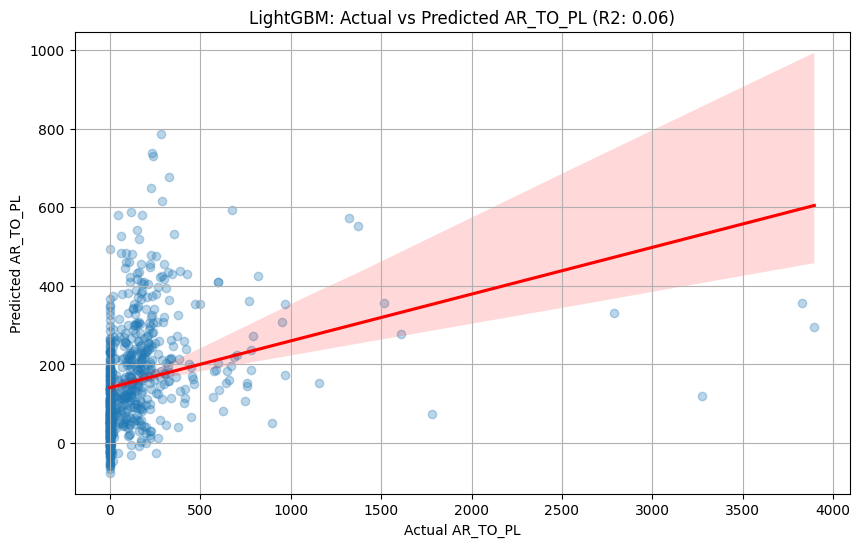

Training LightGBM for target: PL_TO_RL
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1015
[LightGBM] [Info] Number of data points in the train set: 2760, number of used features: 22
[LightGBM] [Info] Start training from score 238.254710
Evaluation for PL_TO_RL (LightGBM):
 Mean Absolute Error (MAE): 243.12268384297008
 Mean Absolute Percentage Error (MAPE): 206.98208771743586
 Root Mean Squared Error (RMSE): 349.8070321176177
 R-squared (R2): 0.04702897581073118


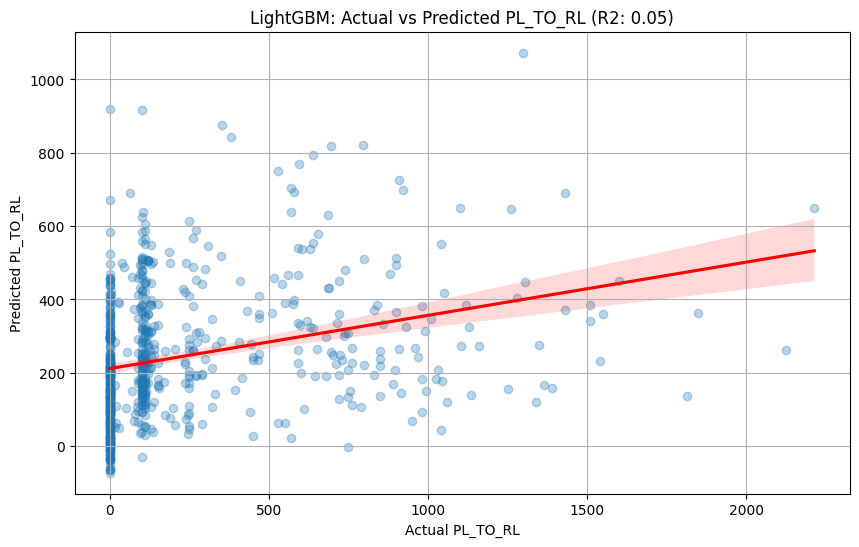

Training LightGBM for target: RL_TO_DP
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1015
[LightGBM] [Info] Number of data points in the train set: 2760, number of used features: 22
[LightGBM] [Info] Start training from score 55.929710
Evaluation for RL_TO_DP (LightGBM):
 Mean Absolute Error (MAE): 64.01292406262479
 Mean Absolute Percentage Error (MAPE): 101.56114303187695
 Root Mean Squared Error (RMSE): 148.6995252931341
 R-squared (R2): 0.06560434750066857


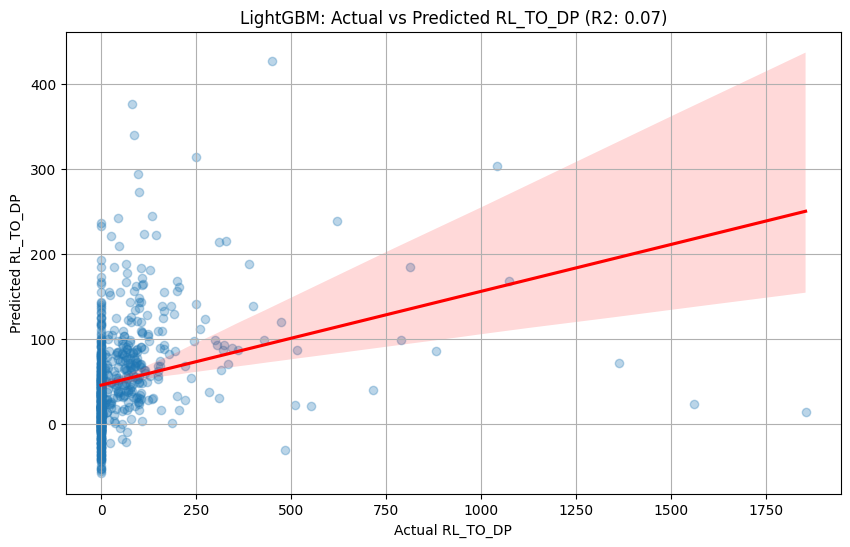

In [186]:
for target in target_cols:
    print(f"Training LightGBM for target: {target}")

    lgbm_model = LGBMRegressor(objective='regression', n_estimators=100, learning_rate=0.1, random_state=42, n_jobs=-1)

    lgbm_model.fit(X_train, y_train[target])
    models[f'LightGBM_{target}'] = lgbm_model

    y_pred = lgbm_model.predict(X_test)

    mae = mean_absolute_error(y_test[target], y_pred)
    mape = mean_absolute_percentage_error(y_test[target], y_pred)
    rmse = root_mean_squared_error(y_test[target], y_pred)
    r2 = r2_score(y_test[target], y_pred)

    lgbm_metrics[target] = {'MAE': mae, 'MAPE': mape, 'RMSE': rmse, 'R2': r2}

    print(f"Evaluation for {target} (LightGBM):")
    print(f" Mean Absolute Error (MAE): {mae}")
    print(f" Mean Absolute Percentage Error (MAPE): {mape}")
    print(f" Root Mean Squared Error (RMSE): {rmse}")
    print(f" R-squared (R2): {r2}")

    plt.figure(figsize=(10, 6))
    sns.regplot(x=y_test[target], y=y_pred, scatter_kws={'alpha':0.3}, line_kws={'color':'red'})
    plt.xlabel(f'Actual {target}')
    plt.ylabel(f'Predicted {target}')
    plt.title(f'LightGBM: Actual vs Predicted {target} (R2: {r2:.2f})')
    plt.grid(True)
    plt.show()
    

In [187]:
models

{'RFR_AR_TO_PL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_PL_TO_RL': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'RFR_RL_TO_DP': Pipeline(steps=[('regressor',
                  RandomForestRegressor(max_depth=15, min_samples_leaf=3,
                                        n_estimators=300, n_jobs=-1,
                                        random_state=42))]),
 'SVR_AR_TO_PL': SVR(),
 'SVR_PL_TO_RL': SVR(),
 'SVR_RL_TO_DP': SVR(),
 'KNN_AR_TO_PL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_PL_TO_RL': KNeighborsRegressor(metric='euclidean', weights='distance'),
 'KNN_RL_TO_DP': KN

In [188]:
lgbm_metrics

{'AR_TO_PL': {'MAE': 148.07517713652013,
  'MAPE': np.float64(152.81460644787012),
  'RMSE': 318.1071947360396,
  'R2': 0.05844602524460374},
 'PL_TO_RL': {'MAE': 243.12268384297008,
  'MAPE': np.float64(206.98208771743586),
  'RMSE': 349.8070321176177,
  'R2': 0.04702897581073118},
 'RL_TO_DP': {'MAE': 64.01292406262479,
  'MAPE': np.float64(101.56114303187695),
  'RMSE': 148.6995252931341,
  'R2': 0.06560434750066857}}

## Overall Performance metrics

In [191]:
metrics = {}
metrics['rfr'] = rfr_metrics
metrics['svr'] = svr_metrics
metrics['knn'] = knn_metrics
metrics['xgb'] = xgb_metrics
metrics['lgbm'] = lgbm_metrics
metrics

{'rfr': {'AR_TO_PL': {'MAE': 144.5835728578353,
   'MAPE': np.float64(159.78527644020826),
   'RMSE': 315.42796034214473,
   'R2': 0.07423957184628294},
  'PL_TO_RL': {'MAE': 257.9103825254026,
   'MAPE': np.float64(205.73612710776655),
   'RMSE': 353.80580636942915,
   'R2': 0.025116912884046827},
  'RL_TO_DP': {'MAE': 65.27930449183893,
   'MAPE': np.float64(109.01179178840586),
   'RMSE': 150.51821493463828,
   'R2': 0.04260806808484596}},
 'svr': {'AR_TO_PL': {'MAE': 122.18350229688224,
   'MAPE': np.float64(165.27723733830248),
   'RMSE': 317.4984989015756,
   'R2': 0.06204589133593752},
  'PL_TO_RL': {'MAE': 199.02944076200538,
   'MAPE': np.float64(146.14508061369742),
   'RMSE': 357.1082387588166,
   'R2': 0.006832810112463061},
  'RL_TO_DP': {'MAE': 56.634872972933906,
   'MAPE': np.float64(89.97068496919819),
   'RMSE': 155.36937875508318,
   'R2': -0.020099426409152743}},
 'knn': {'AR_TO_PL': {'MAE': 158.05201875266798,
   'MAPE': np.float64(202.9579460531415),
   'RMSE': 33

## Feature Importance

In [192]:
import shap

c:\Coding_files\ML_Bootcamp\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


##### Key SHAP Plots and Their Interpretation:

SHAP Summary Plot (Beeswarm Plot):

Purpose: Provides a global overview of feature importance and the direction of their impact across many predictions.

Interpretation:
Features are ordered by overall importance (top is most important).
Points to the right (positive SHAP value) push the prediction higher.
Points to the left (negative SHAP value) push the prediction lower.
Color (red for high feature value, blue for low) shows if high/low values of a feature contribute to higher/lower predictions.


SHAP Force Plot (Individual Prediction Explanation):

Purpose: Explains one specific prediction in detail.

Interpretation:
Starts from the base_value (average prediction).
Red features push the prediction higher.
Blue features push the prediction lower.
The length of the bar indicates the magnitude of the impact.
The final predicted value is shown at the end.


SHAP Dependence Plot:

Purpose: Visualizes the relationship between a single feature's value and its impact (SHAP value) on the model's prediction. Can also show interaction effects.

Interpretation:
See if the relationship is linear, curved, or has thresholds.
Points are colored by another interacting feature (if specified, or SHAP finds the best one). This helps you understand if the effect of the primary feature changes depending on the value of the interacting feature.

In [193]:
target_to_explain = ['XGBoost_AR_TO_PL','LightGBM_PL_TO_RL','LightGBM_RL_TO_DP']


Explaining predictions for XGBoost_AR_TO_PL for 200 samples from X_test.
Displaying SHAP Summary Plot for XGBoost_AR_TO_PL:


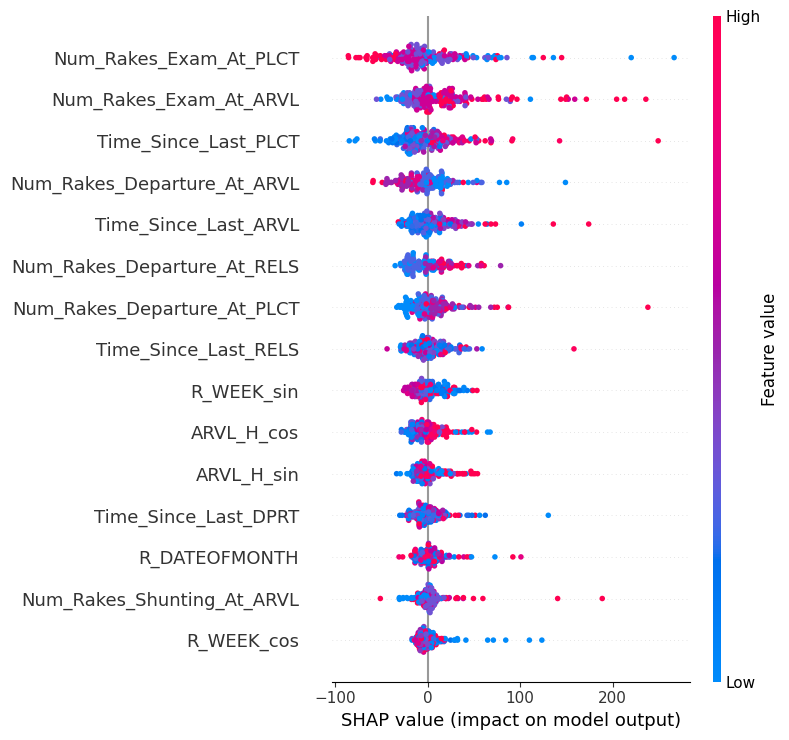

Displaying SHAP Force Plot for instance 0 for XGBoost_AR_TO_PL:


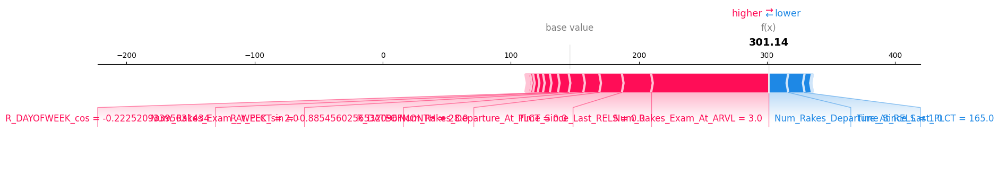


Actual prediction for instance 0: 301.14
Base (Expected) value for XGBoost_AR_TO_PL: 145.94
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'ARVL_H_sin' vs XGBoost_AR_TO_PL:


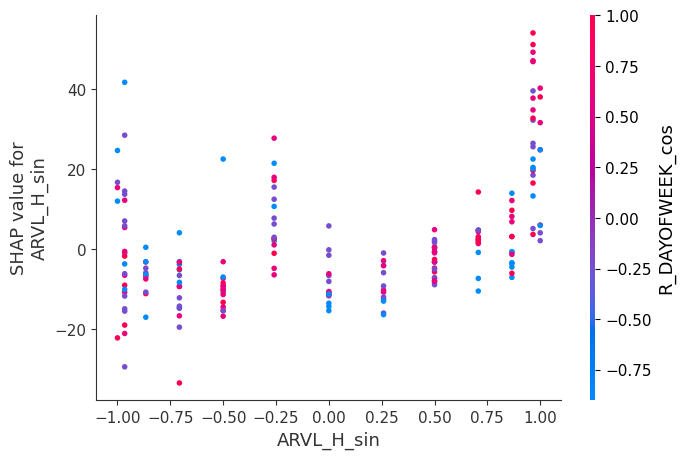

In [194]:
model_to_explain = models[target_to_explain[0]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[0]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[0]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[0]} (without TOTAL_TIME)')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[0]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[0]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[0]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'PLCT_H_sin' (placement hour) affects 'PL_TO_RL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'ARVL_H_sin' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[0]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[0]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for LightGBM_PL_TO_RL for 200 samples from X_test.
Displaying SHAP Summary Plot for LightGBM_PL_TO_RL:


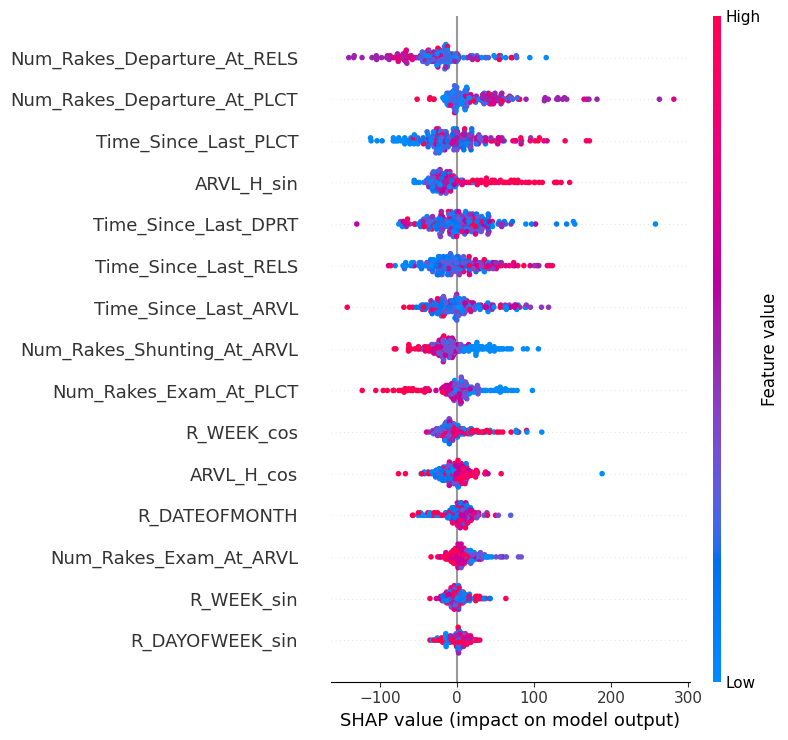

Displaying SHAP Force Plot for instance 0 for LightGBM_PL_TO_RL:


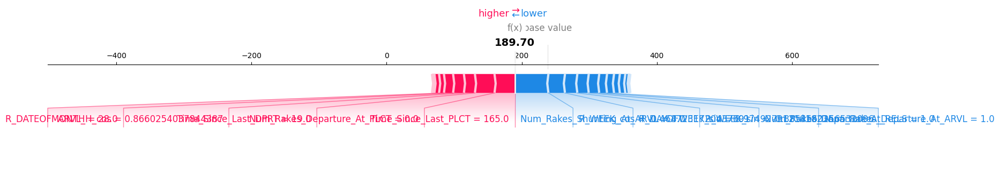


Actual prediction for instance 0: 189.70
Base (Expected) value for LightGBM_PL_TO_RL: 238.25
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs LightGBM_PL_TO_RL:


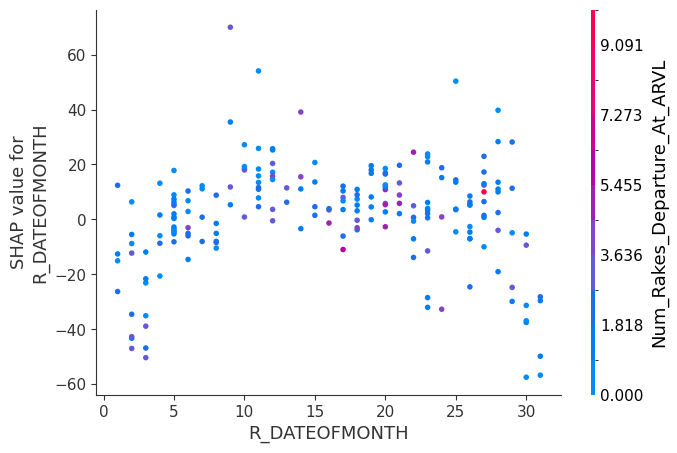

In [195]:
model_to_explain = models[target_to_explain[1]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[1]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[1]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[1]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[1]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[1]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[1]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[1]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[1]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")

Explaining predictions for LightGBM_RL_TO_DP for 200 samples from X_test.
Displaying SHAP Summary Plot for LightGBM_RL_TO_DP:


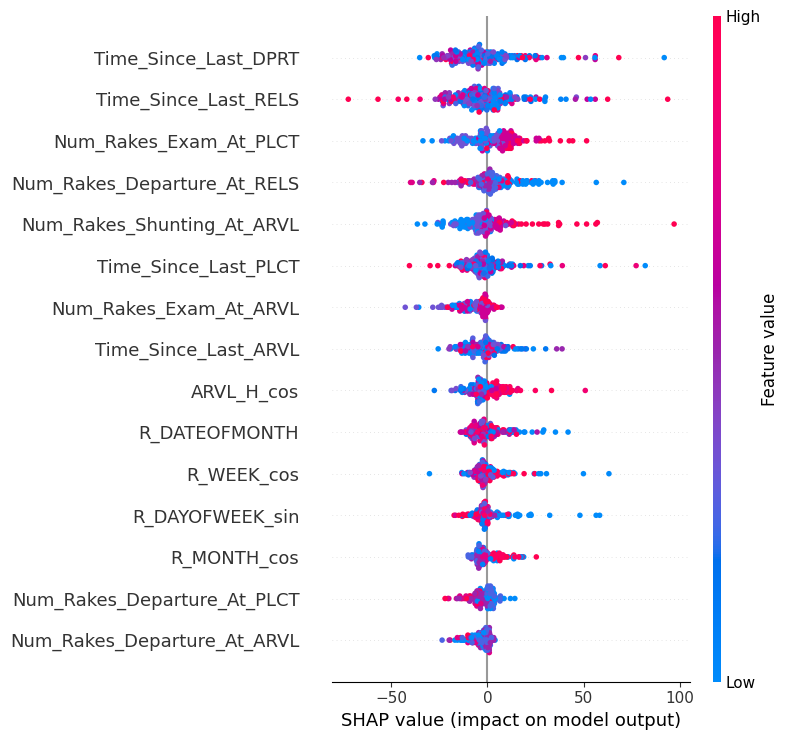

Displaying SHAP Force Plot for instance 0 for LightGBM_RL_TO_DP:


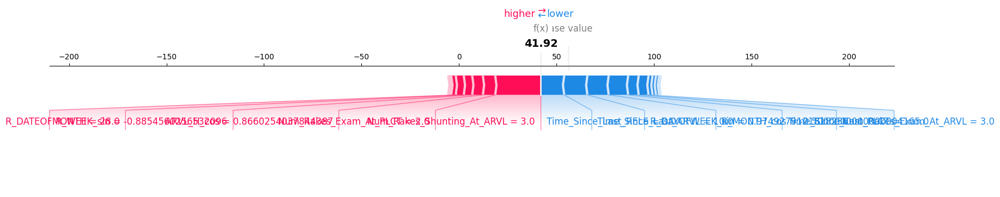


Actual prediction for instance 0: 41.92
Base (Expected) value for LightGBM_RL_TO_DP: 55.93
Interpretation: Red features push the prediction higher, blue features push it lower.

Displaying SHAP Dependence Plot for 'R_DATEOFMONTH' vs LightGBM_RL_TO_DP:


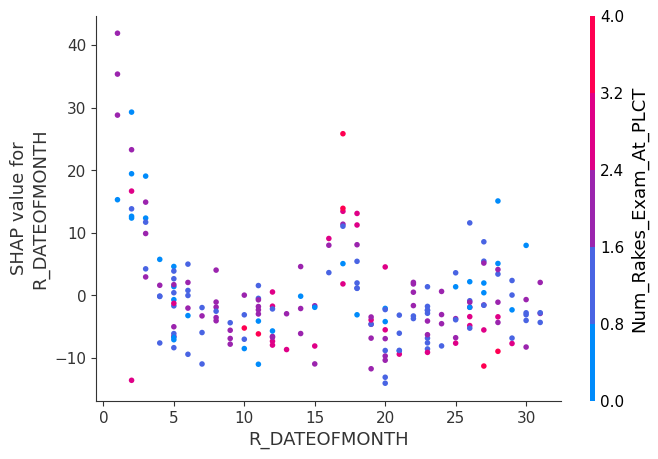

In [196]:
model_to_explain = models[target_to_explain[2]]

explainer1 = shap.TreeExplainer(model_to_explain)

num_samples_to_explain = min(200, X_test.shape[0])
shap_values = explainer1.shap_values(X_test.iloc[:num_samples_to_explain])

print(f"Explaining predictions for {target_to_explain[2]} for {num_samples_to_explain} samples from X_test.")

#Global SHAP Summary Plot (Beeswarm Plot)
print(f"Displaying SHAP Summary Plot for {target_to_explain[2]}:")
shap.summary_plot(shap_values, X_test.iloc[:num_samples_to_explain], plot_type="dot", max_display=15)
#plt.title(f'SHAP Summary for {target_to_explain[2]}')
plt.show()

# Local SHAP Force Plot (for a single prediction)
# Pick a specific instance to explain (e.g., the first one from your test set)
instance_index = 0
if num_samples_to_explain > instance_index:
    print(f"Displaying SHAP Force Plot for instance {instance_index} for {target_to_explain[2]}:")
    base_value = explainer1.expected_value
    shap.force_plot(base_value, shap_values[instance_index], X_test.iloc[instance_index], matplotlib=True)
    #plt.title(f'SHAP Force Plot for Instance {instance_index} ({target_to_explain[2]})')
    plt.show()

    actual_prediction = model_to_explain.predict(X_test.iloc[[instance_index]])[0]
    print(f"\nActual prediction for instance {instance_index}: {actual_prediction:.2f}")
    print(f"Base (Expected) value for {target_to_explain[2]}: {base_value:.2f}")
    print("Interpretation: Red features push the prediction higher, blue features push it lower.")
else:
    print(f"\nNot enough samples ({num_samples_to_explain}) to show force plot for instance {instance_index}. Need at least {instance_index + 1} samples.")

# SHAP Dependence Plot (Feature relationship)
# Example: How 'ARVL_H_sin' (placement hour) affects 'AR_TO_PL' duration.
# You can change 'feature_to_plot' to any other feature you're interested in.
feature_to_plot = 'R_DATEOFMONTH' # Try other features

if feature_to_plot in X_test.columns and num_samples_to_explain > 0:
    print(f"\nDisplaying SHAP Dependence Plot for '{feature_to_plot}' vs {target_to_explain[2]}:")
    shap.dependence_plot(feature_to_plot, shap_values, X_test.iloc[:num_samples_to_explain])
    #plt.title(f'SHAP Dependence Plot: {feature_to_plot} vs {target_to_explain[2]} (without TOTAL_TIME)')
    plt.show()
else:
    print(f"\nCannot create Dependence Plot: '{feature_to_plot}' not found in features or no samples to explain.")